# Pre-steps

In [ ]:
# libraries
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio
import numpy as np
import shutil
from sklearn.metrics import confusion_matrix
import soundfile as sf
from tqdm import tqdm
from nltk.metrics import ConfusionMatrix
from sklearn.metrics import recall_score
import librosa
import os, glob, pickle
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
import torchaudio
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier


import librosa
import librosa.display
import IPython.display as ipd
import cv2
import ast
import h5py

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense



In [1]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import pandas as pd
df_adj = pd.read_csv(r"/content/drive/MyDrive/FYP - SER - Romy & Ismail/rz2/FYP_adjustedDataSet.csv")
df_adj['Path'][0]

'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-03-01-01-01-06.wav'

# DataFrames

In [ ]:
df = pd.read_csv(r"/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/FYP_dataSet.csv")
df_adj = pd.read_csv(r"/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/FYP_adjustedDataSet.csv")
sampled_rows = pd.read_csv(r"/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/FYP_randomDataSet.csv")
sampled_rows_romy = pd.read_csv(r"/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/RandomDatasetRomy1.csv")
annotated_by_Is = pd.read_csv("/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Annotated_by_Ismail.csv")
annotation_romy_30 = pd.read_csv("/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/30_annotation_romy.csv")
annotation_ismail_30 = pd.read_csv("/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/30_annotation_ismail.csv")
merged = pd.read_csv("/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/all_annotations.csv")
Feature_df = pd.read_csv('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Feature_df.csv')
df_romy_stft = pd.read_csv('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Feature_stft_romy_df.csv')
augmented_dataset = pd.read_csv('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/augmented_dataset.csv')

processing_data_aug = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/processing_data_aug.h5'
features_3d_array_h5 = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/features_3d_array.h5'


NameError: name 'pd' is not defined

In [ ]:
Feature_df.head()

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_2234,mfcc_2235,mfcc_2236,mfcc_2237,mfcc_2238,mfcc_2239,mfcc_2240,Gender,Emotion,Intensity
0,-714.253235,-687.298828,-691.327393,-690.576904,-687.761902,-693.757202,-702.427368,-713.835571,-724.318848,-735.256470,...,-7.764277,-11.000034,-12.547881,-11.282824,-9.191419,-8.689136,-5.363835,Female,happy,normal
1,-898.906738,-882.866333,-890.160767,-900.033813,-906.892944,-910.938049,-907.366699,-913.517883,-924.914490,-936.102844,...,0.914323,-0.998566,-7.959559,-7.265224,-2.915686,0.135889,-2.566834,Female,neutral,normal
2,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,...,-3.144763,-5.532895,-4.705377,-5.732381,-14.783504,-13.907163,-16.864986,Female,calm,strong
3,-627.902100,-601.152771,-600.229492,-596.247803,-578.923401,-571.700806,-571.728638,-575.656738,-573.902222,-575.011963,...,-16.640099,-15.374043,-13.693955,-13.211943,-10.481801,-1.734454,-6.023346,Female,happy,normal
4,-950.907349,-938.001892,-929.246460,-918.944275,-925.077454,-933.380737,-929.093079,-925.888794,-920.021851,-921.139832,...,-11.933071,-4.037775,-2.143043,-0.305162,-3.144214,2.687245,3.522888,Female,calm,strong


# EDA / Data Discovery

In [ ]:
# Transforming data into datset
def create_dataset(path):
    """
    Creating a DataFrame containing Modality, Vocal Channel, Emotion,
    Emotional Intensity, Statement, Repetition, Actor, Gender and Path
    of each audio file.
    """
    folders = os.listdir(path)
    data_set = []

    for folder in folders:
        files = os.listdir(os.path.join(path, folder))
        for file in files:
            step = file.split('.')[0]
            step = step.split('-')

            # Extracting individual elements
            modality = int(step[0])
            vocal_channel = int(step[1])
            emotion = int(step[2])
            emotional_intensity = int(step[3])
            statement = int(step[4])
            repetition = int(step[5])
            actor = int(step[6])
            if actor%2 == 0:
              gender = 'Female'
            else:
              gender = 'Male'

            # Creating the row with columns
            row = [modality, vocal_channel, emotion, emotional_intensity, statement, repetition, actor, gender]

            # Adding the path column
            row.append(os.path.join(path, folder, file))

            # Adding the row to the dataset
            data_set.append(row)

    # Define column names
    columns = ['Modality', 'Vocal Channel', 'Emotion', 'Emotional Intensity', 'Statement', 'Repetition', 'Actor', 'Gender', 'Path']

    # Create DataFrame
    df = pd.DataFrame(data_set, columns=columns)

    return df


path = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24'
df = create_dataset(path)
df


,Modality,Vocal Channel,Emotion,Emotional Intensity,Statement,Repetition,Actor,Gender,Path
0,3,1,3,1,1,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1,3,1,1,1,1,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
2,3,1,2,2,1,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
3,3,1,3,1,1,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
4,3,1,2,2,2,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
...,...,...,...,...,...,...,...,...,...
1435,3,1,4,2,2,1,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1436,3,1,7,1,2,1,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1437,3,1,6,2,1,2,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1438,3,1,7,1,2,2,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...


In [ ]:
'''# Save DataFrame to CSV within Google Drive
annotated_by_is_path = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Annotated_by_Is.csv'
data_frame_ismail_anotate.to_csv(annotated_by_is_path, index=False)
print(f"Dataset saved")'''

'# Save DataFrame to CSV within Google Drive\nannotated_by_is_path = r\'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Annotated_by_Is.csv\'\ndata_frame_ismail_anotate.to_csv(annotated_by_is_path, index=False)\nprint(f"Dataset saved")'

In [ ]:
# Define mapping dictionaries
modality_map = {1: 'full-AV', 2: 'video-only', 3: 'audio-only'}
vocal_channel_map = {1: 'speech', 2: 'song'}
emotion_map = {1: 'neutral', 2: 'calm', 3: 'happy', 4: 'sad', 5: 'angry', 6: 'fearful', 7: 'disgust', 8: 'surprised'}
emotional_intensity_map = {1: 'normal', 2: 'strong'}
statement_map = {1: 'Kids are talking by the door', 2: 'Dogs are sitting by the door'}

# Create a function to apply mappings to each column
def apply_mappings(col, mapping):
    """
    Apply mappings to each column
    """
    return col.map(mapping)

# Apply mappings to respective columns
df['Modality'] = apply_mappings(df['Modality'], modality_map)
df['Vocal Channel'] = apply_mappings(df['Vocal Channel'], vocal_channel_map)
df['Emotion'] = apply_mappings(df['Emotion'], emotion_map)
df['Emotional Intensity'] = apply_mappings(df['Emotional Intensity'], emotional_intensity_map)
df['Statement'] = apply_mappings(df['Statement'], statement_map)

# Display the updated DataFrame
df.head()


,Modality,Vocal Channel,Emotion,Emotional Intensity,Statement,Repetition,Actor,Gender,Path
0,audio-only,speech,happy,normal,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1,audio-only,speech,neutral,normal,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
2,audio-only,speech,calm,strong,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
3,audio-only,speech,happy,normal,Kids are talking by the door,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
4,audio-only,speech,calm,strong,Dogs are sitting by the door,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...


In [ ]:
'''# Save DataFrame to CSV within Google Drive
csv_filename = 'FYP_dataSet.csv'
df.to_csv(csv_filename, index=False)
print(f"Dataset saved as {csv_filename}")'''

'# Save DataFrame to CSV within Google Drive\ncsv_filename = \'FYP_dataSet.csv\'\ndf.to_csv(csv_filename, index=False)\nprint(f"Dataset saved as {csv_filename}")'

<ipython-input-12-cdb3395e109c>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette=sns.color_palette('Dark2'))


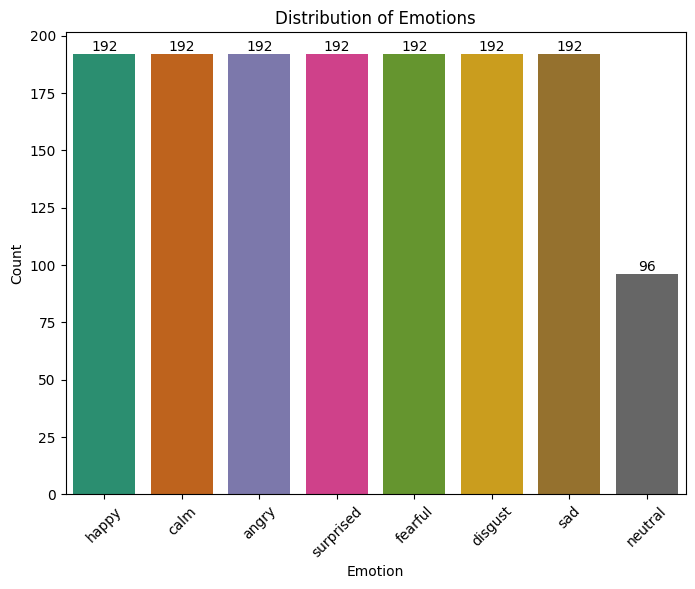

In [ ]:
def plot_emotion_distribution(df):
    """
    Plotting in a bar chart the distribution of emotions in a specified DataFrame.
    """
    # Setting figure size
    plt.figure(figsize=(8,6))

    # Counting the occurrences of each emotion and sorting by emotion name
    emotion_counts = df['Emotion'].value_counts().sort_values(ascending = False)

    # Plotting the bar plot
    ax = sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette=sns.color_palette('Dark2'))

    # Adding data labels to each bar
    for i, count in enumerate(emotion_counts):
        ax.text(i, count, str(count), ha='center', va='bottom', fontsize=10)

    # Setting labels and title
    ax.set_xlabel('Emotion')
    ax.set_ylabel('Count')
    ax.set_title('Distribution of Emotions')

    # Rotating x-axis labels for better readability
    plt.xticks(rotation=45)

    plt.show()

# Plot df
plot_emotion_distribution(df)


In [ ]:
# Select random 100 voices for Annotation

def select_random_rows(df, n=100, random_seed=42):
    """
    Selecting 100 random audios and storing it in a DataFrame
    """
    # Set random seed for reproducibility
    np.random.seed(random_seed)

    # Define the parameters to group by
    group_by_cols = ['Emotion', 'Actor', 'Modality', 'Vocal Channel', 'Emotional Intensity', 'Statement', 'Repetition']

    # Create a DataFrame to store the sampled rows
    sampled_df = pd.DataFrame()

    # Group the dataset by the parameters of interest
    grouped = df.groupby(group_by_cols)

    # Determine the number of rows to sample from each group
    rows_per_group = n // len(grouped)

    # Sample an equal number of rows from each group
    for _, group in grouped:
        if len(group) >= rows_per_group:
            sampled_df = pd.concat([sampled_df, group.sample(rows_per_group)])
        else:
            sampled_df = pd.concat([sampled_df, group])

    # If the total number of sampled rows is less than n, sample the remaining rows randomly
    if len(sampled_df) < n:
        remaining_rows = n - len(sampled_df)
        sampled_df = pd.concat([sampled_df, df.sample(remaining_rows)])

    # Shuffle the sampled DataFrame
    sampled_df = sampled_df.sample(frac=1)

    return sampled_df

sampled_rows = select_random_rows(df, n=100)
sampled_rows.head()


,Modality,Vocal Channel,Emotion,Emotional Intensity,Statement,Repetition,Actor,Gender,Path
746,audio-only,speech,sad,normal,Kids are talking by the door,1,15,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
772,audio-only,speech,surprised,normal,Kids are talking by the door,1,15,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1390,audio-only,speech,happy,strong,Kids are talking by the door,1,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...
78,audio-only,speech,disgust,strong,Kids are talking by the door,1,4,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...
847,audio-only,speech,fearful,normal,Kids are talking by the door,2,13,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...


In [ ]:
# 32 data frame
"""
create a data frame for
Reannotation for  32 differnt sample
"""

df_32_annotation = pd.DataFrame()

# Ensure Reproducability
random_seed = 42
rng = np.random.default_rng(random_seed)

# Loop through each emotion
for emotion in df_adj['Emotion'].unique():
  if emotion == 'neutral':
    #  select 2 samples form neutral
    samples = df_adj[df_adj['Emotion'] == 'neutral'].sample(2, random_state=rng)
  else:
    # 2 from each intensity of each emotion
    normal_samples = df_adj[(df_adj['Emotion'] == emotion) & (df_adj['Emotional Intensity'] == 'normal')].sample(2, random_state=rng)
    strong_samples = df_adj[(df_adj['Emotion'] == emotion) & (df_adj['Emotional Intensity'] == 'strong')].sample(2, random_state=rng)
    samples = pd.concat([normal_samples, strong_samples])

  # Concatenate selected samples for this emotion to the final dataset
  df_32_annotation = pd.concat([df_32_annotation, samples])

df_32_annotation.to_csv(r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/df_32_annotation.csv')

play only audio


In [ ]:
# play audio


def play_audio(path):
  audio = Audio(path)

  return audio




In [ ]:
play_audio('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-08-01-01-02-24.wav')

In [ ]:
# Save DataFrame to CSV within Google Drive
'''
csv_filename = 'FYP_randomDataSet.csv'
sampled_rows.to_csv(csv_filename, index=False)
print(f"Dataset saved as {csv_filename}")

'''

'\ncsv_filename = \'FYP_randomDataSet.csv\'\nsampled_rows.to_csv(csv_filename, index=False)\nprint(f"Dataset saved as {csv_filename}")\n\n'

<ipython-input-12-cdb3395e109c>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=emotion_counts.index, y=emotion_counts.values, palette=sns.color_palette('Dark2'))


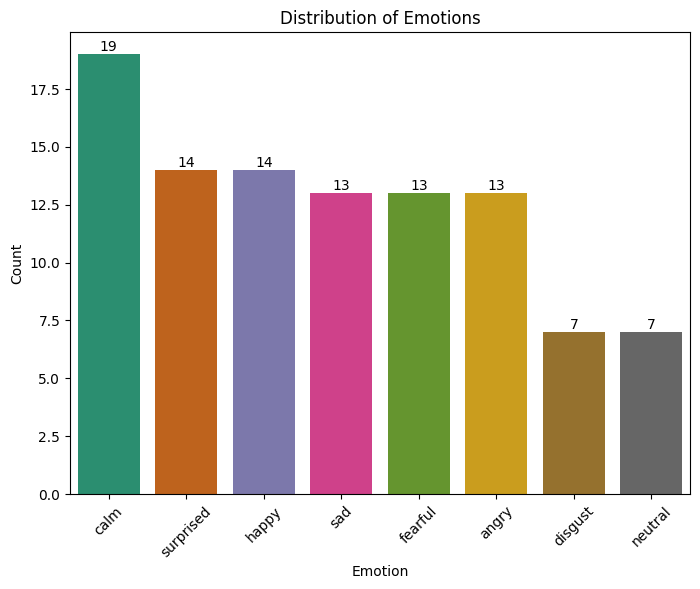

In [ ]:
plot_emotion_distribution(sampled_rows)

In [ ]:
def play_audio_from_df(dataFrame, number, path_index):
    """
    Returns all the information about a specified audio file (slected by row number), along with its audio content.
    """
    # Get the audio path from the specified column index using the row index
    audio_path = dataFrame.iloc[number, path_index]

    # Extract parameters of the voice
    parameters = dataFrame.iloc[number,:]

    # Use IPython's Audio function to play the audio
    audio = Audio(audio_path)

    # Display parameters
    print("Parameters of the voice:")
    print(parameters)

    return audio


In [ ]:
play_audio_from_df(sampled_rows, 7, 8)

Parameters of the voice:
Modality                                                      audio-only
Vocal Channel                                                     speech
Emotion                                                              sad
Emotional Intensity                                               strong
Statement                                   Dogs are sitting by the door
Repetition                                                             1
Actor                                                                 11
Gender                                                              Male
Path                   /content/drive/MyDrive/FYP - SER - Romy & Isma...
Name: 275, dtype: object


In [ ]:
# Get Duration of specefic audio

def get_audio_duration(audio_path):
    """
    Returns the duration of an AudiO FIles
    """
    try:
        with sf.SoundFile(audio_path) as audio_file:
            return len(audio_file) / audio_file.samplerate
    except Exception as e:
        print("Error:", e)
        return None

get_audio_duration('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/randomDataSet/03-01-01-01-01-01-17.wav')

3.8371666666666666

In [ ]:
# Progress Bar

progress_bar = tqdm(total=len(df))

def apply_duration_caluclation(row):
    global progress_bar
    progress_bar.update(1)
    return get_audio_duration(row['Path'])

df['Audio Length'] = df.apply(apply_duration_caluclation, axis=1)
progress_bar.close()

100%|██████████| 1440/1440 [11:23<00:00,  2.11it/s]


In [ ]:
df['Audio Length'] = df['Path'].apply(get_audio_duration)
df.head()

,Modality,Vocal Channel,Emotion,Emotional Intensity,Statement,Repetition,Actor,Gender,Path,Audio Length
0,audio-only,speech,happy,normal,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.536854
1,audio-only,speech,neutral,normal,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.336667
2,audio-only,speech,calm,strong,Kids are talking by the door,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,4.504500
3,audio-only,speech,happy,normal,Kids are talking by the door,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.603604
4,audio-only,speech,calm,strong,Dogs are sitting by the door,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,4.771438


In [ ]:
df['Audio Length'].mean()

3.700664814814815

In [ ]:
get_audio_duration('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-03-01-01-01-06.wav')

3.5368541666666666

In [ ]:
df['Audio Length'].describe()

count    1440.000000
mean        3.700665
std         0.336676
min         2.936271
25%         3.470146
50%         3.670333
75%         3.870542
max         5.271937
Name: Audio Length, dtype: float64

In [ ]:
df.dtypes

Modality                object
Vocal Channel           object
Emotion                 object
Emotional Intensity     object
Statement               object
Repetition               int64
Actor                    int64
Gender                  object
Path                    object
Audio Length           float64
dtype: object

In [ ]:
voice_channel_frame = df['Vocal Channel'].value_counts().to_frame()
voice_channel_frame

,count
Vocal Channel,
speech,1440


In [ ]:
modality_frame = df['Modality'].value_counts().to_frame()
modality_frame

,count
Modality,
audio-only,1440


In [ ]:
statement_frame = df['Statement'].value_counts().to_frame()
statement_frame

,count
Statement,
Kids are talking by the door,720
Dogs are sitting by the door,720


In [ ]:
repetition_frame = df['Repetition'].value_counts().to_frame()
repetition_frame

,count
Repetition,
1,720
2,720


In [ ]:
gender_frame = df['Gender'].value_counts().to_frame()
gender_frame

,count
Gender,
Female,720
Male,720


In [ ]:
emotion_frame = df['Emotion'].value_counts().to_frame()
emotion_frame

,count
Emotion,
happy,192
calm,192
angry,192
surprised,192
fearful,192
disgust,192
sad,192
neutral,96


In [ ]:
intensity_frame = df['Emotional Intensity'].value_counts().to_frame()
intensity_frame

,count
Emotional Intensity,
normal,768
strong,672


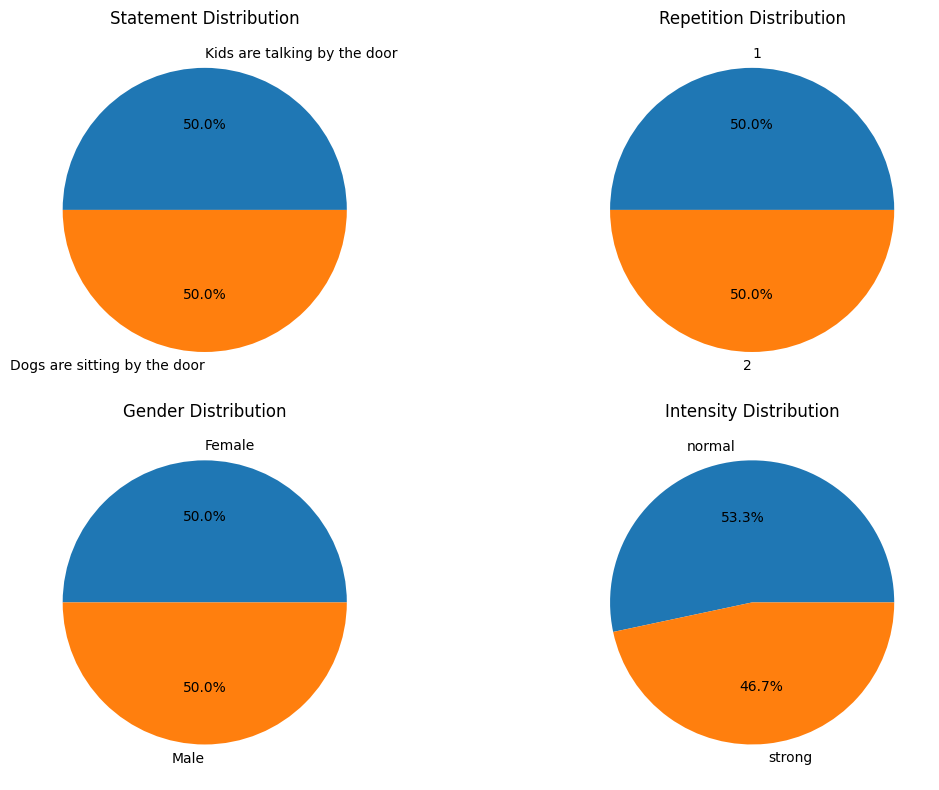

In [ ]:
# Plot the distribution of Emotional Intensity, Statement, Repetition, Gender, Modality
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Changes ncols to 4 if you want to add emotions

statement_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[0][0], legend=False)
axes[0][0].set_title('Statement Distribution')
axes[0][0].set_ylabel('')

repetition_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[0][1], legend = False)
axes[0][1].set_title('Repetition Distribution')
axes[0][1].set_ylabel('')

gender_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[1][0], legend = False)
axes[1][0].set_title('Gender Distribution')
axes[1][0].set_ylabel('')

#emotion_frame.plot.pie(y='count', autopct='%.1f%%', ax=axes[0][3], legend = False)
#axes[0][3].set_title('Emotion Distribution')
#axes[0][3].set_ylabel('')

intensity_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[1][1], legend = False)
axes[1][1].set_title('Intensity Distribution')
axes[1][1].set_ylabel('')
"""
voice_channel_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[1][1], legend=False)
axes[1][1].set_title('Voice Channel Distribution')
axes[1][1].set_ylabel('')

modality_frame.plot.pie(y='count', autopct='%1.1f%%', ax=axes[1][2], legend=False)
axes[1][2].set_title('Modality Distribution')
axes[1][2].set_ylabel('')
"""
#axes[1][1].axis('off')
#axes[1][2].axis('off')

# Adjust layout to prevent overlap of axis labels
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
len(df['Path'].unique())

1440

In [ ]:
# Grouping by 'Emotion'
df_grouped = df.groupby('Emotion')

In [ ]:
def plot_by_emotion(column, ax):
  """
  Plots the distribution of the specified column on the specified axes across emotions and displays counts on top of each bar plot
  """

  # Aggregate the count of the specified column for each emotion
  emotion_column_counts = df_grouped[column].value_counts().unstack().fillna(0)

  # Plotting the distribution of the specified column for all emotions
  emotion_column_counts.plot(kind='bar', stacked=True, ax=ax)
  ax.set_title(f'Distribution of {column} Across Emotions')
  ax.set_xlabel('Emotion')
  ax.set_ylabel('Count')
  ax.legend(title=column, bbox_to_anchor=(0.5, 1.15), loc='upper center', shadow=True, fontsize='medium', ncol=2)
  ax.tick_params(axis='x', rotation=45)

  # Adding text labels on top of each bar
  for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')


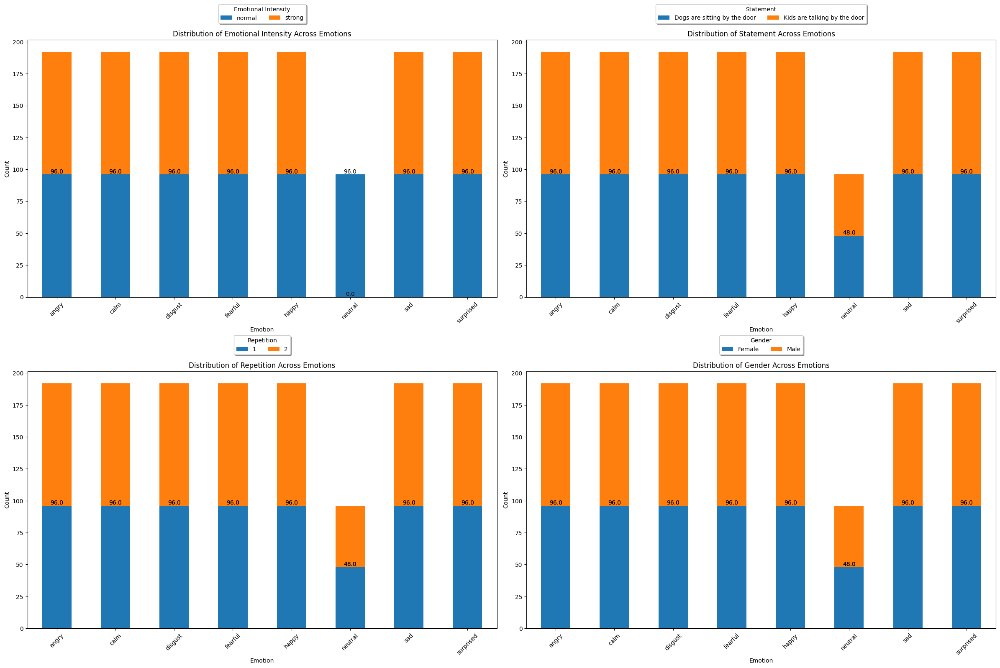

In [ ]:
# Plot Emotional Intensity, Statement, Repetition, Gender, Modality distributed across emotions
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(24, 16))

plot_by_emotion('Emotional Intensity', axes[0][0])
plot_by_emotion('Statement', axes[0][1])
plot_by_emotion('Repetition', axes[1][0])
plot_by_emotion('Gender', axes[1][1])
#plot_by_emotion('Vocal Channel', axes[1][1])
#plot_by_emotion('Modality', axes[1][2])

#axes[1][3].axis('off')

# Adjust layout to prevent overlap of axis labels
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Dropping Vocal Channel, Modality and Statements columns from df
df_adj = df.drop(columns = ['Vocal Channel','Modality', 'Statement'])
df_adj

,Emotion,Emotional Intensity,Repetition,Actor,Gender,Path,Audio Length
0,happy,normal,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.536854
1,neutral,normal,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.336667
2,calm,strong,1,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,4.504500
3,happy,normal,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.603604
4,calm,strong,2,6,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,4.771438
...,...,...,...,...,...,...,...
1435,sad,strong,1,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.470125
1436,disgust,normal,1,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.603604
1437,fearful,strong,2,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.903896
1438,disgust,normal,2,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,3.770437


In [ ]:
csv_filename = 'FYP_adjustedDataSet.csv'
df_adj.to_csv(csv_filename, index=False)
print(f"Dataset saved as {csv_filename}")

Dataset saved as FYP_adjustedDataSet.csv


In [ ]:
play_audio_from_df(df_adj, 5, 5)

Parameters of the voice:
Emotion                                                          neutral
Emotional Intensity                                               normal
Repetition                                                             1
Actor                                                                  6
Gender                                                            Female
Path                   /content/drive/MyDrive/FYP - SER - Romy & Isma...
Audio Length                                                    3.403396
Name: 5, dtype: object


# Heatmaps

In [ ]:
def merge_csv(df):
  """
  Merges 2 DataFrames (sampled_rows and the df assigned) on 'Path'
  """
  merged_df = sampled_rows.merge(df, on = 'Path')
  merged_df.drop(columns = ['Repetition',	'Actor',	'Gender', 'Statement', 'Modality', 'Vocal Channel'], inplace = True)
  #merged_df.sort_values(by='Path',ascending=True)
  return merged_df

In [ ]:
# Romy Annotaton
merged_df = merge_csv(sampled_rows_romy)
merged_df.rename(columns = {'Emotion_x':'Actual Emotion','Emotional Intensity_x':'Actual Intensity','Emotion_y':'Romy Emotion','Emotional Intensity_y':'Romy Intensity'},inplace = True)
merged_df

,Actual Emotion,Actual Intensity,Path,Romy Emotion,Romy Intensity
0,sad,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,normal
1,surprised,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,normal
2,happy,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,strong
3,disgust,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,strong
4,fearful,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,angry,normal
...,...,...,...,...,...
95,sad,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,calm,normal
96,happy,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,normal
97,disgust,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,strong
98,surprised,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...,surprised,normal


In [ ]:
 # ismail annotation
 annotated_by_Is.rename(columns = {'Observed Emotion':'Ismail Emotion','Observed Intensity':'Ismail Intensity'}, inplace = True)
 annotated_by_Is.head()

,Actor,Emotion,Emotional Intensity,Ismail Emotion,Ismail Intensity,Path
0,Female,sad,normal,calm,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...
1,Female,calm,normal,calm,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...
2,Male,surprised,strong,surprised,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...
3,Male,angry,normal,angry,normal,/content/drive/MyDrive/FYP - SER - Romy & Isma...
4,Male,angry,normal,angry,strong,/content/drive/MyDrive/FYP - SER - Romy & Isma...


In [ ]:
# Ismail annotation and romy annotation merged together

Ismail_and_romy_annotationn = pd.merge(merged_df, annotated_by_Is, on = 'Path', how = 'inner')
Ismail_and_romy_annotationn = Ismail_and_romy_annotationn[['Path','Actor','Actual Emotion','Romy Emotion','Ismail Emotion','Actual Intensity','Romy Intensity','Ismail Intensity']]
Ismail_and_romy_annotationn.head()



,Path,Actor,Actual Emotion,Romy Emotion,Ismail Emotion,Actual Intensity,Romy Intensity,Ismail Intensity
0,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,sad,disgust,sad,normal,normal,normal
1,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,surprised,disgust,disgust,normal,normal,normal
2,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,happy,happy,happy,strong,strong,strong
3,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Female,disgust,disgust,disgust,strong,strong,normal
4,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,fearful,angry,fearful,normal,normal,normal


In [ ]:
# Confusion Matrix / Heatmap Data set
'''
Cm_path = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ready_to_CM.csv'
Ready_to_CM = pd.read_csv(Cm_path)
Ready_to_CM.head()
'''

"\nCm_path = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ready_to_CM.csv'\nReady_to_CM = pd.read_csv(Cm_path)\nReady_to_CM.head()\n"

In [ ]:
#  Data frame for 15d Confusion matrix
Confusion_Matrix_df = Ismail_and_romy_annotationn.copy()

# Concatenating columns
Confusion_Matrix_df['Emotion_intensity'] = Confusion_Matrix_df['Actual Emotion'] + ' ' + Confusion_Matrix_df['Actual Intensity']
Confusion_Matrix_df['Emotion_intensity_romy'] = Confusion_Matrix_df['Romy Emotion'] + ' ' + Confusion_Matrix_df['Romy Intensity']
Confusion_Matrix_df['Emotion_intensity_ismail'] = Confusion_Matrix_df['Ismail Emotion'] + ' ' + Confusion_Matrix_df['Ismail Intensity']

# Drop Columns
Confusion_Matrix_df.drop(columns=['Actual Emotion', 'Romy Emotion', 'Romy Intensity', 'Actual Intensity', 'Ismail Emotion', 'Ismail Intensity'], inplace=True)

Confusion_Matrix_df.head()

,Path,Actor,Emotion_intensity,Emotion_intensity_romy,Emotion_intensity_ismail
0,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,sad normal,disgust normal,sad normal
1,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,surprised normal,disgust normal,disgust normal
2,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,happy strong,happy strong,happy strong
3,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Female,disgust strong,disgust strong,disgust normal
4,/content/drive/MyDrive/FYP - SER - Romy & Isma...,Male,fearful normal,angry normal,fearful normal


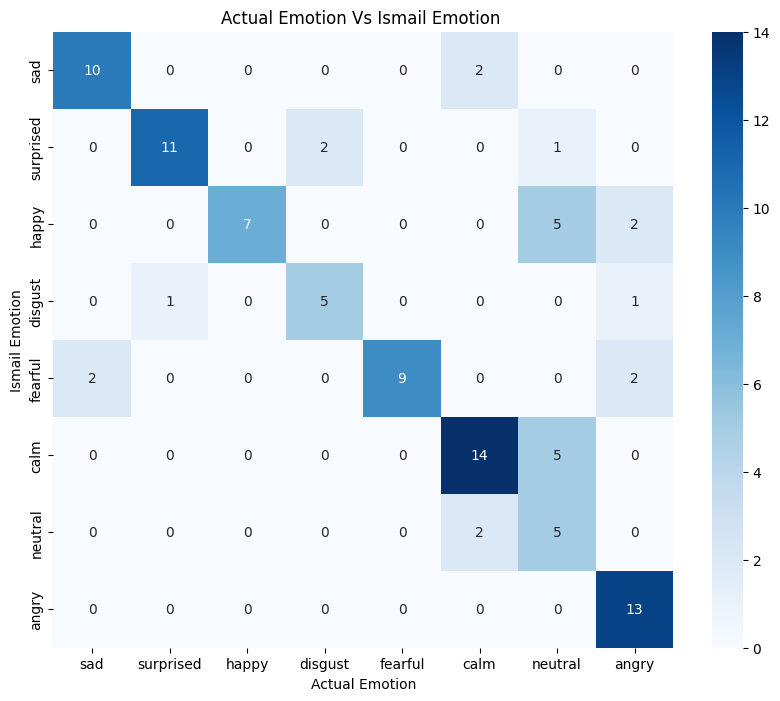

In [ ]:


def plot_confusion_matrix(df, actual_col, predicted_col):
    '''
    Plot confusion matrix for given emotions or intensity
    '''
    actual_labels = df[actual_col]
    predicted_labels = df[predicted_col]

    # Concatenate actual and predicted labels to get unique labels
    labels = pd.concat([actual_labels, predicted_labels]).unique()
    #labels = ['Happy', 'Surprised','Calm','Neutral','Disgust','Fearful','Sad','Angry']
    # Create confusion matrix
    cm = confusion_matrix(actual_labels, predicted_labels, labels=labels)

    # Convert to DataFrame for better visualization
    cm_df = pd.DataFrame(cm, index=labels, columns=labels)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, cmap='Blues', fmt='g')
    plt.title(f'{actual_col} Vs {predicted_col} ')
    plt.xlabel(f'{actual_col}')
    plt.ylabel(f'{predicted_col}')
    plt.show()

# Example usage
plot_confusion_matrix(Ismail_and_romy_annotationn, 'Actual Emotion', 'Ismail Emotion')


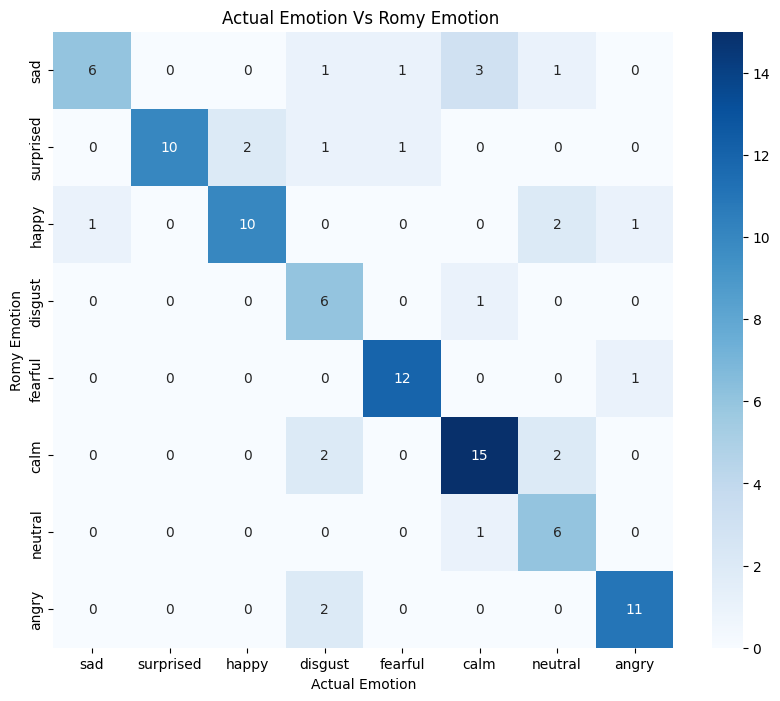

In [ ]:
# Rommy
plot_confusion_matrix(Ismail_and_romy_annotationn,'Actual Emotion','Romy Emotion')

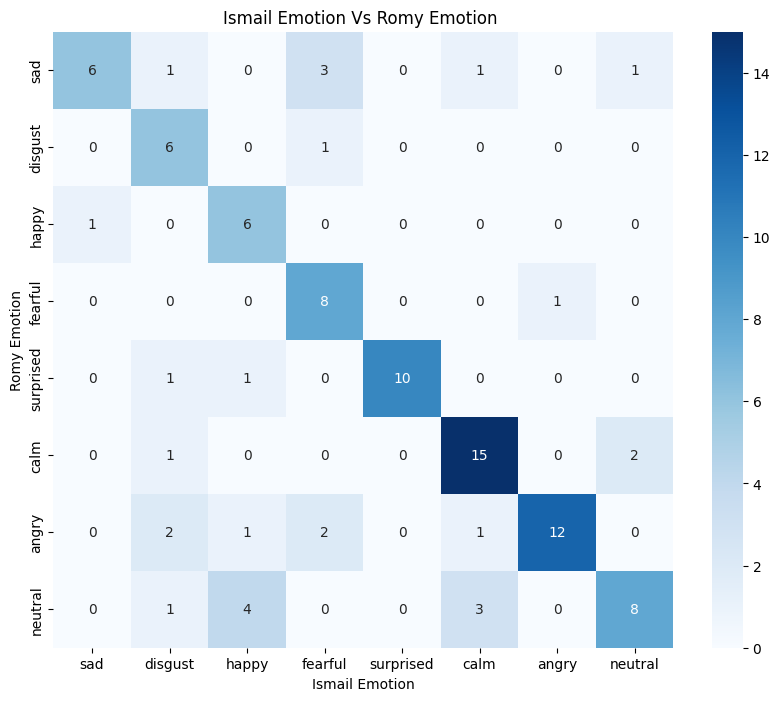

In [ ]:
# romy vs ismail
plot_confusion_matrix(Ismail_and_romy_annotationn,'Ismail Emotion','Romy Emotion')

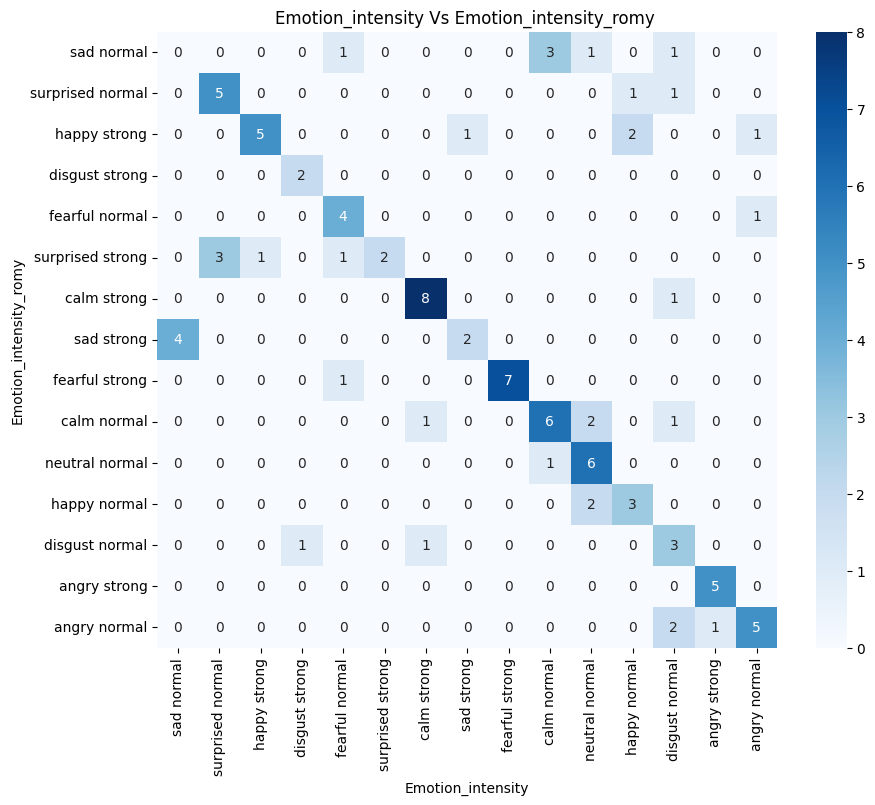

In [ ]:
# Romy
plot_confusion_matrix(Confusion_Matrix_df,'Emotion_intensity','Emotion_intensity_romy')

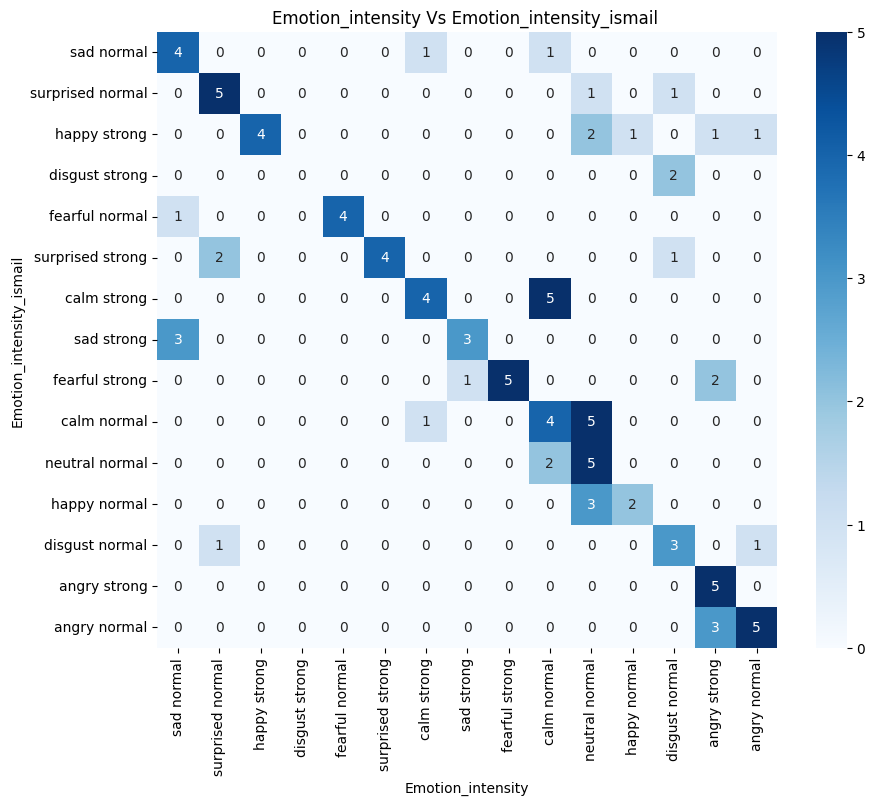

In [ ]:
# ismail
plot_confusion_matrix(Confusion_Matrix_df,'Emotion_intensity','Emotion_intensity_ismail')

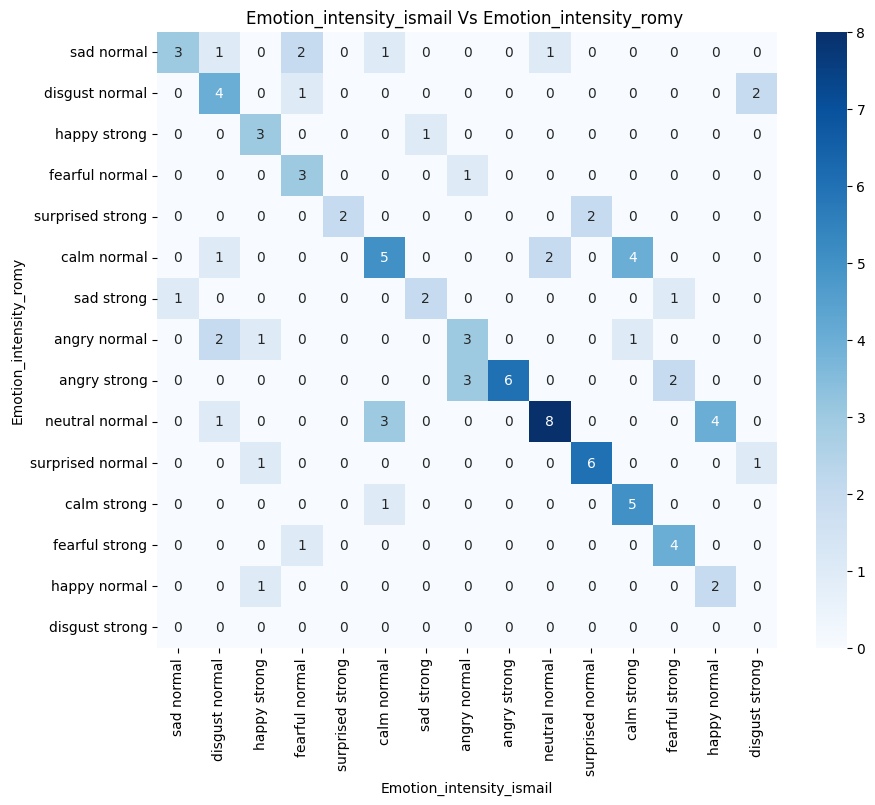

In [ ]:
plot_confusion_matrix(Confusion_Matrix_df,'Emotion_intensity_ismail','Emotion_intensity_romy')

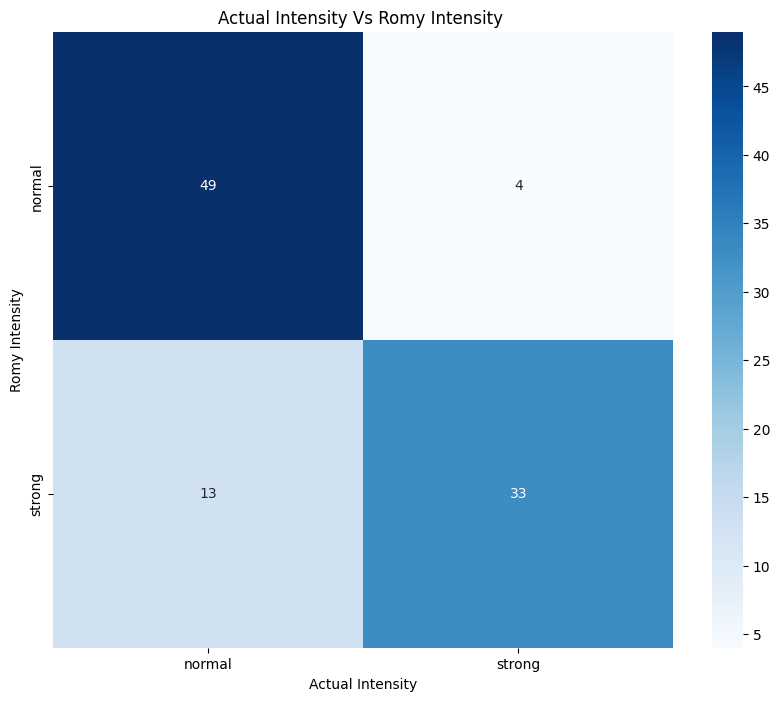

In [ ]:
# romy
plot_confusion_matrix(Ismail_and_romy_annotationn,'Actual Intensity','Romy Intensity')

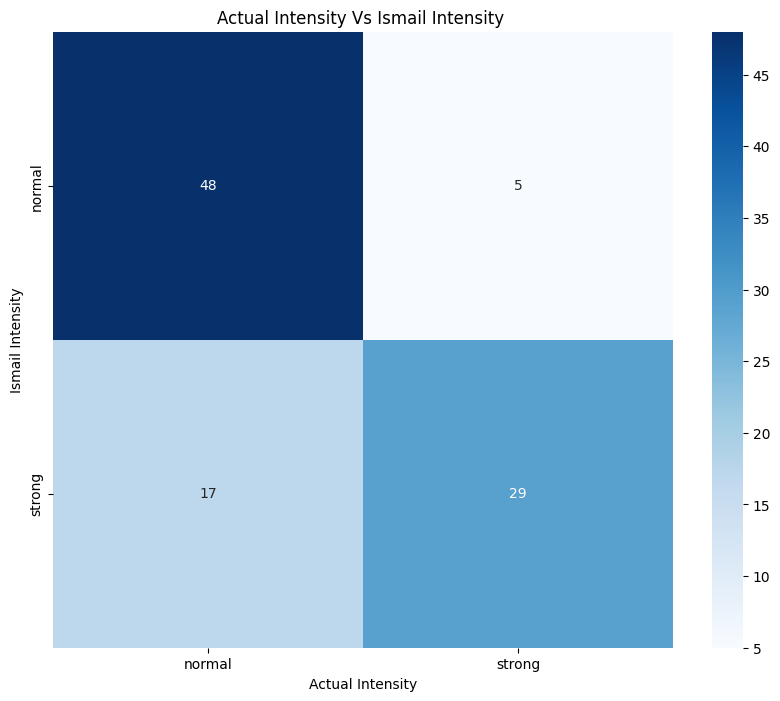

In [ ]:
plot_confusion_matrix(Ismail_and_romy_annotationn,'Actual Intensity','Ismail Intensity')

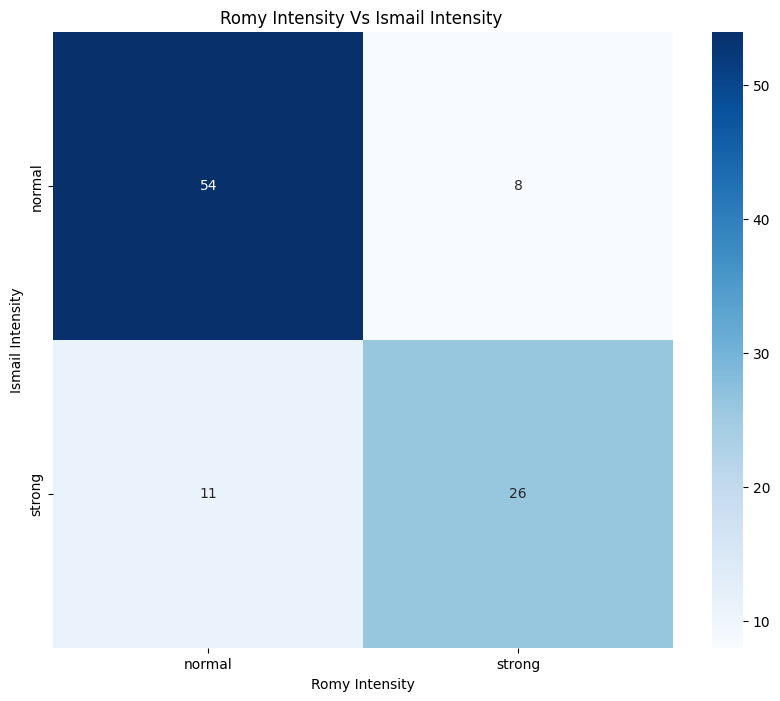

In [ ]:
plot_confusion_matrix(Ismail_and_romy_annotationn,'Romy Intensity','Ismail Intensity')

In [ ]:

def plot_heatmap(df, xcolumn, ycolumn):

  """
  Transforms the given dataframe into a pivot table for the specified columns, then plots their heatmap.
  """

  # Create pivot table
  pivot_df = df.pivot_table(index=ycolumn, columns=xcolumn, aggfunc="size", fill_value=0)

  # Plot heatmap
  plt.figure(figsize=(8, 6))
  sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt="d")
  plt.title(f'{ycolumn} Vs {xcolumn}')
  plt.xlabel(xcolumn)
  plt.ylabel(ycolumn)
  plt.show()


# Merge Romy and Ismail's annotation in a dataframe "merged_annotation_30"
merged_annotation_30 = annotation_romy_30.merge(annotation_ismail_30, how = "inner")
merged_annotation_30.head()

,Unnamed: 0,Emotion,Romy Emotion,Emotional Intensity,Romy Intensity,Repetition,Actor,Gender,Path,Ismail Emotion,Ismail Intensity
0,133,happy,happy,normal,normal,2,17,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,neutral,normal
1,1136,happy,happy,normal,normal,2,7,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,neutral,normal
2,618,happy,happy,strong,strong,2,10,Female,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,strong
3,1394,happy,happy,strong,strong,2,3,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,strong
4,1003,neutral,neutral,normal,normal,1,19,Male,/content/drive/MyDrive/FYP - SER - Romy & Isma...,calm,normal


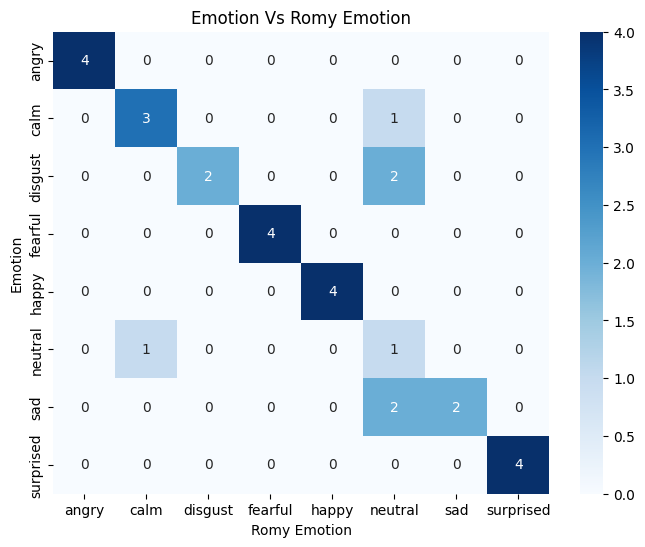

In [ ]:
# Actual Emotion Vs Romy Emotion

plot_heatmap(merged_annotation_30, "Romy Emotion", "Emotion")

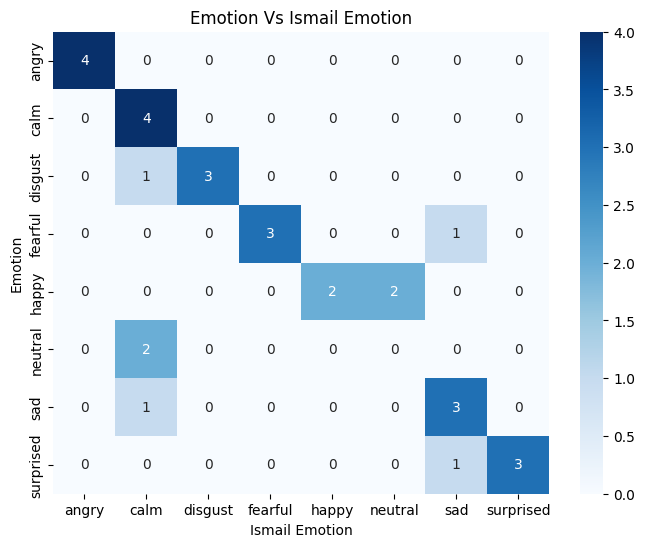

In [ ]:
# Actual Emotion Vs Ismail Emotion

plot_heatmap(merged_annotation_30, "Ismail Emotion", "Emotion")

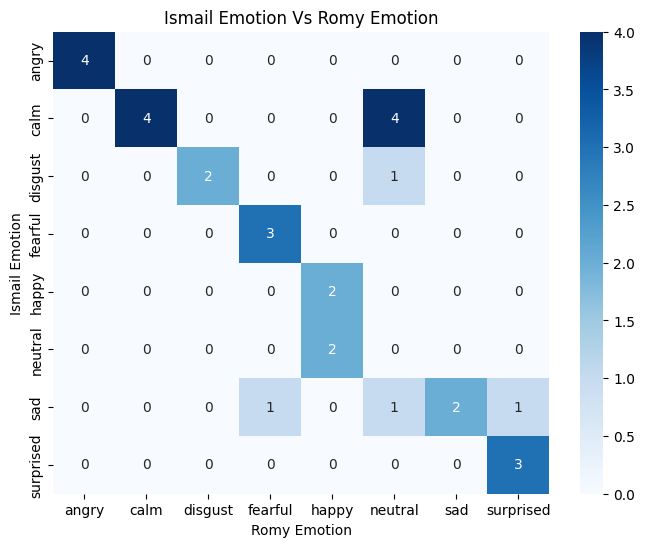

In [ ]:
# Romy Emotion Vs Ismail Emotion

plot_heatmap(merged_annotation_30, "Romy Emotion", "Ismail Emotion")

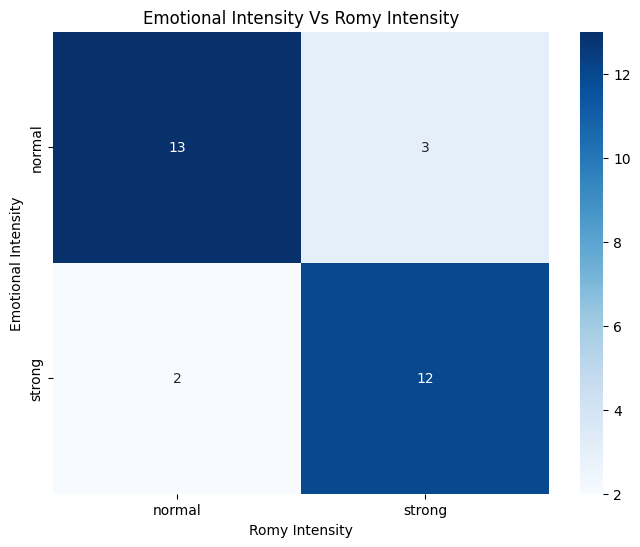

In [ ]:
# Actual Intensity Vs Romy Intensiity

plot_heatmap(merged_annotation_30, "Romy Intensity", "Emotional Intensity")

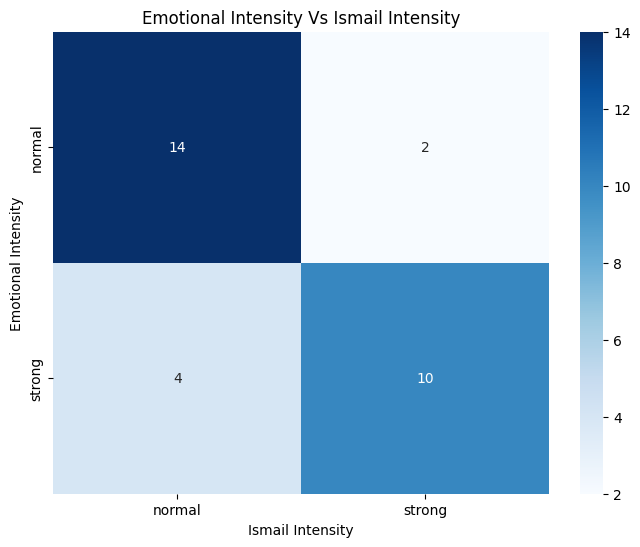

In [ ]:
# Actual Intensity Vs Ismail Intensiity

plot_heatmap(merged_annotation_30, "Ismail Intensity", "Emotional Intensity")

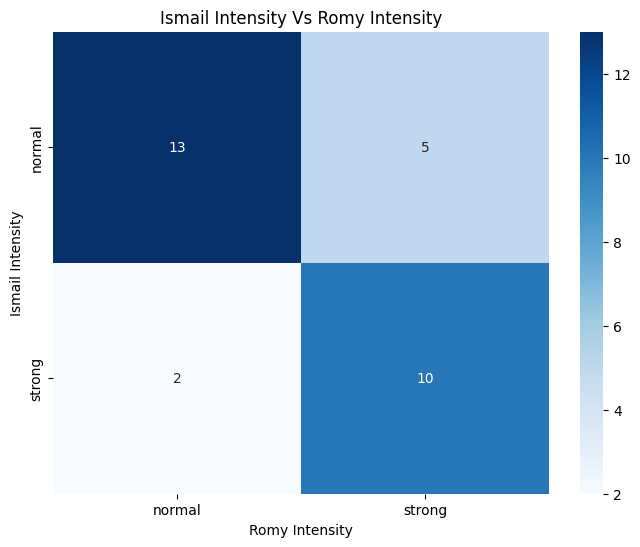

In [ ]:
# Ismail Intensity Vs Romy Intensiity

plot_heatmap(merged_annotation_30, "Romy Intensity", "Ismail Intensity")

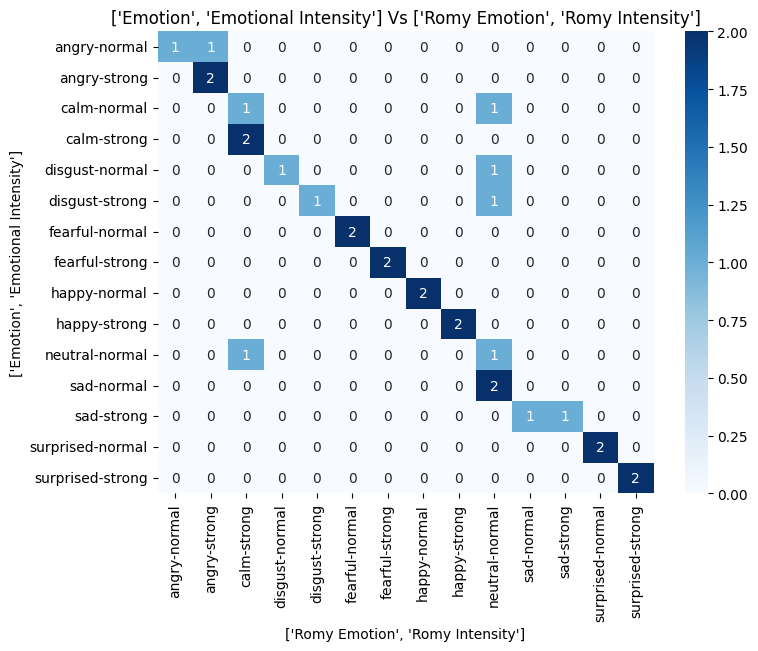

In [ ]:
# Romy Emotion + Intensity Vs Actual Emotion + Intensiity

plot_heatmap(merged_annotation_30, ["Romy Emotion","Romy Intensity"], ["Emotion", "Emotional Intensity"])

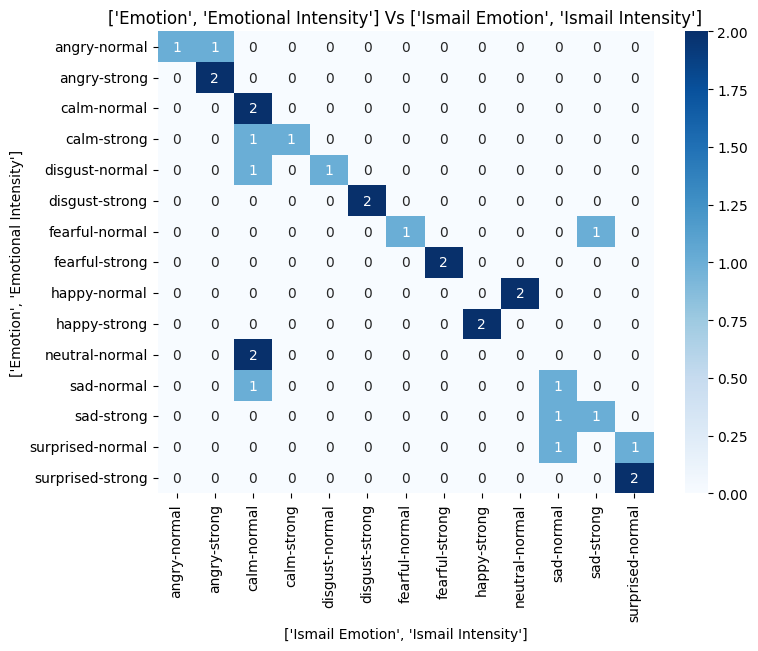

In [ ]:
# Ismail Emotion + Intensity Vs Actual Emotion + Intensiity

plot_heatmap(merged_annotation_30, ["Ismail Emotion","Ismail Intensity"], ["Emotion", "Emotional Intensity"])

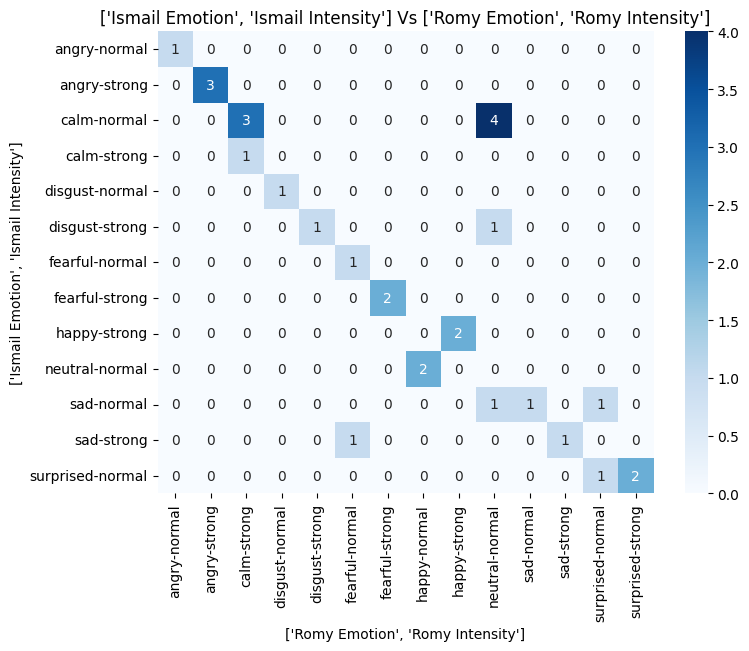

In [ ]:
# Romy Emotion + Intensity Vs Ismail Emotion + Intensiity

plot_heatmap(merged_annotation_30, ["Romy Emotion","Romy Intensity"], ["Ismail Emotion", "Ismail Intensity"])

In [ ]:
Ismail_and_romy_annotationn.rename(columns = {'Actual Emotion':'Emotion', 'Actual Intensity':'Emotional Intensity'	}, inplace = True)
Ismail_and_romy_annotationn.drop(columns = 'Actor', inplace = True)
merged_annotation_30.drop(columns = ['Repetition', 'Actor', 'Gender'], inplace = True)
Ismail_and_romy_annotationn.head()

,Path,Emotion,Romy Emotion,Ismail Emotion,Emotional Intensity,Romy Intensity,Ismail Intensity
0,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,disgust,sad,normal,normal,normal
1,/content/drive/MyDrive/FYP - SER - Romy & Isma...,surprised,disgust,disgust,normal,normal,normal
2,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,happy,happy,strong,strong,strong
3,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,disgust,disgust,strong,strong,normal
4,/content/drive/MyDrive/FYP - SER - Romy & Isma...,fearful,angry,fearful,normal,normal,normal


In [ ]:
merged = Ismail_and_romy_annotationn.merge(merged_annotation_30, on = ['Path','Emotion', 'Emotional Intensity'], how = 'outer')
merged

,Path,Emotion,Romy Emotion_x,Ismail Emotion_x,Emotional Intensity,Romy Intensity_x,Ismail Intensity_x,Unnamed: 0,Romy Emotion_y,Romy Intensity_y,Ismail Emotion_y,Ismail Intensity_y
0,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,disgust,sad,normal,normal,normal,NaN,NaN,NaN,NaN,NaN
1,/content/drive/MyDrive/FYP - SER - Romy & Isma...,surprised,disgust,disgust,normal,normal,normal,NaN,NaN,NaN,NaN,NaN
2,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,happy,happy,strong,strong,strong,NaN,NaN,NaN,NaN,NaN
3,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,disgust,disgust,strong,strong,normal,NaN,NaN,NaN,NaN,NaN
4,/content/drive/MyDrive/FYP - SER - Romy & Isma...,fearful,angry,fearful,normal,normal,normal,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
121,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,NaN,NaN,strong,NaN,NaN,1211.0,neutral,normal,disgust,strong
122,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,NaN,NaN,normal,NaN,NaN,935.0,neutral,normal,sad,normal
123,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,NaN,NaN,normal,NaN,NaN,208.0,neutral,normal,calm,normal
124,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,NaN,NaN,strong,NaN,NaN,511.0,sad,normal,sad,normal


In [ ]:
merged['Romy Emotion_x'].fillna(merged['Romy Emotion_y'], inplace=True)
merged['Ismail Emotion_x'].fillna(merged['Ismail Emotion_y'], inplace=True)
merged['Romy Intensity_x'].fillna(merged['Romy Intensity_y'], inplace=True)
merged['Ismail Intensity_x'].fillna(merged['Ismail Intensity_y'], inplace=True)
merged.drop(columns =  ['Romy Emotion_y', 'Romy Intensity_y', 'Ismail Emotion_y', 'Ismail Intensity_y', 'Unnamed: 0'], inplace = True)
merged.rename(columns = {'Romy Emotion_x': 'Romy Emotion', 'Ismail Emotion_x':'Ismail Emotion', 'Romy Intensity_x':'Romy Intensity', 'Ismail Intensity_x': 'Ismail Intensity'}, inplace = True)
merged

,Path,Emotion,Romy Emotion,Ismail Emotion,Emotional Intensity,Romy Intensity,Ismail Intensity
0,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,disgust,sad,normal,normal,normal
1,/content/drive/MyDrive/FYP - SER - Romy & Isma...,surprised,disgust,disgust,normal,normal,normal
2,/content/drive/MyDrive/FYP - SER - Romy & Isma...,happy,happy,happy,strong,strong,strong
3,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,disgust,disgust,strong,strong,normal
4,/content/drive/MyDrive/FYP - SER - Romy & Isma...,fearful,angry,fearful,normal,normal,normal
...,...,...,...,...,...,...,...
121,/content/drive/MyDrive/FYP - SER - Romy & Isma...,disgust,neutral,disgust,strong,normal,strong
122,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,neutral,sad,normal,normal,normal
123,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,neutral,calm,normal,normal,normal
124,/content/drive/MyDrive/FYP - SER - Romy & Isma...,sad,sad,sad,strong,normal,normal


In [ ]:
csv_filename = 'all_annotations.csv'
merged.to_csv(csv_filename, index=False)
print(f"Dataset saved as {csv_filename}")

Dataset saved as all_annotations.csv


In [ ]:
def plot_heatmap_subplots(df, xcolumn, ycolumn, ax):

  """
  Transforms the given dataframe into a pivot table for the specified columns, then plots their heatmap using axes. And returns the pivot table.
  """

  # Create pivot table
  pivot_df = df.pivot_table(index=ycolumn, columns=xcolumn, aggfunc="size", fill_value=0)

  # Plot heatmap
  plt.figure(figsize=(8, 6))
  sns.heatmap(pivot_df, annot=True, cmap="Blues", fmt="d", ax=ax)
  ax.set_title(f'{ycolumn} Vs {xcolumn}')
  ax.set_xlabel(xcolumn)
  ax.set_ylabel(ycolumn)

  return pivot_df


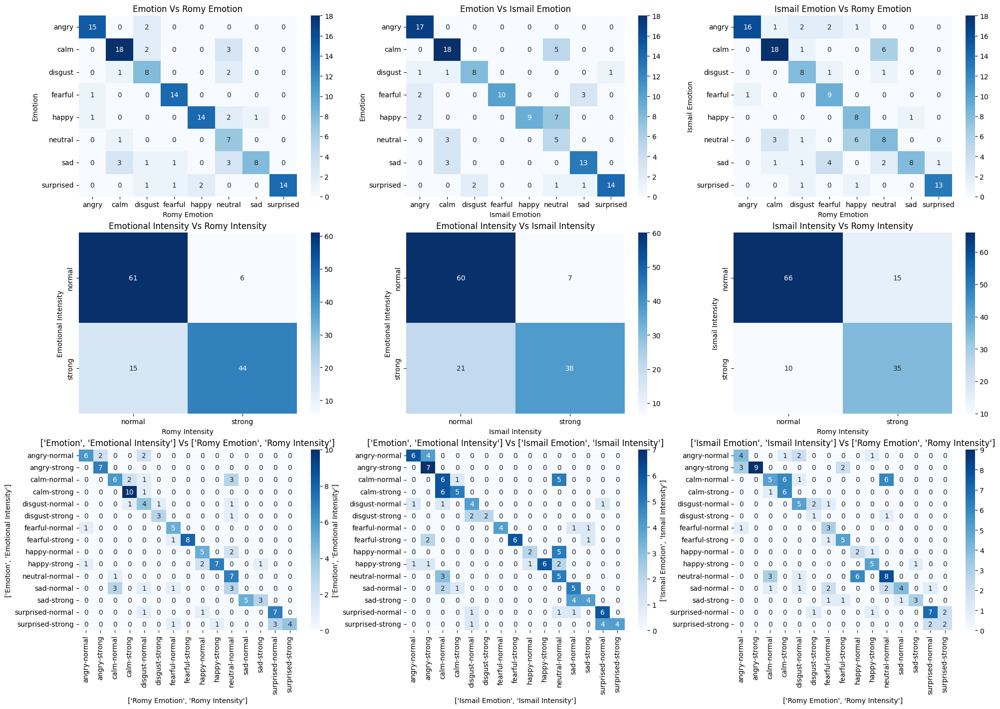

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

In [ ]:
# Plot heatmaps
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(24, 16))

pt_RE_E = plot_heatmap_subplots(merged, "Romy Emotion", "Emotion", axes[0][0])
pt_IE_E = plot_heatmap_subplots(merged, "Ismail Emotion", "Emotion", axes[0][1])
PT_RE_IE = plot_heatmap_subplots(merged, "Romy Emotion", "Ismail Emotion", axes[0][2])

pt_RI_I = plot_heatmap_subplots(merged, "Romy Intensity", "Emotional Intensity", axes[1][0])
pt_II_I = plot_heatmap_subplots(merged, "Ismail Intensity", "Emotional Intensity", axes[1][1])
pt_RI_II = plot_heatmap_subplots(merged, "Romy Intensity", "Ismail Intensity", axes[1][2])


pt_REI_EI = plot_heatmap_subplots(merged, ["Romy Emotion","Romy Intensity"], ["Emotion", "Emotional Intensity"], axes[2][0])
pt_IEI_EI = plot_heatmap_subplots(merged, ["Ismail Emotion","Ismail Intensity"], ["Emotion", "Emotional Intensity"], axes[2][1])
pt_REI_IEI = plot_heatmap_subplots(merged, ["Romy Emotion","Romy Intensity"], ["Ismail Emotion", "Ismail Intensity"], axes[2][2])

# Adjust layout to prevent overlap of axis labels
plt.tight_layout()

# Show the plot
plt.show()

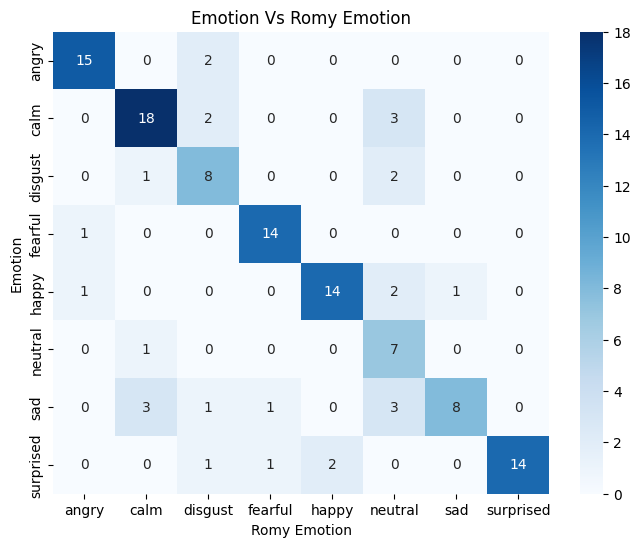

In [ ]:
plot_heatmap(merged, "Romy Emotion", "Emotion")

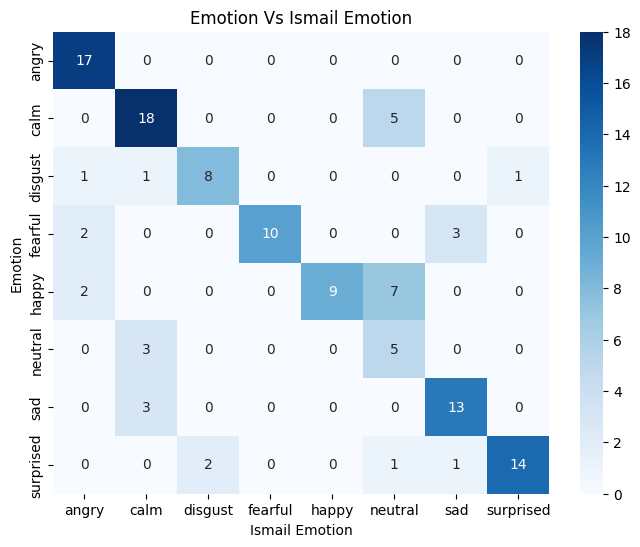

In [ ]:
plot_heatmap(merged, "Ismail Emotion", "Emotion")

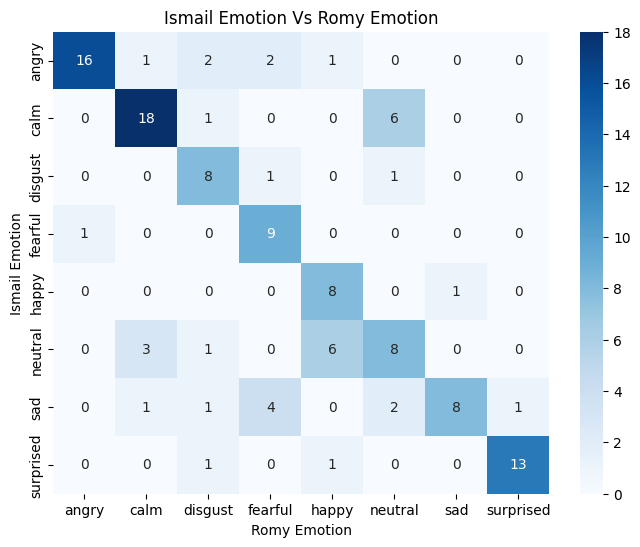

In [ ]:
plot_heatmap(merged, "Romy Emotion", "Ismail Emotion")

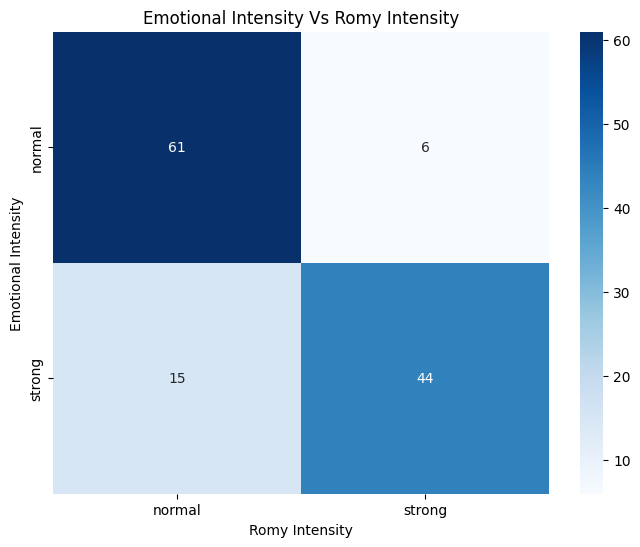

In [ ]:
plot_heatmap(merged, "Romy Intensity", "Emotional Intensity")

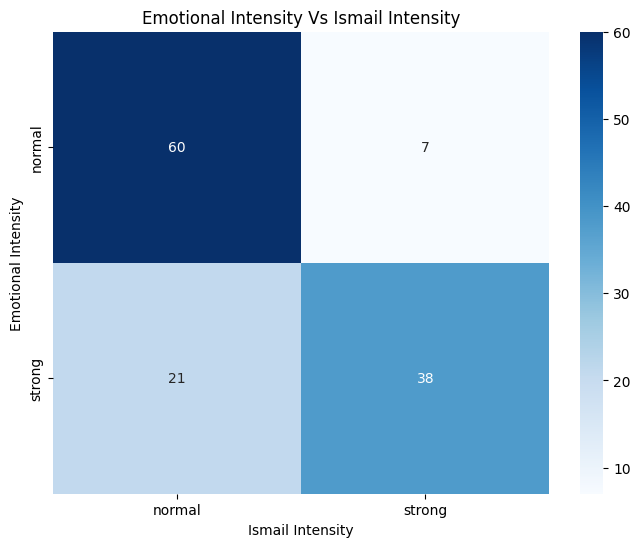

In [ ]:
plot_heatmap(merged, "Ismail Intensity", "Emotional Intensity")

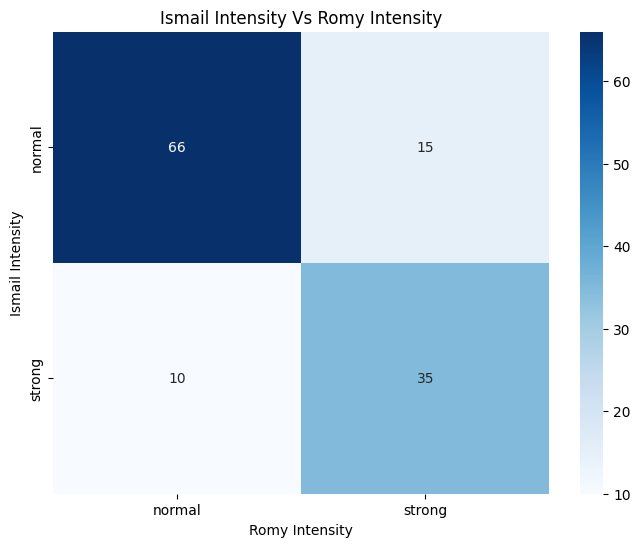

In [ ]:
plot_heatmap(merged, "Romy Intensity", "Ismail Intensity")

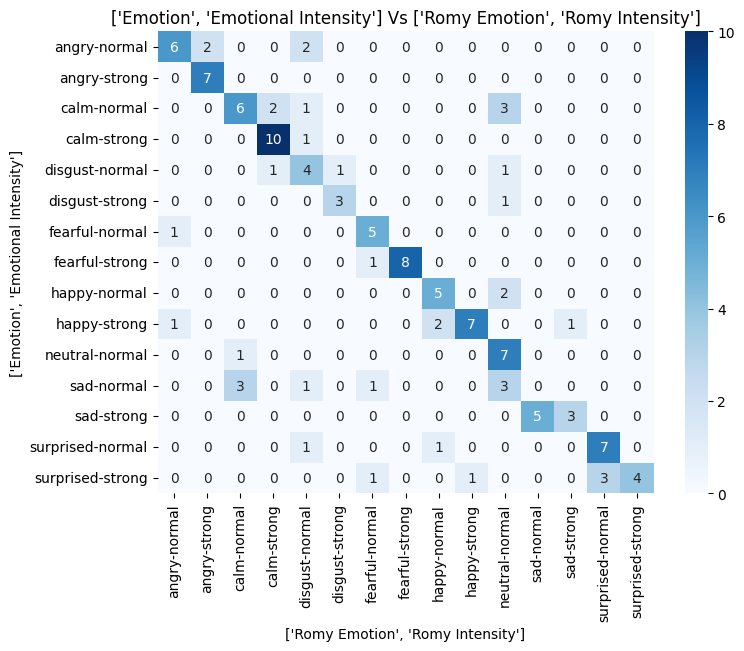

In [ ]:
plot_heatmap(merged, ["Romy Emotion","Romy Intensity"], ["Emotion", "Emotional Intensity"])

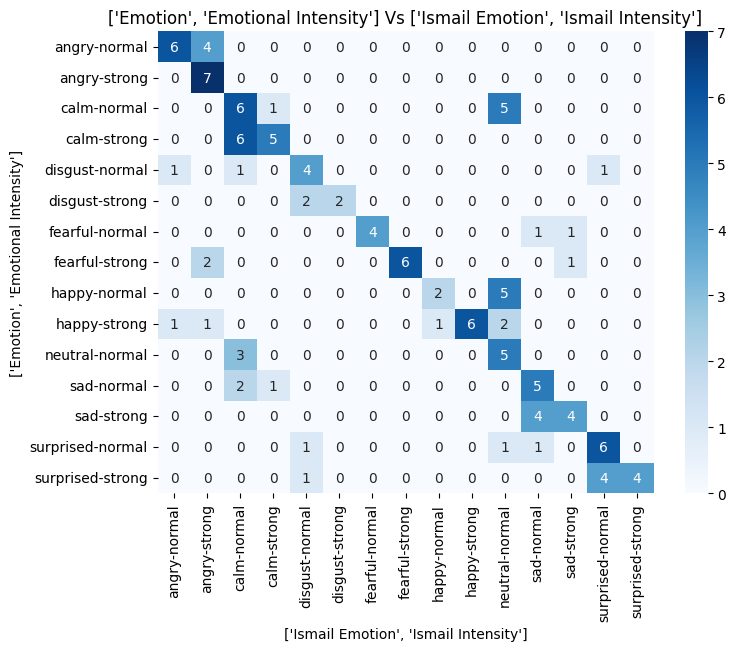

In [ ]:
plot_heatmap(merged, ["Ismail Emotion","Ismail Intensity"], ["Emotion", "Emotional Intensity"])

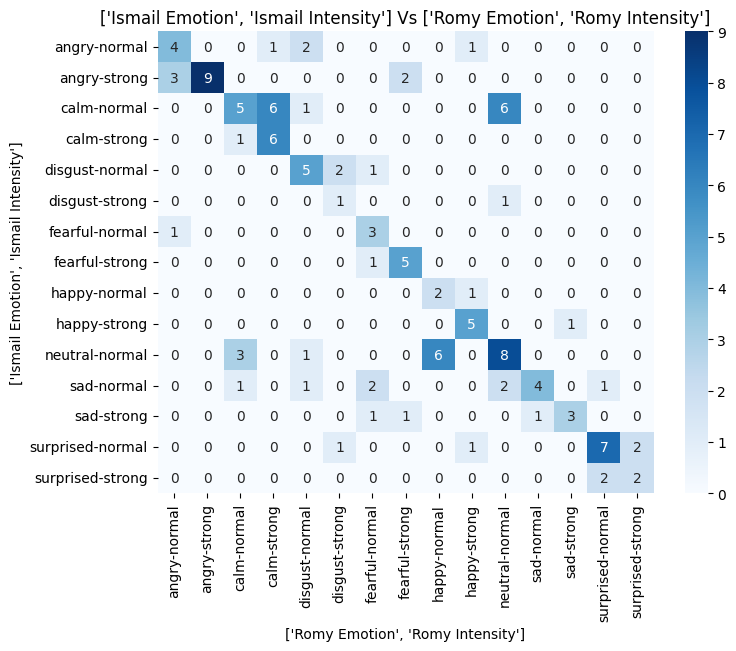

In [ ]:
plot_heatmap(merged, ["Romy Emotion","Romy Intensity"], ["Ismail Emotion", "Ismail Intensity"])

In [ ]:
pt_RE_E

Romy Emotion,angry,calm,disgust,fearful,happy,neutral,sad,surprised
Emotion,,,,,,,,
angry,15,0,2,0,0,0,0,0
calm,0,18,2,0,0,3,0,0
disgust,0,1,8,0,0,2,0,0
fearful,1,0,0,14,0,0,0,0
happy,1,0,0,0,14,2,1,0
neutral,0,1,0,0,0,7,0,0
sad,0,3,1,1,0,3,8,0
surprised,0,0,1,1,2,0,0,14


# IAA

In [ ]:
#TEST
pivot_table = {
    'T': [18, 7],
    'U': [75, 100]
}
# Convert the dictionary to a DataFrame
pivot_table_df = pd.DataFrame(pivot_table, index=['T1', 'T2'])
pivot_table_df

,T,U
T1,18,75
T2,7,100


In [ ]:
def accuracy_calc(pivot_table):
  """
  Transforms pivot table into an array and calculates its accuracy
  """
  arr = pivot_table.values
  acc = sum(arr.diagonal()) / np.sum(arr)
  return acc

accuracy_calc(pivot_table_df)

0.59

In [ ]:
def S_coef(pivot_table, Q=8):
  """
  Calculates S coefficient
  """

  A0 = accuracy_calc(pivot_table)

  Ase = 1/np.abs(Q)
  S = (A0 - Ase)/(1 - Ase)
  return Ase, S

S_coef(pivot_table_df, 2)

(0.5, 0.17999999999999994)

In [ ]:
def pi_coef(pivot_table):

  """
  Calculate pi coefficient
  """

  A0 = accuracy_calc(pivot_table)

  arr = pivot_table.values
  arr_tran = arr.transpose()
  total = np.sum(arr)

  Apie = 0
  for i in range(len(arr)):
    Apie += ( (np.sum(arr[i]) + np.sum(arr_tran[i]))**2 ) / (2*total)**2

  pi = (A0 - Apie)/(1 - Apie)

  return Apie, pi

pi_coef(pivot_table_df)

(0.58405, 0.014304603918740258)

In [ ]:
def kappa_coef(pivot_table):

  """
  Calculates kappa coefficient
  """

  A0 = accuracy_calc(pivot_table)

  arr = pivot_table.values
  arr_tran = arr.transpose()
  total = np.sum(arr)

  Ake = 0
  for i in range(len(arr)):
    Ake += ( np.sum(arr[i]) * np.sum(arr_tran[i]) ) / total**2

  k = (A0 - Ake)/(1 - Ake)

  return Ake, k

kappa_coef(pivot_table_df)



(0.52625, 0.13456464379947225)

## IAA Calculation

In [ ]:
def IAA_calc(pivot_table_dict, Q=8):
  """
  Calculates IAA for the 3 coefficients S, pi and kappa.
  """

  for name, pivot_table in pivot_table_dict.items():
    A0 = accuracy_calc(pivot_table)
    Ase, s = S_coef(pivot_table, Q)
    Apie, pi = pi_coef(pivot_table)
    Ake, k = kappa_coef(pivot_table)

    print(f"for {name}:\n\n A0 = {A0}\n IAA for S = {s}\n IAA for pi = {pi}\n IAA for kappa = {k}\n\n")

In [ ]:
pt_dict_emotion = {
    "pt_RE_E": pt_RE_E,
    "pt_IE_E": pt_IE_E,
    "PT_RE_IE": PT_RE_IE}

pt_dict_intensity = {
    "pt_RI_I": pt_RI_I,
    "pt_II_I": pt_II_I,
    "pt_RI_II": pt_RI_II
}

pt_dict_emotion_intensity = {
    "pt_REI_EI": pt_REI_EI,
    "pt_IEI_EI": pt_IEI_EI,
    "pt_REI_IEI": pt_REI_IEI
}


In [ ]:
IAA_calc(pt_dict_emotion, 8)

for pt_RE_E:

 A0 = 0.7777777777777778
 IAA for S = 0.746031746031746
 IAA for pi = 0.744421906693712
 IAA for kappa = 0.7451603582779542


for pt_IE_E:

 A0 = 0.746031746031746
 IAA for S = 0.7097505668934241
 IAA for pi = 0.7069234962747593
 IAA for kappa = 0.7082278023011795


for PT_RE_IE:

 A0 = 0.6984126984126984
 IAA for S = 0.655328798185941
 IAA for pi = 0.6521612786051579
 IAA for kappa = 0.6533951064137831




In [ ]:
IAA_calc(pt_dict_intensity, 2)

for pt_RI_I:

 A0 = 0.8333333333333334
 IAA for S = 0.6666666666666667
 IAA for pi = 0.6604863026881377
 IAA for kappa = 0.6622415113607353


for pt_II_I:

 A0 = 0.7777777777777778
 IAA for S = 0.5555555555555556
 IAA for pi = 0.5415800415800417
 IAA for kappa = 0.5473441108545035


for pt_RI_II:

 A0 = 0.8015873015873016
 IAA for S = 0.6031746031746033
 IAA for pi = 0.5776064364733491
 IAA for kappa = 0.5783132530120483




In [ ]:
IAA_calc(pt_dict_emotion_intensity, 15)

for pt_REI_EI:

 A0 = 0.6507936507936508
 IAA for S = 0.6258503401360545
 IAA for pi = 0.6239571321983315
 IAA for kappa = 0.625050723657514


for pt_IEI_EI:

 A0 = 0.5714285714285714
 IAA for S = 0.5408163265306122
 IAA for pi = 0.5366542953454322
 IAA for kappa = 0.5390556195379717


for pt_REI_IEI:

 A0 = 0.5476190476190477
 IAA for S = 0.5153061224489797
 IAA for pi = 0.5083515881708653
 IAA for kappa = 0.5102291325695582




# Data Augmentaton

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display

def plot_waveform_and_spectrogram(audio_path):
    # Load audio file
    y, sr = librosa.load(audio_path)

    # Plot waveform
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')

    # Plot spectrogram
    plt.subplot(2, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.title('Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.colorbar(format='%+2.0f dB')

    plt.tight_layout()
    plt.show()

# Example usage:
audio_path = df_adj['Path'][0]  # Replace this with the path to your audio file
plot_waveform_and_spectrogram(audio_path)


TypeError: plot_waveform_and_spectrogram() missing 1 required positional argument: 'sr'

add noise to audio and visualize it

In [ ]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sampling_rate, pitch_factor)

# taking any example and checking for techniques.
path = df_adj['Path'][0]
data, sample_rate = librosa.load(path)

# Simple audio

Text(92.34722222222221, 0.5, 'Amplitude')

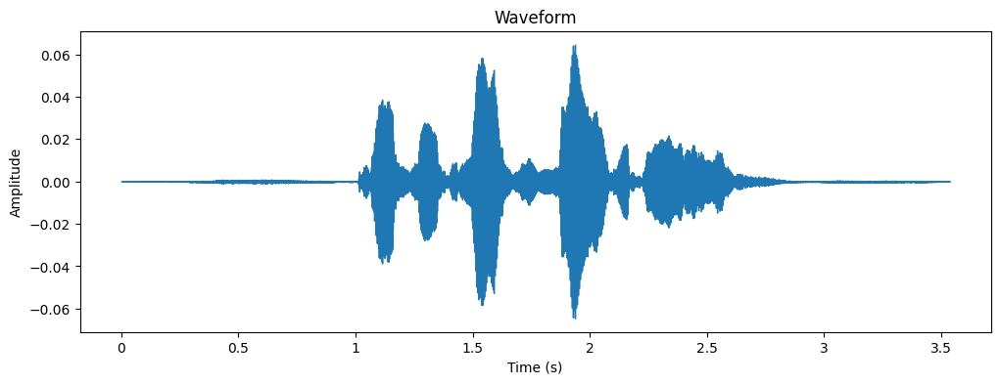

In [ ]:
plt.figure(figsize=(12, 4))
librosa.display.waveshow(data, sr=sample_rate)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

noise added

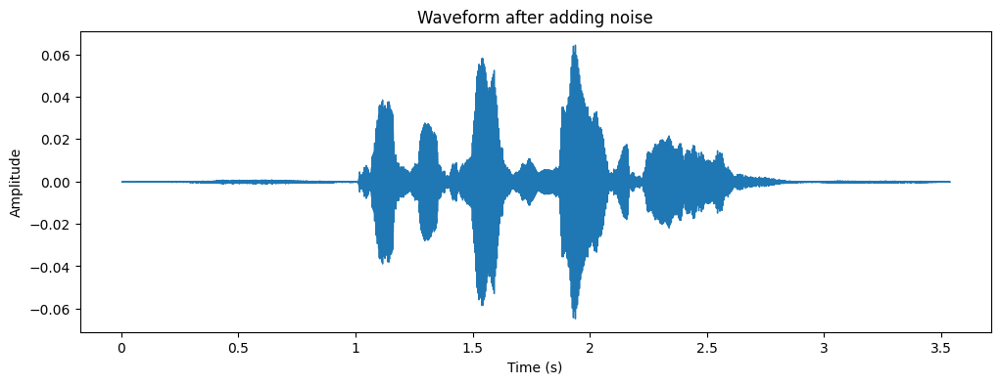

In [ ]:

x = noise(data)
plt.figure(figsize=(12,4))
librosa.display.waveshow(data, sr=sample_rate)
plt.title('Waveform after adding noise')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
Audio(x, rate=sample_rate)

time stretching


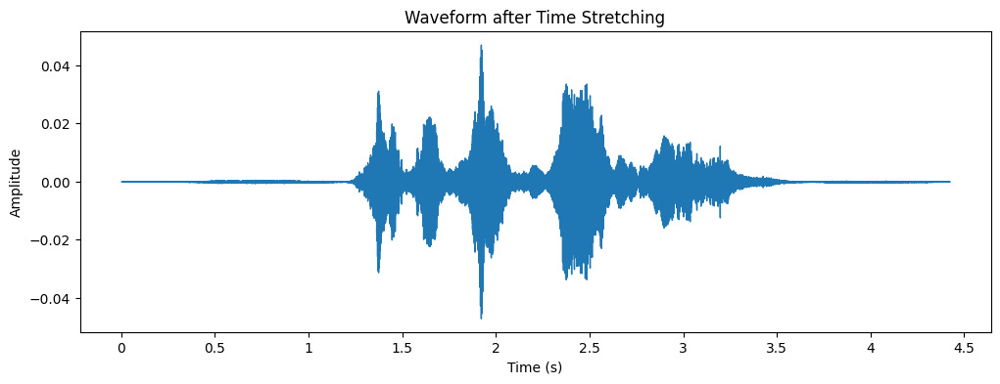

In [ ]:
import matplotlib.pyplot as plt
import librosa
import librosa.display

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)

# Load the audio file
audio_path = path
y, sr = librosa.load(audio_path)

# Stretch the audio
stretched_audio = stretch(y)

# Plot the waveform
plt.figure(figsize=(12, 4))
librosa.display.waveshow(stretched_audio, sr=sr)
plt.title('Waveform after Time Stretching')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()


pitch

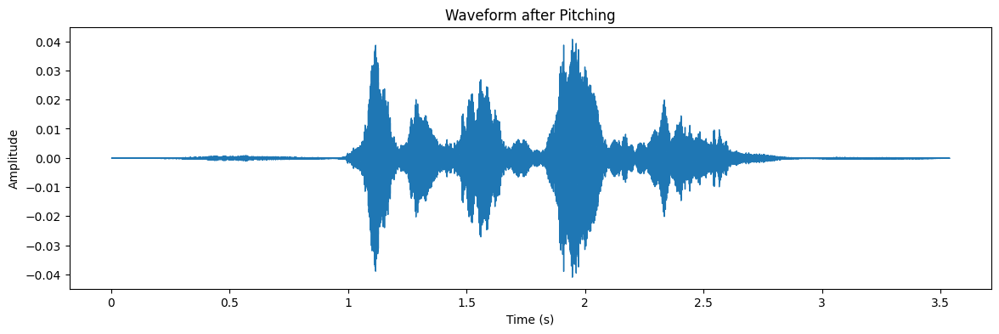

In [ ]:
def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

# taking any example and checking for techniques.
data, sample_rate = librosa.load(path)

x = pitch(data, sample_rate)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
plt.title('Waveform after Pitching')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

Audio(x, rate=sample_rate)

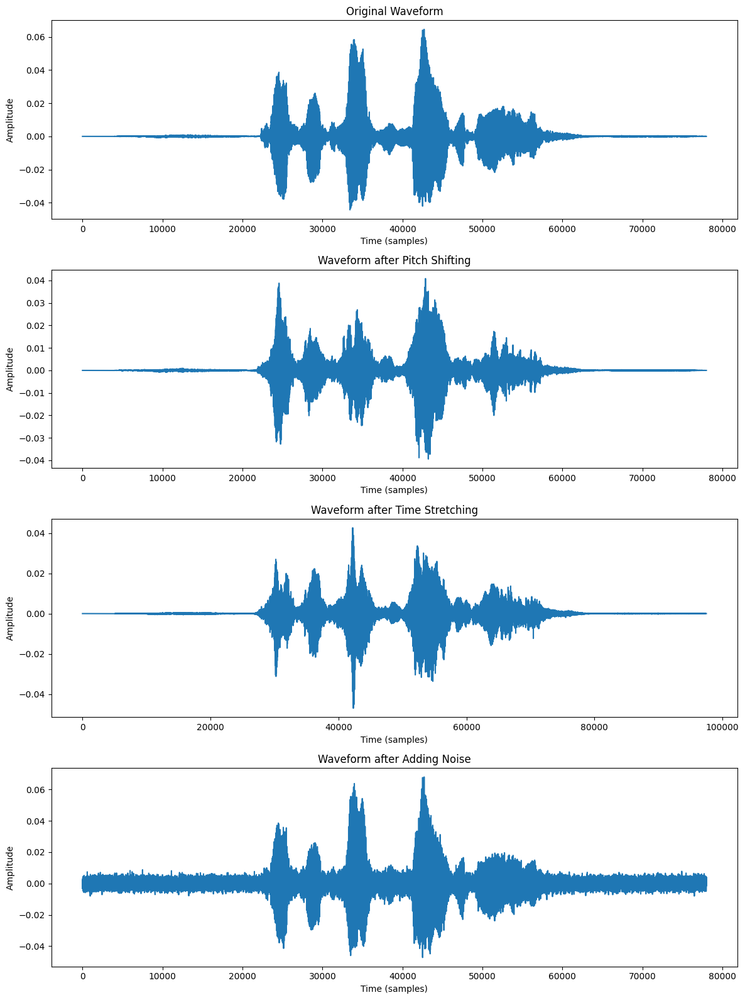

In [ ]:
import matplotlib.pyplot as plt
import librosa
import librosa.display
from IPython.display import Audio
import numpy as np

# Define functions for pitch shifting, time stretching, and adding noise


# Load the audio file
audio_path = path
data, sample_rate = librosa.load(audio_path)

# Create a figure and axes for subplots
fig, axs = plt.subplots(4, 1, figsize=(12, 16))

# Plot original waveform
axs[0].plot(data)
axs[0].set_title('Original Waveform')
axs[0].set_xlabel('Time (samples)')
axs[0].set_ylabel('Amplitude')

# Plot waveform after pitch shifting
pitched_data = pitch(data, sample_rate)
axs[1].plot(pitched_data)
axs[1].set_title('Waveform after Pitch Shifting')
axs[1].set_xlabel('Time (samples)')
axs[1].set_ylabel('Amplitude')

# Plot waveform after time stretching
stretched_data = stretch(data)
axs[2].plot(stretched_data)
axs[2].set_title('Waveform after Time Stretching')
axs[2].set_xlabel('Time (samples)')
axs[2].set_ylabel('Amplitude')

# Plot waveform after adding noise
noisy_data = noise(data)
axs[3].plot(noisy_data)
axs[3].set_title('Waveform after Adding Noise')
axs[3].set_xlabel('Time (samples)')
axs[3].set_ylabel('Amplitude')

# Adjust layout and display
plt.tight_layout()
plt.show()

# Play the original audio
Audio(data, rate=sample_rate)


In [ ]:
# Function to augment audio
def augment_audio(file_path, output_path, augmentations):
    y, sr = librosa.load(file_path, sr=None)

    augmented_files = []

    for i, aug in enumerate(augmentations):
        if aug == 'noise':
            y_aug = y + 0.005 * np.random.randn(len(y))
        elif aug == 'stretch':
            y_aug = librosa.effects.time_stretch(y, rate=0.8)
        elif aug == 'pitch':
            y_aug = librosa.effects.pitch_shift(y, sr=sr, n_steps=4)
        else:
            y_aug = y

        # Export augmented audio
        output_file = os.path.join(output_path, f"aug_{i}_{os.path.basename(file_path)}")
        sf.write(output_file, y_aug, sr)

        # Append augmented file path to list
        augmented_files.append(output_file)

    return augmented_files

# Create a directory for augmented files
output_path = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/augmented_files'
os.makedirs(output_path, exist_ok=True)

In [ ]:
# Define augmentations
augmentations = ['noise', 'stretch', 'pitch']

# Apply augmentations to each audio file in the DataFrame
augmented_data = []

for idx, row in tqdm(df_adj.iterrows()):
    augmented_files = augment_audio(row['Path'], output_path, augmentations)
    for aug_file in augmented_files:
        augmented_row = row.copy()
        augmented_row['Path'] = aug_file
        augmented_data.append(augmented_row)

# Convert augmented data list to DataFrame
df_augmented = pd.DataFrame(augmented_data)
df_augmented

In [ ]:
# Combine original and augmented data
df_combined = pd.concat([df_adj, df_augmented], ignore_index=True)

# Save the new DataFrame to a CSV file
df_combined.to_csv('/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/augmented_dataset.csv', index=False)

In [ ]:
# Listen to audios from 0.3 sec to 2.93 sec

# Load the audio file
audio = AudioSegment.from_file(augmented_dataset['Path'][680])

# Define the start and end times in milliseconds
start_time = 0.3 * 1000  # 0.3 seconds
end_time = 2.93 * 1000   # 2.63 seconds

# Slice the audio segment
audio_segment = audio[start_time:end_time]

# Convert to raw audio data
raw_data = np.array(audio_segment.get_array_of_samples())

# Get the sample rate
sample_rate = audio_segment.frame_rate

# Play the sliced audio
ipd.Audio(data=raw_data, rate=sample_rate)

#Feature Extraction

In [ ]:
signal,sr = librosa.load(df_adj['Path'][0])
signal

array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        2.8912990e-07, -2.2384282e-07,  1.6421370e-07], dtype=float32)

In [ ]:
signal1,_ = librosa.load(df_adj['Path'][140])
signal2,_ = librosa.load(df_adj['Path'][135])

In [ ]:
# number of samples
signal.shape

(77988,)

In [ ]:
ipd.Audio(df_adj['Path'][0])

In [ ]:
ipd.Audio(df_adj['Path'][140])

In [ ]:
ipd.Audio(df_adj['Path'][135])

## Extracting Short Time Fourier Transform

In [ ]:
FRAME_SIZE = 2048
HOP_SIZE = 512
# 2048/4 = 512

**Pros and Cons of Using 2048 Samples**

**Pros:**

***Higher Frequency Resolution:***

With a sample rate of 22050 Hz, a frame size of 2048 samples gives a frequency resolution of approximately 10.77 Hz (22050 / 2048). This means you can distinguish between frequencies that are 10.77 Hz apart, which is useful for detailed frequency analysis.

***Smoother Spectrogram:***

A larger frame size can result in a smoother spectrogram with less noise, as more data points contribute to each frequency bin.

**Cons:**

***Lower Time Resolution:***

The time resolution is decreased with larger frame sizes. With a frame size of 2048 samples and a sample rate of 22050 Hz, each frame covers approximately 93 ms (2048 / 22050). This can be a limitation if you need to capture rapid changes in the signal.

***Increased Computational Cost:***

Larger frames require more computational resources, which might be a concern if you are processing a large number of audio files.

**Hop Size**

**Overlap:** With a hop size of 512 samples, there is a 75% overlap between consecutive frames because (2048−512)/2048=0.75 or 75%. High overlap ensures smoother transitions and reduces the risk of missing important information between frames.

**Temporal Coverage:** The hop size affects how frequently the STFT is computed. With a sample rate of 22050 Hz, a hop size of 512 samples corresponds to an STFT computation every 512/22050 ≈ 23 milliseconds. This means the STFT is computed roughly 43 times per second (22050 / 512).

In [ ]:
S_scale = librosa.stft(signal, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_scale1 = librosa.stft(signal1, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
S_scale2 = librosa.stft(signal2, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [ ]:
print(S_scale.shape)
print(S_scale1.shape)
print(S_scale2.shape)
# output: (frequency bins, frames)
# frequency bins = 2048/2 + 1
# frames = (samples - 2048)/512 + 1

(1025, 153)
(1025, 164)
(1025, 150)


## Spectogram

In [ ]:
Y_scale = np.abs(S_scale) ** 2
# Moving from linear to log
Y_log_scale = librosa.power_to_db(Y_scale, ref=np.max)
# We perceive frequency in a logarithmic way not linear so we need
# to convert the y axis to log

Y_scale1 = np.abs(S_scale1) ** 2
Y_log_scale1 = librosa.power_to_db(Y_scale1, ref=np.max)

Y_scale2 = np.abs(S_scale2) ** 2
Y_log_scale2 = librosa.power_to_db(Y_scale2, ref=np.max)

Y_log_scale.shape

(1025, 153)

In [ ]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y,
                             sr=sr,
                             hop_length=hop_length,
                             x_axis="time",
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")

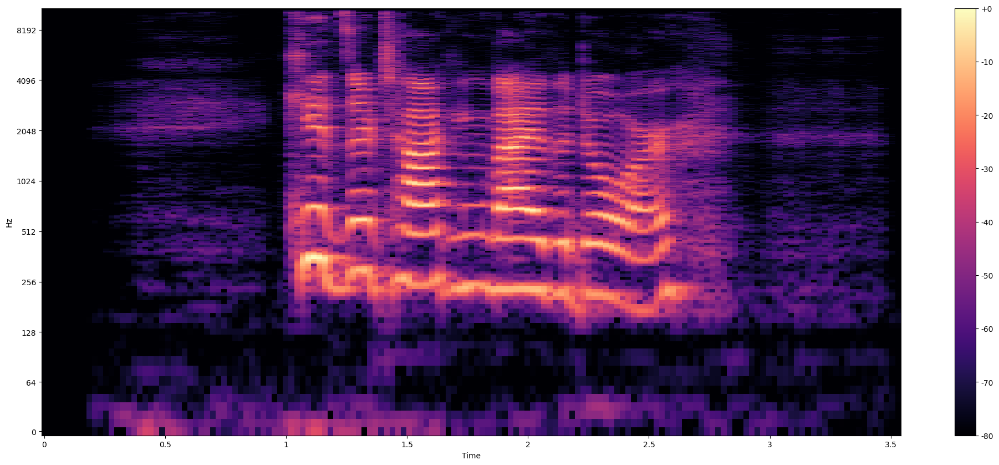

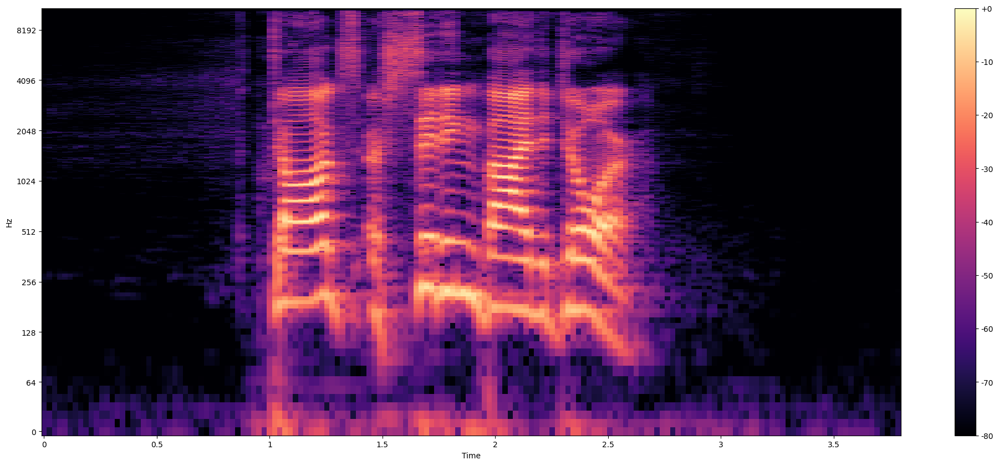

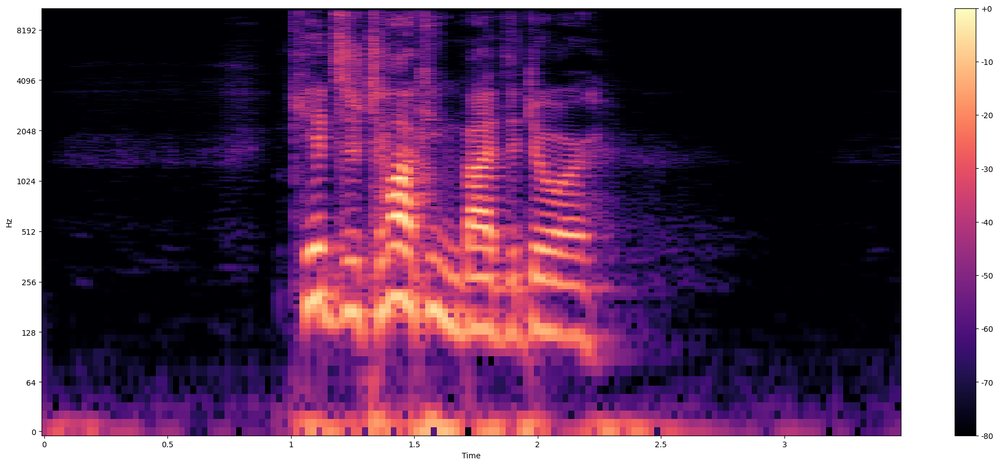

In [ ]:
plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_log_scale1, sr, HOP_SIZE, y_axis="log")
plot_spectrogram(Y_log_scale2, sr, HOP_SIZE, y_axis="log")

## Mel Spectogram

In [ ]:
mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=sr, n_fft=2048, hop_length=512, n_mels=40)
mel_spectrogram1 = librosa.feature.melspectrogram(y=signal1, sr=sr, n_fft=2048, hop_length=512, n_mels=40)
mel_spectrogram2 = librosa.feature.melspectrogram(y=signal2, sr=sr, n_fft=2048, hop_length=512, n_mels=40)

print(mel_spectrogram.shape)
print(mel_spectrogram1.shape)
print(mel_spectrogram2.shape)
# (n_mels, #frames)

(40, 153)
(40, 164)
(40, 150)


In [ ]:
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
log_mel_spectrogram1 = librosa.power_to_db(mel_spectrogram1, ref=np.max)
log_mel_spectrogram2 = librosa.power_to_db(mel_spectrogram2, ref=np.max)

log_mel_spectrogram.shape

(40, 153)

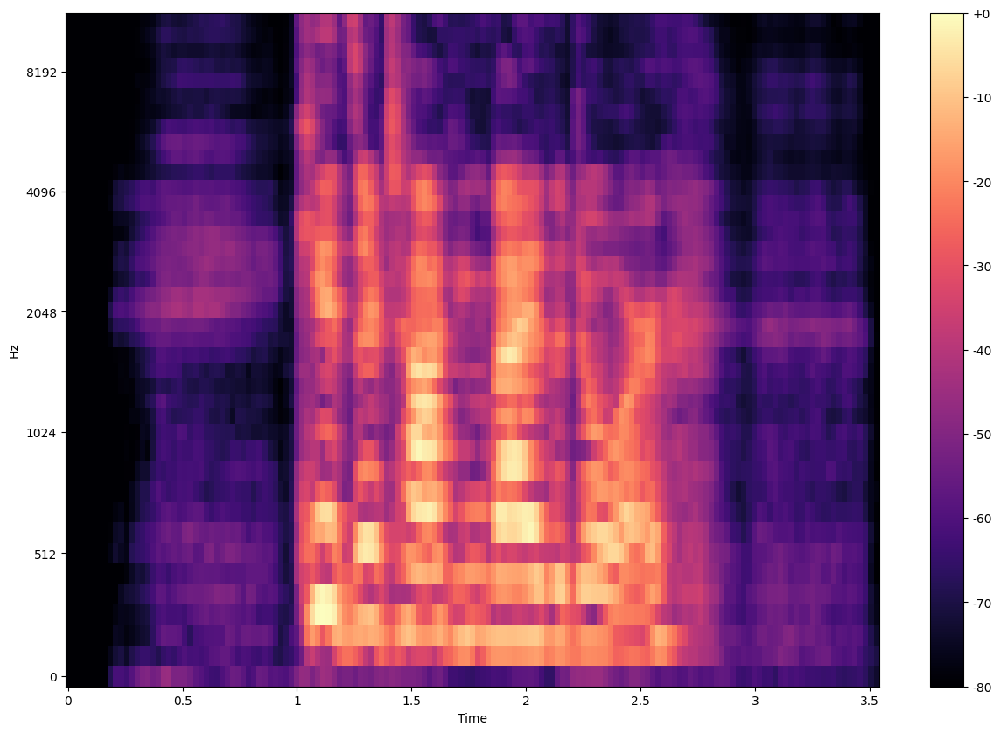

In [ ]:
plt.figure(figsize=(15, 10))
librosa.display.specshow(log_mel_spectrogram,
                         x_axis="time",
                         y_axis="mel",
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()
# y_axis frequency in mel bands (eg:40)

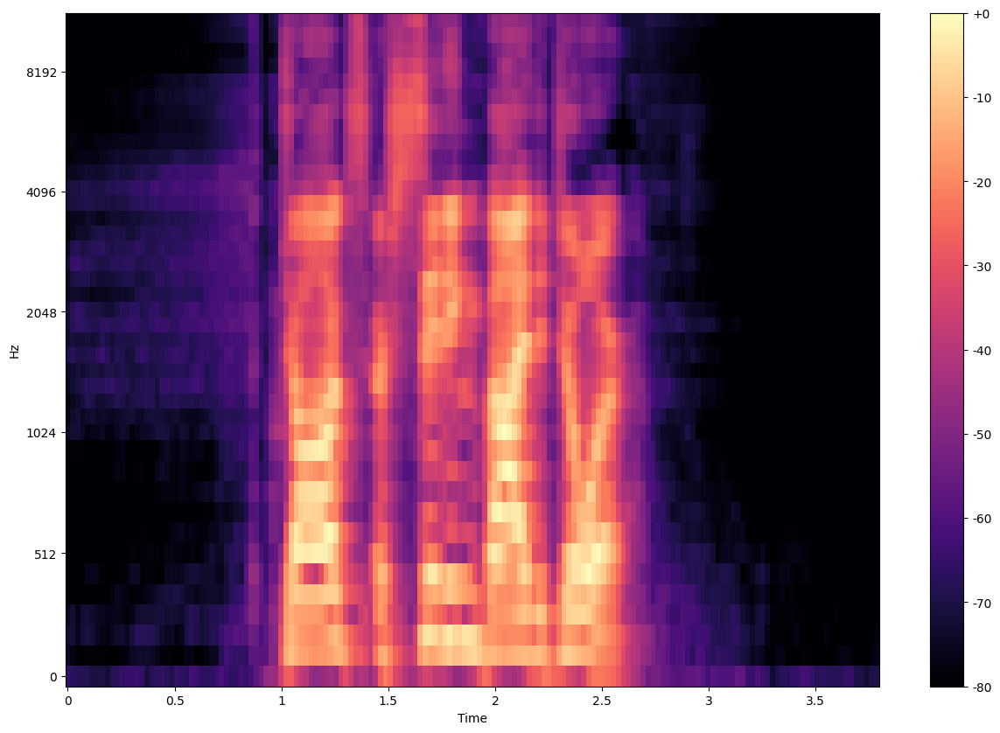

In [ ]:
plt.figure(figsize=(15, 10))
librosa.display.specshow(log_mel_spectrogram1,
                         x_axis="time",
                         y_axis="mel",
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()
# y_axis frequency in mel bands (eg:40)

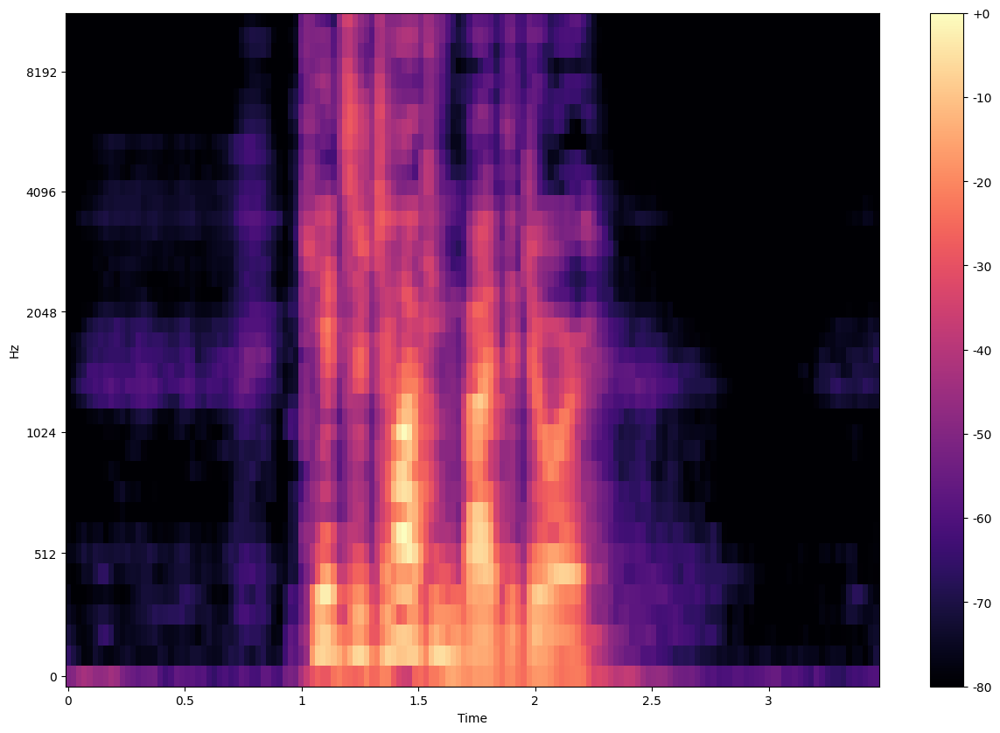

In [ ]:
# Visualize log mel spect
plt.figure(figsize=(15, 10))
librosa.display.specshow(log_mel_spectrogram2,
                         x_axis="time",
                         y_axis="mel",
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()
# y_axis frequency in mel bands (eg:40)

## Chroma STFT

In [ ]:
chroma_stft = librosa.feature.chroma_stft(y = signal, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
chroma_stft1 = librosa.feature.chroma_stft(y = signal1, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
chroma_stft2 = librosa.feature.chroma_stft(y = signal2, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

print(chroma_stft.shape)
print(chroma_stft1.shape)
print(chroma_stft2.shape)

(12, 153)
(12, 164)
(12, 150)


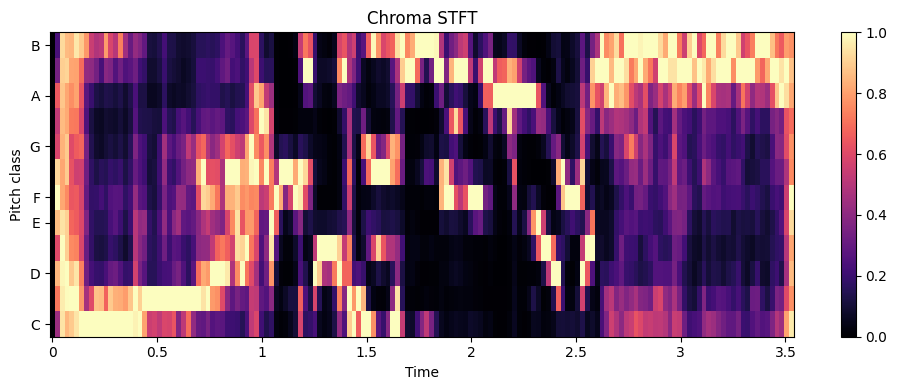

In [ ]:
# Visualize Chroma STFT
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_stft, y_axis='chroma', x_axis='time', sr=sr, hop_length=HOP_SIZE)
plt.colorbar()
plt.title('Chroma STFT')
plt.tight_layout()
plt.show()

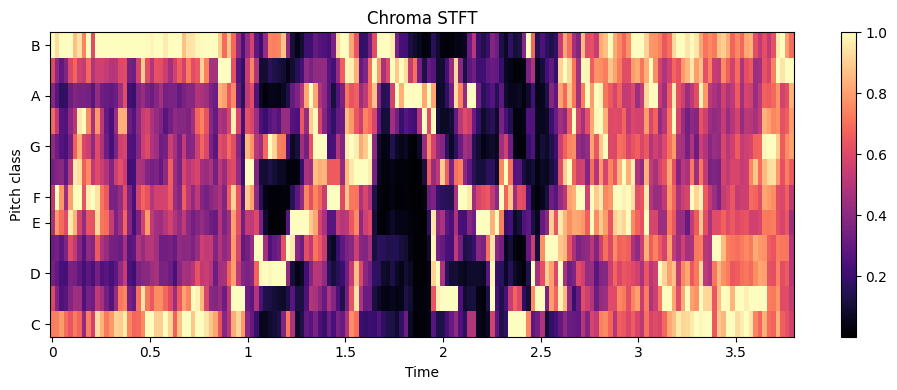

In [ ]:
# Visualize Chroma STFT
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_stft1, y_axis='chroma', x_axis='time', sr=sr, hop_length=HOP_SIZE)
plt.colorbar()
plt.title('Chroma STFT')
plt.tight_layout()
plt.show()

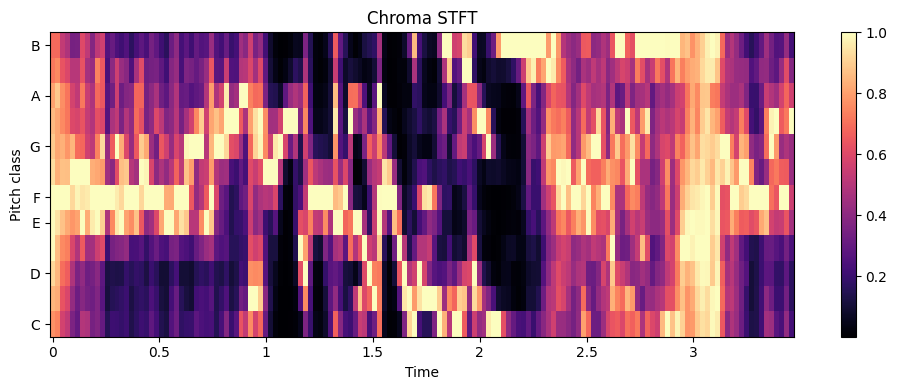

In [ ]:
# Visualize Chroma STFT
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma_stft2, y_axis='chroma', x_axis='time', sr=sr, hop_length=HOP_SIZE)
plt.colorbar()
plt.title('Chroma STFT')
plt.tight_layout()
plt.show()

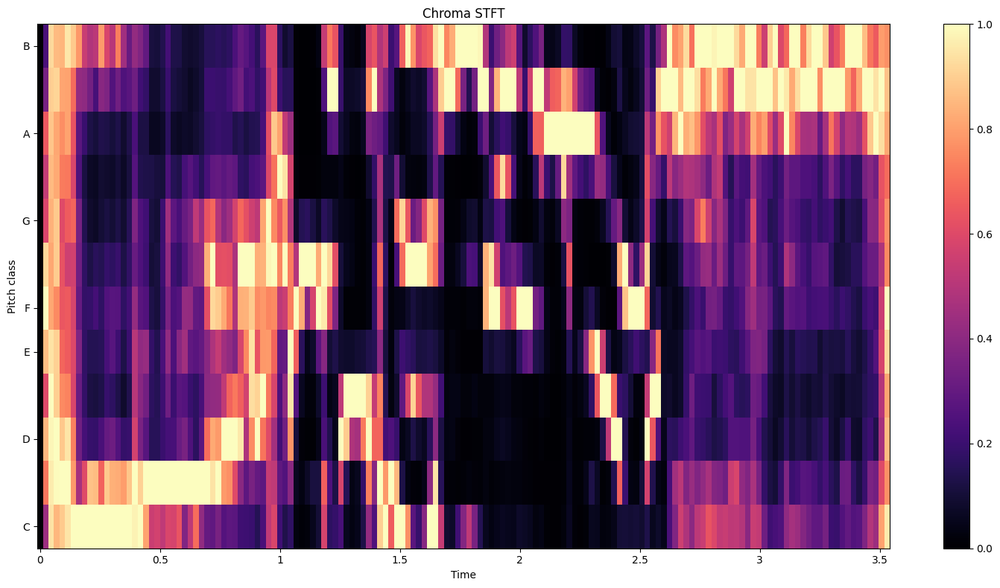

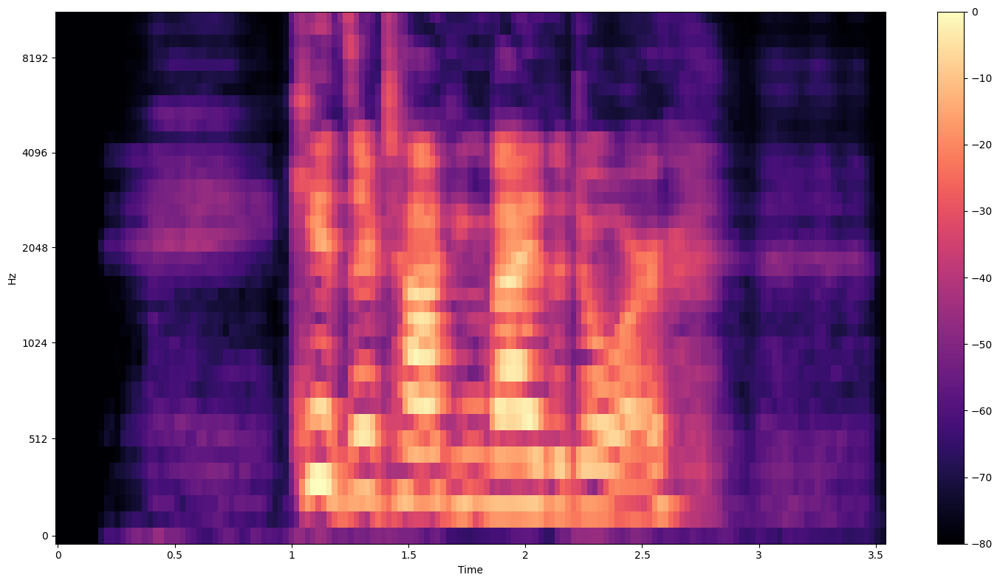

In [ ]:
# Visualize Chroma STFT
def chroma_stft_vis(Y, sr, hop_length):
  plt.figure(figsize=(15, 8))
  librosa.display.specshow(Y, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length)
  plt.colorbar()
  plt.title('Chroma STFT')
  plt.tight_layout()
  plt.show()

# Visualize log mel spect
def mel_spectrogram(Y, sr):
  plt.figure(figsize=(15, 8))
  librosa.display.specshow(Y,
                          x_axis="time",
                          y_axis="mel",
                          sr=sr)
  plt.colorbar()
  plt.tight_layout()
  plt.show()

chroma_stft_vis(chroma_stft, sr, HOP_SIZE)
mel_spectrogram(log_mel_spectrogram, sr)

In [ ]:
# Save feature images
Mel_images = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Mel_images'
stft_images = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/stft_images'
chroma_stft_images = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/chroma_stft_images'


os.makedirs(Mel_images, exist_ok=True)
os.makedirs(stft_images, exist_ok=True)
os.makedirs(chroma_stft_images, exist_ok=True)

In [ ]:
"""
def save_feature_as_image(feature, save_path):
    plt.figure(figsize=(10, 4))
    plt.imshow(feature, aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

for i, (mfcc, stft, chroma_stft) in enumerate(features):
    save_feature_as_image(mfcc, f'mfcc_images/mfcc_{i}.png')
    save_feature_as_image(stft, f'stft_images/stft_{i}.png')
    save_feature_as_image(chroma_stft, f'chroma_stft_images/chroma_stft_{i}.png')

# Load and stack images into 3D tensors
target_size = (128, 128)
def load_image(image_path, target_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, target_size)
    return image

mfcc_images = [load_image(f'mfcc_images/mfcc_{i}.png', target_size) for i in range(len(df_adj))]
stft_images = [load_image(f'stft_images/stft_{i}.png', target_size) for i in range(len(df_adj))]
chroma_stft_images = [load_image(f'chroma_stft_images/chroma_stft_{i}.png', target_size) for i in range(len(df_adj))]

features_3d = np.stack((mfcc_images, stft_images, chroma_stft_images), axis=-1)
features_3d_array = np.array(features_3d)

X_train, X_test, y_train, y_test = train_test_split(features_3d_array, labels, test_size=0.2, random_state=42)

X_train = X_train / 255.0
X_test = X_test / 255.0

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))
"""

"\ndef save_feature_as_image(feature, save_path):\n    plt.figure(figsize=(10, 4))\n    plt.imshow(feature, aspect='auto', origin='lower')\n    plt.colorbar()\n    plt.tight_layout()\n    plt.savefig(save_path)\n    plt.close()\n\nfor i, (mfcc, stft, chroma_stft) in enumerate(features):\n    save_feature_as_image(mfcc, f'mfcc_images/mfcc_{i}.png')\n    save_feature_as_image(stft, f'stft_images/stft_{i}.png')\n    save_feature_as_image(chroma_stft, f'chroma_stft_images/chroma_stft_{i}.png')\n\n# Load and stack images into 3D tensors\ntarget_size = (128, 128)\ndef load_image(image_path, target_size):\n    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)\n    image = cv2.resize(image, target_size)\n    return image\n\nmfcc_images = [load_image(f'mfcc_images/mfcc_{i}.png', target_size) for i in range(len(df_adj))]\nstft_images = [load_image(f'stft_images/stft_{i}.png', target_size) for i in range(len(df_adj))]\nchroma_stft_images = [load_image(f'chroma_stft_images/chroma_stft_{i}.png',

In [ ]:
# Function to extract features
def extract_features(audio_path):

    FRAME_SIZE = 2048
    HOP_SIZE = 512

    # Load the audio file
    signal, sr = librosa.load(audio_path, duration = 2.63, offset = 0.3, mono = True)

    # Extract Mel-Frequency Cepstral Coefficients
    mel_fq = librosa.feature.melspectrogram(y=signal, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_SIZE, n_mels=40)
    mel_fq = librosa.power_to_db(mel_fq, ref=np.max)


    # Extract STFT
    stft = librosa.stft(signal, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    stft = np.abs(stft) ** 2
    stft = librosa.power_to_db(stft, ref=np.max)

    # Extract Chroma STFT
    chroma_stft = librosa.feature.chroma_stft(y = signal, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

    return mel_fq, stft, chroma_stft



In [ ]:
# DON'T RUN!!!!!!

# Lists to store features
features = []

for i in range(len(augmented_dataset)):
  path = augmented_dataset['Path'][i]
  mel_fq, stft, chroma_stft = extract_features(path)
  features.append({
    'mel_frequencies' : mel_fq,
    'stft': stft,
    'chroma_stft': chroma_stft,
    'Gender' : augmented_dataset['Gender'][i],
    'Emotion' : augmented_dataset['Emotion'][i],
    'Intensity' : augmented_dataset['Emotional Intensity'][i]
  })

features

[{'mel_frequencies': array([[-55.7288  , -51.411503, -50.597126, ..., -56.72827 , -59.41896 ,
          -63.04321 ],
         [-68.88019 , -65.2568  , -64.70949 , ..., -56.361187, -57.81839 ,
          -61.509205],
         [-76.77065 , -73.28983 , -71.965675, ..., -54.888283, -54.46217 ,
          -57.009674],
         ...,
         [-80.      , -79.19827 , -78.13742 , ..., -77.07589 , -78.0543  ,
          -80.      ],
         [-80.      , -77.976654, -76.32895 , ..., -76.549805, -78.198456,
          -80.      ],
         [-80.      , -78.59308 , -77.92363 , ..., -78.323906, -79.82714 ,
          -80.      ]], dtype=float32),
  'stft': array([[-61.627098, -66.51527 , -57.63294 , ..., -80.      , -69.01487 ,
          -64.65456 ],
         [-57.547913, -50.951927, -48.9746  , ..., -80.      , -69.84235 ,
          -66.48978 ],
         [-54.793663, -47.652958, -46.255753, ..., -70.09192 , -77.86635 ,
          -68.037384],
         ...,
         [-80.      , -80.      , -80.      , 

In [ ]:

#features_df = pd.DataFrame(features)
processing_data_aug = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/processing_data_aug.h5'
# Save data to HDF5 file
with h5py.File(processing_data_aug, 'w') as hf:
    for i, sample in enumerate(features):
        group = hf.create_group(f'sample_{i}')
        for key, value in sample.items():
            group.create_dataset(key, data=value)
print(f"HDF5 saved")

HDF5 saved


In [ ]:
"""
'mel_frequencies' : mel_fq,
    'stft': stft,
    'chroma_stft': chroma_stft,
    'Gender' : augmented_dataset['Gender'][i],
    'Emotion' : augmented_dataset['Emotion'][i],
    'Intensity' : augmented_dataset['Emotional Intensity'][i]

# Save feature images
os.makedirs('Mel_images', exist_ok=True)
os.makedirs('stft_images', exist_ok=True)
os.makedirs('chroma_stft_images', exist_ok=True)

# Visualize Chroma STFT
def chroma_stft_vis(Y, sr, hop_length):
  plt.figure(figsize=(10, 4))
  librosa.display.specshow(Y, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length)
  plt.colorbar()
  plt.title('Chroma STFT')
  plt.tight_layout()
  plt.show()

# Visualize log mel spect
def mel_spectrogram(Y, sr):
  plt.figure(figsize=(15, 10))
  librosa.display.specshow(Y,
                          x_axis="time",
                          y_axis="mel",
                          sr=sr)
  plt.colorbar(format="%+2.f")
  plt.show()



#stft
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y,
                             sr=sr,
                             hop_length=hop_length,
                             x_axis="time",
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")
    plt.tight_layout()
    plt.show()

plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")
"""

## Plots

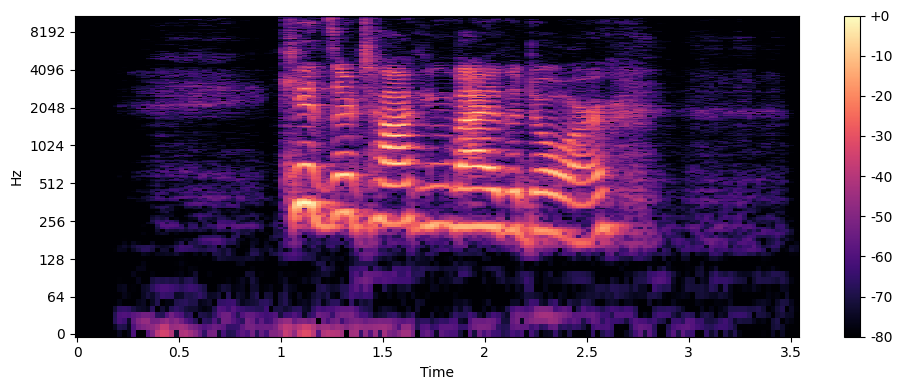

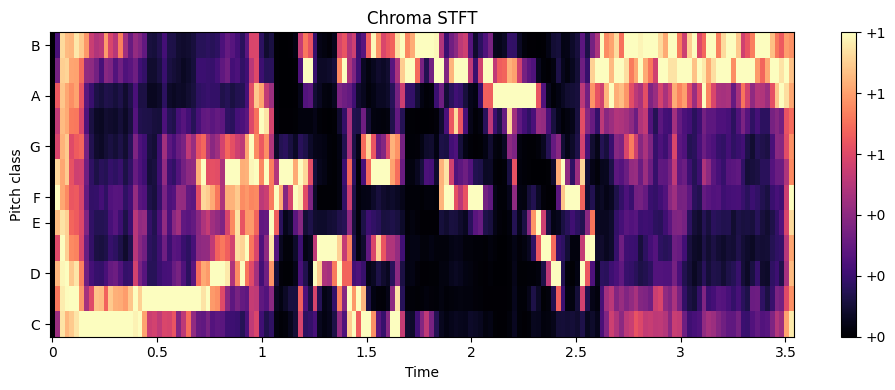

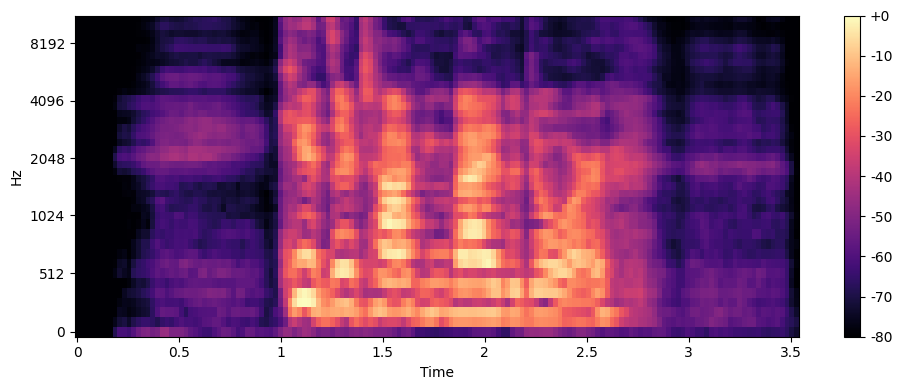

In [ ]:
# Visualize Chroma STFT
def chroma_stft_vis(Y, sr, hop_length):
  plt.figure(figsize=(10, 4))
  librosa.display.specshow(Y, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length)
  #fig.colorbar(img, format="%+2.f")
  plt.colorbar(format="%+2.f")
  plt.title('Chroma STFT')
  plt.tight_layout()

# Visualize log mel spect
def mel_spectrogram(Y, sr):
  plt.figure(figsize=(10, 4))
  librosa.display.specshow(Y,
                          x_axis="time",
                          y_axis="mel",
                          sr=sr)
  plt.colorbar(format="%+2.f")
  #fig.colorbar(img, format="%+2.f")
  plt.tight_layout()


def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
  plt.subplots(figsize=(10, 4))
  librosa.display.specshow(Y,
                            sr=sr,
                            hop_length=hop_length,
                            x_axis="time",
                            y_axis=y_axis,
                            )
  plt.colorbar(format="%+2.f")
  #fig.colorbar(img, ax=ax, format="%+2.f")
  plt.tight_layout()


plot_spectrogram(Y_log_scale, sr, HOP_SIZE, y_axis="log")
chroma_stft_vis(chroma_stft, sr, HOP_SIZE)
mel_spectrogram(log_mel_spectrogram, sr)

In [ ]:


# Function to directly save the feature as an image
def save_feature_as_image(feature, save_path):
    plt.figure(figsize=(10, 4))
    plt.imshow(feature, aspect='auto', origin='lower')
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Visualize Chroma STFT and directly save as image
def chroma_stft_vis_save(Y, sr, hop_length, save_path):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(Y, y_axis='chroma', x_axis='time', sr=sr, hop_length=hop_length)
    plt.colorbar(format="%+2.f")
    plt.title('Chroma STFT')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Visualize log mel spectrogram and directly save as image
def mel_spectrogram_save(Y, sr, save_path):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(Y, x_axis="time", y_axis="mel", sr=sr)
    plt.colorbar(format="%+2.f")
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Visualize spectrogram and directly save as image
def plot_spectrogram_save(Y, sr, save_path, hop_length, y_axis="linear"):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(Y, sr=sr, hop_length=hop_length, x_axis="time", y_axis=y_axis)
    plt.colorbar(format="%+2.f")
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# Function to check if an image file already exists
def image_exists(image_path):
    return os.path.exists(image_path)


In [ ]:
print(features_df['mel_frequencies'].iloc[0])

[[-55.7288   -51.411503 -50.597126 ... -56.72827  -59.41896  -63.04321 ]
 [-68.88019  -65.2568   -64.70949  ... -56.361187 -57.81839  -61.509205]
 [-76.77065  -73.28983  -71.965675 ... -54.888283 -54.46217  -57.009674]
 ...
 [-80.       -79.19827  -78.13742  ... -77.07589  -78.0543   -80.      ]
 [-80.       -77.976654 -76.32895  ... -76.549805 -78.198456 -80.      ]
 [-80.       -78.59308  -77.92363  ... -78.323906 -79.82714  -80.      ]]


In [ ]:
processing_data_aug = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/processing_data_aug.h5'

# Open the HDF5 file
with h5py.File(processing_data_aug, 'r') as hf:
    for i, sample_name in enumerate(hf.keys()):
        sample = hf[sample_name]
        mel_frequencies = np.array(sample['mel_frequencies'])
        stft = np.array(sample['stft'])
        chroma_stft = np.array(sample['chroma_stft'])

        mel_image_path = os.path.join(Mel_images, f'Mel_{i}.png')
        chroma_stft_image_path = os.path.join(chroma_stft_images, f'chroma_stft_{i}.png')
        stft_image_path = os.path.join(stft_images, f'stft_{i}.png')

        # Check if images already exist, if not, save them
        if not image_exists(mel_image_path):
            mel_spectrogram_save(mel_frequencies, sr, mel_image_path)

        if not image_exists(chroma_stft_image_path):
            chroma_stft_vis_save(chroma_stft, sr, HOP_SIZE, chroma_stft_image_path)

        if not image_exists(stft_image_path):
            plot_spectrogram_save(stft, sr, stft_image_path, HOP_SIZE, y_axis="log")

In [ ]:

"""

X_train, X_test, y_train, y_test = train_test_split(features_3d_array, labels, test_size=0.2, random_state=42)

X_train = X_train / 255.0
X_test = X_test / 255.0

model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(10, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))
"""

"\n\nX_train, X_test, y_train, y_test = train_test_split(features_3d_array, labels, test_size=0.2, random_state=42)\n\nX_train = X_train / 255.0\nX_test = X_test / 255.0\n\nmodel = Sequential([\n    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),\n    MaxPooling2D((2, 2)),\n    Conv2D(64, (3, 3), activation='relu'),\n    MaxPooling2D((2, 2)),\n    Flatten(),\n    Dense(128, activation='relu'),\n    Dense(10, activation='softmax')\n])\n\nmodel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])\nmodel.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))\n"

In [ ]:
# Stack the images

target_size = (128, 128)

# Function to load and resize an image
def load_image(image_path, target_size):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load image in Gray Scale
    if image is not None:
        image = cv2.resize(image, target_size)  # Resize image to target size
    else:
        print(f"Warning: {image_path} not found.")
        image = np.zeros((*target_size, 3), dtype=np.uint8)  # Placeholder for missing images
    return image

# Assuming df_adj is a DataFrame with appropriate indices matching the image filenames
num_samples = len(augmented_dataset)

# Load images for each feature type
mel_images = [load_image(os.path.join(Mel_images, f'Mel_{i}.png'), target_size) for i in range(num_samples)]
stft_images = [load_image(os.path.join(stft_images, f'stft_{i}.png'), target_size) for i in range(num_samples)]
chroma_stft_images = [load_image(os.path.join(chroma_stft_images, f'chroma_stft_{i}.png'), target_size) for i in range(num_samples)]

# Stack the images into 3D tensors
features_3d = np.stack((mel_images, stft_images, chroma_stft_images), axis=-1)

# Convert the stacked images to a numpy array
features_3d_array = np.array(features_3d)

In [ ]:
import h5py

# Define the path for the output HDF5 file
features_3d_array_h5 = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/features_3d_array.h5'

# Open an HDF5 file in 'w'rite mode
with h5py.File(features_3d_array_h5, 'w') as hf:
    # Iterate over each sample and its corresponding attributes
    for i, row in augmented_dataset.iterrows():
        # Create a group for each sample
        group = hf.create_group(f'sample_{i}')

        # Add the feature data to the group
        group.create_dataset('features', data=features_3d_array[i])

        # Add attributes to the group
        group.attrs['Gender'] = row['Gender']
        group.attrs['Emotion'] = row['Emotion']
        group.attrs['Emotional Intensity'] = row['Emotional Intensity']

print("Attributes added to HDF5 file.")


In [ ]:
# Open the HDF5 file in read mode
with h5py.File(features_3d_array_h5, 'r') as hf:
    # Function to recursively print the structure of the HDF5 file
    def print_structure(name, obj):
        print(f"Name: {name}")
        if isinstance(obj, h5py.Dataset):
            print(f" - Dataset with shape {obj.shape} and dtype {obj.dtype}")
        elif isinstance(obj, h5py.Group):
            print(f" - Group")
        for key, value in obj.attrs.items():
            print(f"   - Attribute: {key} = {value}")

    # Print the structure of the HDF5 file
    hf.visititems(print_structure)

Streaming output truncated to the last 5000 lines.
Name: sample_5539/features
 - Dataset with shape (128, 128, 3) and dtype uint8
Name: sample_554
 - Group
   - Attribute: Emotion = calm
   - Attribute: Emotional Intensity = normal
   - Attribute: Gender = Female
Name: sample_554/features
 - Dataset with shape (128, 128, 3) and dtype uint8
Name: sample_5540
 - Group
   - Attribute: Emotion = angry
   - Attribute: Emotional Intensity = strong
   - Attribute: Gender = Female
Name: sample_5540/features
 - Dataset with shape (128, 128, 3) and dtype uint8
Name: sample_5541
 - Group
   - Attribute: Emotion = angry
   - Attribute: Emotional Intensity = strong
   - Attribute: Gender = Female
Name: sample_5541/features
 - Dataset with shape (128, 128, 3) and dtype uint8
Name: sample_5542
 - Group
   - Attribute: Emotion = angry
   - Attribute: Emotional Intensity = strong
   - Attribute: Gender = Female
Name: sample_5542/features
 - Dataset with shape (128, 128, 3) and dtype uint8
Name: sample_

# Ismail

In [ ]:
from tqdm import tqdm

mfcc_features = []

for i in tqdm(range(len(df_adj)), desc = "Processing audio files"):
    try:
        audio_path = df_adj['Path'][i]
        Gender = df_adj['Gender'][i]
        Intensity = df_adj['Emotional Intensity'][i]
        Emotion = df_adj['Emotion'][i]
        signal, sr = librosa.load(audio_path,sr = sr,duration = 2.6, offset = 0.6, mono = True)

        mfcc = librosa.feature.mfcc(y = signal, n_mfcc = 13, sr =sr )

        if mfcc.shape ==(13,112):
          # APPEND FEATURES
          mfcc_features.append({
              'mfcc' : mfcc,
              'Gender' : Gender,
              'Emotion' : Emotion,
              'Intensity' : Intensity,
          })
          # Do something with the loaded audio, for example, print its shape
        print(f"Loaded audio file {audio_path}, shape: {signal.shape}, sampling rate: {sr}")
    except Exception as e:
        print(f"Error processing {audio_path}: {e}")

# Create data frame
#MFCC_df = pd.concat([df_adj,pd.DataFrame(mfcc_features)], axis = 1 )




Processing audio files:   0%|          | 6/1440 [00:01<03:55,  6.09it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-03-01-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-01-01-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-02-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-03-01-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-02-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   1%|          | 16/1440 [00:01<01:21, 17.51it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-01-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-01-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-01-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-01-01-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-02-01-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   2%|▏         | 26/1440 [00:01<00:50, 28.26it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-07-02-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-01-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-03-01-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-06-02-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-08-02-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:   2%|▎         | 36/1440 [00:01<00:39, 35.85it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-07-01-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-02-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-01-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-08-02-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-07-02-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   3%|▎         | 46/1440 [00:02<00:33, 41.50it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-05-02-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-07-01-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-06-02-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-08-01-01-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-08-02-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   4%|▍         | 56/1440 [00:02<00:31, 44.25it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-06-02-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-06-01-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-02-02-01-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-02-01-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_06/03-01-04-02-02-02-06.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   5%|▍         | 66/1440 [00:02<00:32, 42.59it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-02-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-02-01-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-02-01-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-01-01-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-03-01-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   5%|▌         | 76/1440 [00:02<00:29, 45.59it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-03-01-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-03-01-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-01-01-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-03-02-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-02-01-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   6%|▌         | 86/1440 [00:03<00:29, 46.31it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-05-01-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-01-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-02-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-06-02-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   7%|▋         | 96/1440 [00:03<00:29, 45.75it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-05-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-01-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-02-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-02-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-05-02-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   7%|▋         | 101/1440 [00:03<00:34, 39.25it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-01-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-03-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-06-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-02-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-06-02-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   7%|▋         | 106/1440 [00:03<00:39, 33.79it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-06-02-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-01-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-01-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-02-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-01-01-01-04.wav, shape: (57330,), sampling rate: 22050


Processing audio files:   8%|▊         | 114/1440 [00:03<00:48, 27.37it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-05-01-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-01-01-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-02-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-02-02-01-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-01-02-02-04.wav, shape: (57330,), sampling rate: 22050


Processing audio files:   8%|▊         | 120/1440 [00:04<00:50, 26.28it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-02-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-07-01-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-04-01-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-05-02-02-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_04/03-01-08-02-01-02-04.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   9%|▉         | 126/1440 [00:04<00:50, 26.00it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-01-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-01-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:   9%|▉         | 132/1440 [00:04<00:50, 25.91it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-01-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-02-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  10%|▉         | 138/1440 [00:04<00:50, 25.86it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-01-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  10%|█         | 144/1440 [00:05<00:48, 26.65it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-02-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  10%|█         | 150/1440 [00:05<00:49, 26.31it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-02-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  11%|█         | 156/1440 [00:05<00:49, 26.15it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-01-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  11%|█▏        | 162/1440 [00:05<00:49, 25.89it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-02-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-05-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  11%|█▏        | 165/1440 [00:05<00:51, 24.79it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-02-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-01-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-02-01-02-02-17.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  12%|█▏        | 171/1440 [00:06<00:54, 23.43it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-03-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-06-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-04-01-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-01-01-01-17.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  12%|█▏        | 177/1440 [00:06<00:54, 23.39it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-02-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-01-02-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-02-01-01-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-02-02-01-17.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  12%|█▎        | 180/1440 [00:06<00:59, 21.08it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-07-02-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-01-02-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_17/03-01-08-01-01-02-17.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-02-02-01-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  13%|█▎        | 186/1440 [00:06<00:59, 20.91it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-02-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-02-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-01-02-01-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  13%|█▎        | 189/1440 [00:07<01:00, 20.71it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-02-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-01-02-02-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  13%|█▎        | 192/1440 [00:07<00:56, 22.21it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-01-01-02-02-01.wav, shape: (56665,), sampling rate: 22050


Processing audio files:  14%|█▎        | 195/1440 [00:07<01:51, 11.19it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-01-01-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-01-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-02-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-01-02-02-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  14%|█▍        | 201/1440 [00:08<01:18, 15.83it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-01-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-02-01-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-02-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-01-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  14%|█▍        | 207/1440 [00:08<01:02, 19.71it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-01-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-03-01-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-01-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-01-01-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-04-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  15%|█▍        | 213/1440 [00:08<00:53, 22.79it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-01-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-01-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-06-02-02-01-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  15%|█▌        | 216/1440 [00:08<00:55, 21.87it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-06-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-01-02-01-01.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  15%|█▌        | 222/1440 [00:08<01:00, 20.16it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-06-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-01-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-02-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-06-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-02-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  16%|█▌        | 233/1440 [00:09<00:37, 32.36it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-02-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-01-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-01-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-02-01-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:  17%|█▋        | 238/1440 [00:09<00:33, 36.15it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-02-01-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-05-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-08-01-02-01-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-01-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_01/03-01-07-02-02-02-01.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  17%|█▋        | 247/1440 [00:09<00:46, 25.86it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-02-02-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-05-01-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-05-01-02-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-06-02-02-01-11.wav, shape: (54458,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-03-01-02-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  18%|█▊        | 256/1440 [00:10<00:37, 31.77it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-02-02-01-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-01-01-01-02-11.wav, shape: (55194,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-05-02-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-01-01-02-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-06-01-02-01-11.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  18%|█▊        | 266/1440 [00:10<00:31, 37.55it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-02-01-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-05-02-01-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-04-02-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-04-01-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-06-02-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  19%|█▉        | 276/1440 [00:10<00:30, 38.58it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-06-01-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-01-01-01-01-11.wav, shape: (55930,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-03-02-02-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-03-01-01-01-11.wav, shape: (55194,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-01-01-02-02-11.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  20%|█▉        | 286/1440 [00:10<00:27, 42.50it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-05-01-02-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-03-02-01-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-04-01-01-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-06-01-02-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-03-02-02-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  21%|██        | 296/1440 [00:10<00:27, 41.62it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-01-02-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-08-02-01-02-11.wav, shape: (55194,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-01-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-01-01-02-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-01-02-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  21%|██▏       | 306/1440 [00:11<00:25, 43.95it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-08-01-02-01-11.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-08-02-01-01-11.wav, shape: (54458,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-02-02-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_11/03-01-07-02-01-01-11.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-02-01-01-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  22%|██▏       | 316/1440 [00:11<00:25, 44.75it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-02-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-02-02-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-02-01-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-01-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-02-01-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  23%|██▎       | 326/1440 [00:11<00:24, 45.47it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-01-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-01-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-02-01-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-01-01-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  23%|██▎       | 336/1440 [00:11<00:23, 46.58it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-03-01-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-08-01-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-02-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-08-02-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-05-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  24%|██▎       | 341/1440 [00:11<00:24, 44.67it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-03-01-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-02-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-02-01-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-03-02-01-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-02-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  24%|██▍       | 351/1440 [00:12<00:25, 42.32it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-02-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-03-02-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-04-02-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-08-02-02-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  25%|██▌       | 361/1440 [00:12<00:25, 41.83it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-03-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-07-02-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-08-01-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-06-02-01-01-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_24/03-01-05-02-02-02-24.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  26%|██▌       | 371/1440 [00:12<00:24, 42.80it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-01-01-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-03-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-02-01-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-07-01-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-02-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  26%|██▌       | 376/1440 [00:12<00:24, 43.25it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-08-02-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-06-02-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-01-01-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-02-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-07-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  27%|██▋       | 386/1440 [00:13<00:25, 40.93it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-05-02-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-05-02-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-08-02-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-06-02-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  28%|██▊       | 396/1440 [00:13<00:24, 42.51it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-01-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-05-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-02-02-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-03-01-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-06-02-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  28%|██▊       | 406/1440 [00:13<00:23, 44.72it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-03-01-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-07-01-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-06-01-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-06-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-01-02-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  29%|██▉       | 416/1440 [00:13<00:24, 42.63it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-04-01-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-03-01-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-05-01-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-03-02-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-05-01-01-02-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  30%|██▉       | 426/1440 [00:13<00:24, 41.79it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-02-02-02-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_21/03-01-08-01-01-01-21.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-02-01-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-02-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-01-01-01-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  30%|███       | 436/1440 [00:14<00:23, 42.05it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-01-01-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-02-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-08-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-04-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-04-02-01-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  31%|███       | 441/1440 [00:14<00:23, 42.10it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-02-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-03-02-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-07-02-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-07-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-01-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  31%|███▏      | 451/1440 [00:14<00:22, 43.29it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-03-01-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-08-02-01-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-08-01-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-08-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-01-01-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:  32%|███▏      | 461/1440 [00:14<00:22, 42.93it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-08-01-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-07-01-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-05-01-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-04-02-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  33%|███▎      | 471/1440 [00:15<00:22, 43.98it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-03-01-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-06-02-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-02-02-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-02-02-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  33%|███▎      | 481/1440 [00:15<00:22, 42.94it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-05-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-03-01-02-01-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-07-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-04-02-02-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_08/03-01-05-02-01-02-08.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  34%|███▍      | 491/1440 [00:15<00:22, 42.49it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-02-02-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-01-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-05-01-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-04-02-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  35%|███▍      | 501/1440 [00:15<00:21, 43.28it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-01-02-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-02-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-02-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-01-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  35%|███▌      | 511/1440 [00:15<00:20, 45.06it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-02-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-07-02-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-02-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-06-01-02-02-23.wav, shape: (55194,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-01-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  36%|███▌      | 521/1440 [00:16<00:21, 43.45it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-02-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-03-02-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-08-01-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-06-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-04-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  37%|███▋      | 531/1440 [00:16<00:20, 44.78it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-04-01-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-06-02-02-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-07-01-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-07-02-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-07-01-02-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  38%|███▊      | 541/1440 [00:16<00:20, 44.67it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-05-02-02-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-07-02-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-02-02-01-01-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-05-02-01-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_23/03-01-01-01-02-02-23.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  38%|███▊      | 551/1440 [00:16<00:20, 44.12it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-03-02-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-04-01-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-02-02-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-03-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-02-02-01-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  39%|███▊      | 556/1440 [00:16<00:21, 41.84it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-01-01-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-01-01-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-02-01-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-02-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-03-01-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  39%|███▉      | 566/1440 [00:17<00:21, 41.36it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-03-02-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-04-02-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-01-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-02-02-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-03-01-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  40%|████      | 576/1440 [00:17<00:20, 42.33it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-02-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-07-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-08-01-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-02-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-06-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  41%|████      | 586/1440 [00:17<00:21, 40.26it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-04-02-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-01-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-07-02-01-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-02-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-07-02-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  41%|████      | 591/1440 [00:17<00:21, 39.82it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-08-02-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-08-02-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-01-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-08-01-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-08-01-01-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  42%|████▏     | 601/1440 [00:18<00:19, 42.52it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-06-02-02-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-05-02-01-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-07-01-02-02-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_02/03-01-06-02-01-01-02.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-01-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  42%|████▏     | 611/1440 [00:18<00:19, 42.27it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-02-01-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-02-01-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-06-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  43%|████▎     | 621/1440 [00:18<00:18, 43.27it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-03-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-02-02-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-02-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-03-01-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  44%|████▍     | 631/1440 [00:18<00:19, 41.23it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-02-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-01-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-06-02-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-06-02-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  44%|████▍     | 636/1440 [00:18<00:18, 42.97it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-06-01-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-01-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-01-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-02-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  45%|████▍     | 641/1440 [00:19<00:23, 34.25it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-02-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-02-01-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-03-01-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-06-02-01-02-10.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  45%|████▌     | 649/1440 [00:19<00:29, 26.90it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-02-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-03-01-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-02-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-04-01-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-03-02-02-01-10.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  45%|████▌     | 652/1440 [00:19<00:31, 25.33it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-05-01-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-01-01-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-02-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-07-02-02-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-01-02-02-10.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  45%|████▌     | 655/1440 [00:20<00:50, 15.46it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-02-02-02-10.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  46%|████▌     | 660/1440 [00:20<00:58, 13.34it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-02-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-02-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-01-02-01-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-01-01-02-10.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_10/03-01-08-02-01-01-10.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  46%|████▋     | 666/1440 [00:20<00:45, 17.13it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-02-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-02-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-02-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  47%|████▋     | 672/1440 [00:21<00:37, 20.49it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-01-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-02-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  47%|████▋     | 678/1440 [00:21<00:33, 22.82it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-07-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-07-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-01-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-01-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  47%|████▋     | 681/1440 [00:21<00:33, 22.73it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-02-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-01-01-01-14.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  48%|████▊     | 687/1440 [00:21<00:33, 22.73it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-01-01-02-14.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  48%|████▊     | 690/1440 [00:21<00:33, 22.52it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-02-02-01-14.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  48%|████▊     | 696/1440 [00:22<01:07, 10.97it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-02-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-02-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-01-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-02-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-02-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  49%|████▉     | 702/1440 [00:22<00:47, 15.63it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-05-02-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  49%|████▉     | 708/1440 [00:23<00:36, 19.88it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-06-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-03-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-04-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-02-02-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-02-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  50%|████▉     | 714/1440 [00:23<00:32, 22.50it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-07-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-01-01-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-01-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-01-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-07-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  50%|█████     | 720/1440 [00:23<00:29, 24.03it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-07-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-02-02-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-02-01-01-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-02-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_14/03-01-08-01-02-02-14.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  50%|█████     | 726/1440 [00:23<00:28, 25.09it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-02-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-07-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-03-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-05-02-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-01-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  51%|█████     | 732/1440 [00:24<00:27, 25.80it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-02-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-01-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-05-02-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  51%|█████▏    | 738/1440 [00:24<00:26, 26.47it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-01-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-03-01-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-01-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-07-01-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  52%|█████▏    | 747/1440 [00:24<00:19, 34.87it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-07-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-06-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-03-02-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-02-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-06-02-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  52%|█████▎    | 756/1440 [00:24<00:17, 39.35it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-05-02-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-05-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-01-01-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-04-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  53%|█████▎    | 766/1440 [00:24<00:16, 41.61it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-02-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-06-01-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-06-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-03-02-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  54%|█████▎    | 771/1440 [00:25<00:15, 41.95it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-03-01-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-02-02-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-08-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-07-02-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-08-01-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  54%|█████▍    | 781/1440 [00:25<00:14, 44.28it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-07-02-02-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-08-02-02-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-08-02-01-01-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_15/03-01-08-02-01-02-15.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-03-01-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:  55%|█████▍    | 791/1440 [00:25<00:14, 43.60it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-05-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-02-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-01-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-02-02-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-03-01-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  56%|█████▌    | 801/1440 [00:25<00:14, 45.12it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-03-02-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-05-02-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-03-02-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-01-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-02-01-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  56%|█████▌    | 806/1440 [00:25<00:13, 45.61it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-05-01-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-02-01-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-07-02-01-02-16.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  57%|█████▋    | 816/1440 [00:26<00:23, 26.71it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-02-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-02-02-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-03-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-07-02-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-07-01-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  57%|█████▋    | 820/1440 [00:26<00:21, 28.55it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-01-01-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-01-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-05-02-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-02-02-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-05-02-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  58%|█████▊    | 835/1440 [00:26<00:16, 37.60it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-07-01-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-07-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-06-02-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-04-02-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  59%|█████▊    | 845/1440 [00:27<00:15, 39.67it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-08-01-01-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-08-02-02-02-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-08-01-01-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-08-01-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_16/03-01-08-02-02-01-16.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  59%|█████▉    | 850/1440 [00:27<00:14, 40.62it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-01-01-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-04-02-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-06-01-01-02-13.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-02-02-02-02-13.wav, shape: (53722,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-01-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  60%|█████▉    | 860/1440 [00:27<00:14, 39.67it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-04-01-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-04-02-02-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-01-02-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-01-01-02-01-13.wav, shape: (54458,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-01-01-02-02-13.wav, shape: (55929,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  60%|██████    | 870/1440 [00:27<00:13, 41.30it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-02-01-01-02-13.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-02-01-02-02-13.wav, shape: (51515,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-04-01-01-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-02-02-01-01-13.wav, shape: (55930,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-03-02-01-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  61%|██████    | 880/1440 [00:28<00:13, 42.84it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-02-01-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-01-01-01-01-13.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-03-01-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-01-01-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-05-02-02-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  62%|██████▏   | 890/1440 [00:28<00:12, 43.95it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-02-01-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-01-02-02-13.wav, shape: (53723,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-06-02-01-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-02-01-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-07-02-01-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  62%|██████▎   | 900/1440 [00:28<00:19, 28.21it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-06-02-02-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-02-02-01-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-07-01-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-02-02-02-13.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_13/03-01-08-01-01-02-13.wav, shape: (55929,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  63%|██████▎   | 909/1440 [00:28<00:16, 32.38it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-06-02-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-02-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-06-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-07-02-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  63%|██████▎   | 914/1440 [00:29<00:14, 35.08it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-08-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-02-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-02-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-02-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:  64%|██████▍   | 922/1440 [00:29<00:15, 33.99it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-06-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-01-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-01-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-08-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-06-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  65%|██████▍   | 931/1440 [00:29<00:13, 38.41it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-01-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-01-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-07-02-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-07-01-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-02-02-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  65%|██████▌   | 941/1440 [00:29<00:12, 40.03it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-04-02-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-04-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-04-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-01-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  66%|██████▌   | 951/1440 [00:30<00:11, 41.77it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-07-01-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-06-01-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-01-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-02-02-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  67%|██████▋   | 961/1440 [00:30<00:11, 42.30it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-05-02-02-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-07-02-01-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-04-02-02-02-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_18/03-01-03-02-01-01-18.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  67%|██████▋   | 966/1440 [00:30<00:11, 42.84it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-08-01-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-06-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-01-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-01-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-02-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  68%|██████▊   | 976/1440 [00:30<00:12, 38.43it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-02-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-07-01-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-01-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-01-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-01-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  68%|██████▊   | 985/1440 [00:30<00:11, 40.57it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-06-01-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-02-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-02-01-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-04-01-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-05-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  69%|██████▉   | 995/1440 [00:31<00:10, 42.91it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-02-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-02-01-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-04-02-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-01-01-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-07-02-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  70%|██████▉   | 1005/1440 [00:31<00:10, 42.64it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-06-01-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-02-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-01-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-02-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-08-01-02-02-19.wav, shape: (54458,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  70%|███████   | 1015/1440 [00:31<00:09, 42.79it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-01-01-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-03-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-07-01-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-04-02-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-07-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files:  71%|███████   | 1020/1440 [00:31<00:10, 40.82it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-02-02-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-04-01-01-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-08-02-02-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-08-02-02-01-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_19/03-01-08-02-01-02-19.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  72%|███████▏  | 1030/1440 [00:31<00:09, 43.61it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-03-02-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-02-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-05-01-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-06-01-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-03-02-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  72%|███████▏  | 1040/1440 [00:32<00:09, 43.73it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-01-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-05-02-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-01-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-01-01-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-04-01-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  73%|███████▎  | 1050/1440 [00:32<00:09, 40.37it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-02-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-01-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-04-01-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-01-01-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-01-01-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  74%|███████▎  | 1060/1440 [00:32<00:08, 42.44it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-05-01-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-01-01-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-01-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-02-02-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-03-01-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  74%|███████▍  | 1070/1440 [00:32<00:08, 41.43it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-08-01-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-07-02-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-06-01-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-07-01-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-08-02-02-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  75%|███████▌  | 1080/1440 [00:33<00:08, 43.45it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-08-02-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-07-01-01-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-06-02-02-01-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-06-02-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_12/03-01-08-01-01-02-12.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  76%|███████▌  | 1090/1440 [00:33<00:07, 43.82it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-02-01-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-02-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-01-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-02-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-01-01-02-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  76%|███████▋  | 1100/1440 [00:33<00:07, 45.42it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-02-02-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-02-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-02-02-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-05-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-02-02-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  77%|███████▋  | 1105/1440 [00:33<00:07, 43.77it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-08-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-02-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-08-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-05-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  77%|███████▋  | 1115/1440 [00:33<00:07, 41.01it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-02-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-05-02-02-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-02-02-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-01-02-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  78%|███████▊  | 1125/1440 [00:34<00:07, 42.98it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-05-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-02-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-04-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-02-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  78%|███████▊  | 1130/1440 [00:34<00:07, 41.63it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-06-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-07-02-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  79%|███████▉  | 1139/1440 [00:34<00:08, 34.91it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-04-02-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-04-01-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-01-01-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-03-01-01-01-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_07/03-01-08-02-02-02-07.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  79%|███████▉  | 1143/1440 [00:34<00:09, 31.05it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-02-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-02-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  80%|███████▉  | 1151/1440 [00:35<00:09, 29.48it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-02-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-02-01-01-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  80%|████████  | 1155/1440 [00:35<00:10, 27.51it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  81%|████████  | 1161/1440 [00:35<00:10, 25.55it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-02-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-01-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-02-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-02-01-02-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  81%|████████  | 1167/1440 [00:35<00:11, 24.36it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-02-01-01-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  81%|████████▏ | 1170/1440 [00:35<00:11, 23.39it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-01-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-01-02-01-20.wav, shape: (55930,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-02-02-01-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  82%|████████▏ | 1176/1440 [00:36<00:11, 23.90it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-02-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  82%|████████▏ | 1182/1440 [00:36<00:10, 24.73it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  82%|████████▎ | 1188/1440 [00:36<00:10, 24.92it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-02-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-02-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-08-02-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  83%|████████▎ | 1191/1440 [00:36<00:09, 26.13it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-05-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-04-02-01-01-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  83%|████████▎ | 1198/1440 [00:37<00:13, 17.79it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-06-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-02-01-02-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-03-01-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-02-02-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-07-02-01-01-20.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  84%|████████▎ | 1204/1440 [00:37<00:11, 20.72it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-01-01-01-02-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_20/03-01-01-01-01-01-20.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-01-01-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-01-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-01-01-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  84%|████████▍ | 1210/1440 [00:37<00:09, 23.18it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-01-02-02-09.wav, shape: (55929,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-01-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-02-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  84%|████████▍ | 1213/1440 [00:37<00:09, 22.95it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-01-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-01-01-02-09.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  85%|████████▍ | 1219/1440 [00:38<00:10, 21.43it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-02-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-01-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-02-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-02-02-02-09.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  85%|████████▌ | 1225/1440 [00:38<00:09, 23.19it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-01-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-01-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-01-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-01-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  85%|████████▌ | 1228/1440 [00:38<00:09, 22.83it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-01-01-02-09.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-01-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-01-02-02-09.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  86%|████████▌ | 1234/1440 [00:38<00:08, 22.95it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-01-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-01-01-01-09.wav, shape: (54458,), sampling rate: 22050


Processing audio files:  86%|████████▌ | 1237/1440 [00:38<00:08, 23.20it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-01-01-01-09.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  86%|████████▋ | 1243/1440 [00:39<00:08, 22.72it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-02-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-01-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-01-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-01-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  87%|████████▋ | 1249/1440 [00:39<00:07, 24.46it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-07-01-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  87%|████████▋ | 1255/1440 [00:39<00:07, 24.56it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-08-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-02-02-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-06-01-01-01-09.wav, shape: (56665,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-02-02-01-09.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  88%|████████▊ | 1261/1440 [00:39<00:06, 25.64it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-03-02-02-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-04-02-01-02-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-02-02-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_09/03-01-05-01-01-01-09.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-03-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  88%|████████▊ | 1267/1440 [00:40<00:06, 25.80it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-01-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-03-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-01-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-03-01-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-02-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  88%|████████▊ | 1273/1440 [00:40<00:06, 26.52it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-02-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-02-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-03-02-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-01-01-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  89%|████████▉ | 1279/1440 [00:40<00:06, 24.69it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-01-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-01-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-01-01-02-01-05.wav, shape: (55193,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-02-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-02-01-01-05.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  89%|████████▉ | 1285/1440 [00:40<00:06, 25.27it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-02-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-02-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-07-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-07-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  89%|████████▉ | 1288/1440 [00:40<00:06, 24.42it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-02-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-03-02-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-01-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-01-01-02-05.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  90%|████████▉ | 1294/1440 [00:41<00:06, 22.98it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-02-02-02-05.wav, shape: (55930,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-02-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-02-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-02-02-02-05.wav, shape: (55194,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-07-02-01-02-05.wav, shape: (57330,), sampling rate: 22050


Processing audio files:  90%|█████████ | 1302/1440 [00:41<00:04, 28.54it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-01-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-01-01-01-05.wav, shape: (55930,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-02-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-02-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  91%|█████████ | 1311/1440 [00:41<00:03, 35.53it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-02-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-07-02-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-02-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-08-01-02-01-05.wav, shape: (54458,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-06-01-02-01-05.wav, shape: (55929,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  92%|█████████▏| 1320/1440 [00:41<00:03, 39.17it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-01-02-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-01-01-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-04-02-01-02-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-07-01-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_05/03-01-05-01-02-01-05.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  92%|█████████▏| 1330/1440 [00:42<00:02, 38.46it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-02-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-07-01-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-05-02-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-04-02-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-05-01-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  93%|█████████▎| 1341/1440 [00:42<00:02, 44.06it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-01-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-01-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-03-02-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-02-02-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-03-02-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  94%|█████████▍| 1351/1440 [00:42<00:02, 42.19it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-02-02-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-02-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-01-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-01-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-04-02-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  95%|█████████▍| 1361/1440 [00:42<00:01, 42.43it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-02-02-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-02-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-02-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-01-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-07-01-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  95%|█████████▌| 1371/1440 [00:43<00:01, 43.19it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-02-01-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-02-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-05-01-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-04-01-02-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-01-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  96%|█████████▌| 1376/1440 [00:43<00:01, 39.30it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-07-02-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-08-01-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-07-02-01-02-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-06-02-01-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-03-01-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  96%|█████████▋| 1386/1440 [00:43<00:01, 41.40it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_22/03-01-04-02-02-01-22.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-02-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-03-02-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-02-01-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-03-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  97%|█████████▋| 1396/1440 [00:43<00:01, 42.20it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-01-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-01-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-03-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-02-02-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-03-01-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  98%|█████████▊| 1406/1440 [00:44<00:00, 40.84it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-02-01-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-01-01-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-01-01-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-02-01-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  98%|█████████▊| 1416/1440 [00:44<00:00, 28.56it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-02-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-07-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-05-01-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-06-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files:  99%|█████████▉| 1425/1440 [00:44<00:00, 34.57it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-06-02-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-08-01-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-06-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-07-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-06-02-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Rav

Processing audio files: 100%|█████████▉| 1435/1440 [00:44<00:00, 37.77it/s]


Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-08-01-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-05-01-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-05-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-08-02-01-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-05-02-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ra

Processing audio files: 100%|██████████| 1440/1440 [00:45<00:00, 31.93it/s]

Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-04-02-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-07-01-02-01-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-06-02-01-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-07-01-02-02-03.wav, shape: (57330,), sampling rate: 22050
Loaded audio file /content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24/Actor_03/03-01-05-02-02-01-03.wav, shape: (57330,), sampling rate: 22050


In [ ]:
len(mfcc_features)
# 120 frames mean for each frame where each frame represent column
#  visualizing for different mfcc
# frame length


1387

In [ ]:
mfcc_features[0]

{'mfcc': array([[-7.1425323e+02, -6.8729883e+02, -6.9132739e+02, ...,
         -7.0810596e+02, -7.1783850e+02, -7.2629816e+02],
        [ 6.3256464e+00,  7.2490487e+00,  7.6810994e+00, ...,
          5.0104858e+01,  5.0882545e+01,  5.0621796e+01],
        [-3.6595119e+01, -3.3148415e+01, -3.0156610e+01, ...,
         -1.8839596e+01, -1.4358224e+01, -1.3384846e+01],
        ...,
        [-4.1906077e-01, -4.4232762e-01, -1.7821379e+00, ...,
         -1.3221222e+01, -1.4517240e+01, -1.7715252e+01],
        [ 2.1207333e-04, -4.3558329e-01, -4.7890110e+00, ...,
         -1.9941282e+01, -1.8406715e+01, -1.6240273e+01],
        [ 1.3004400e+01,  1.1182512e+01,  5.6210179e+00, ...,
          9.0567026e+00,  9.0882502e+00,  1.0576731e+01]], dtype=float32),
 'Gender': 'Female',
 'Emotion': 'happy',
 'Intensity': 'normal'}

# Modeling

## preparing to training

In [ ]:
flattened_data = []
for feature in mfcc_features:
    # Flatten the MFCC array and convert it to a list
    mfcc_flat = feature['mfcc'].flatten().tolist()

    # Create a dictionary with MFCC values as separate columns
    mfcc_dict = {f'mfcc_{i+1}': mfcc_flat[i] for i in range(len(mfcc_flat))}

    # Add other attributes to the dictionary
    mfcc_dict['Gender'] = feature['Gender']
    mfcc_dict['Emotion'] = feature['Emotion']
    mfcc_dict['Intensity'] = feature['Intensity']

    # Append the new dictionary to the list
    flattened_data.append(mfcc_dict)

# Convert the list of dictionaries to a DataFrame
Feature_df = pd.DataFrame(flattened_data)

# Display the DataFrame
Feature_df.head()



,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_1450,mfcc_1451,mfcc_1452,mfcc_1453,mfcc_1454,mfcc_1455,mfcc_1456,Gender,Emotion,Intensity
0,-714.253235,-687.298828,-691.327393,-690.576904,-687.761902,-693.757202,-702.427368,-713.835571,-724.318848,-735.256470,...,8.269516,10.076328,10.458944,8.878939,9.056703,9.088250,10.576731,Female,happy,normal
1,-898.906738,-882.866333,-890.160767,-900.033813,-906.892944,-910.938049,-907.366699,-913.517883,-924.914490,-936.102844,...,-0.283019,-2.230151,-2.715351,-6.127376,-8.076709,-4.637030,-4.721652,Female,neutral,normal
2,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,...,-5.572183,-4.894588,-5.411885,-4.040140,-8.170552,-13.338125,-8.770950,Female,calm,strong
3,-627.902100,-601.152771,-600.229492,-596.247803,-578.923401,-571.700806,-571.728638,-575.656738,-573.902222,-575.011963,...,12.857906,15.417267,15.113573,12.956194,12.754492,9.866662,4.609520,Female,happy,normal
4,-950.907349,-938.001892,-929.246460,-918.944275,-925.077454,-933.380737,-929.093079,-925.888794,-920.021851,-921.139832,...,-6.611913,-2.827243,3.617697,0.616502,-5.963768,-12.919038,-11.400372,Female,calm,strong


In [ ]:
'''# Save DataFrame to CSV within Google Drive
Feature_df_path = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Feature_df.csv'
Feature_df.to_csv(Feature_df_path, index=False)
print(f"Dataset saved")'''

'# Save DataFrame to CSV within Google Drive\nFeature_df_path = r\'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Feature_df.csv\'\nFeature_df.to_csv(Feature_df_path, index=False)\nprint(f"Dataset saved")'

### PCA

In [ ]:
numeric_columns = Feature_df.select_dtypes(include=['float64'])
numeric_columns.corr()

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_2231,mfcc_2232,mfcc_2233,mfcc_2234,mfcc_2235,mfcc_2236,mfcc_2237,mfcc_2238,mfcc_2239,mfcc_2240
mfcc_1,1.000000,0.991277,0.974547,0.954256,0.932651,0.912962,0.897342,0.886760,0.880489,0.874510,...,-0.016724,-0.024857,-0.028604,-0.026195,-0.019553,-0.026526,-0.013597,0.005867,0.011378,-0.001427
mfcc_2,0.991277,1.000000,0.990940,0.970163,0.946483,0.924742,0.906880,0.893873,0.884145,0.874081,...,-0.015709,-0.023652,-0.028512,-0.027368,-0.019616,-0.025555,-0.015803,0.002177,0.006610,-0.006640
mfcc_3,0.974547,0.990940,1.000000,0.989775,0.968223,0.946843,0.929351,0.915336,0.903970,0.892124,...,-0.016115,-0.023956,-0.028779,-0.030078,-0.020950,-0.024526,-0.016921,0.000319,0.006346,-0.005819
mfcc_4,0.954256,0.970163,0.989775,1.000000,0.990073,0.970164,0.951832,0.936411,0.922991,0.909102,...,-0.013884,-0.023113,-0.026192,-0.027085,-0.017648,-0.020796,-0.015550,-0.001500,0.006813,-0.003543
mfcc_5,0.932651,0.946483,0.968223,0.990073,1.000000,0.990353,0.972206,0.954793,0.939348,0.922444,...,-0.008739,-0.020275,-0.021388,-0.021754,-0.014105,-0.017876,-0.014582,-0.003797,0.007415,-0.001287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mfcc_2236,-0.026526,-0.025555,-0.024526,-0.020796,-0.017876,-0.014138,-0.009924,-0.007392,-0.003454,0.001915,...,0.539924,0.589983,0.658527,0.772804,0.898250,1.000000,0.869608,0.689197,0.558993,0.463459
mfcc_2237,-0.013597,-0.015803,-0.016921,-0.015550,-0.014582,-0.010483,-0.004507,-0.001685,0.002978,0.009269,...,0.471785,0.506981,0.558392,0.637407,0.715433,0.869608,1.000000,0.883421,0.696985,0.556461
mfcc_2238,0.005867,0.002177,0.000319,-0.001500,-0.003797,-0.002331,0.002714,0.006937,0.013824,0.021254,...,0.403368,0.431255,0.476766,0.533769,0.582498,0.689197,0.883421,1.000000,0.859578,0.667209
mfcc_2239,0.011378,0.006610,0.006346,0.006813,0.007415,0.007906,0.009621,0.014433,0.023965,0.035060,...,0.364740,0.379929,0.424951,0.472838,0.496893,0.558993,0.696985,0.859578,1.000000,0.864457


In [ ]:
numeric_columns.corr().iloc[1,2]

0.9909404461345307

In [ ]:
'''# threshhold to drop high correlation features because they ll make the model biased
threshold = 0.6

# set to hold the columns to be dropped
to_drop = set()

# Itereate over the correlation data frame
for i in tqdm(range(len(numeric_columns.corr().columns))):
    for j in range(i) :
        if abs(numeric_columns.corr().iloc[i,j]) > threshold:
          colname = numeric_columns.corr().columns[i]
          to_drop.add(colname)

to_drop'''
# 12 hours of running to return the columns to be dropped

'# threshhold to drop high correlation features because they ll make the model biased\nthreshold = 0.6\n\n# set to hold the columns to be dropped\nto_drop = set()\n\n# Itereate over the correlation data frame\nfor i in tqdm(range(len(numeric_columns.corr().columns))):\n    for j in range(i) :\n        if abs(numeric_columns.corr().iloc[i,j]) > threshold:\n          colname = numeric_columns.corr().columns[i]\n          to_drop.add(colname)\n\nto_drop'

## PCA 500

In [ ]:
Feature_df.head()
df_features = Feature_df.copy()
df_features.head()

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_2234,mfcc_2235,mfcc_2236,mfcc_2237,mfcc_2238,mfcc_2239,mfcc_2240,Gender,Emotion,Intensity
0,-714.253235,-687.298828,-691.327393,-690.576904,-687.761902,-693.757202,-702.427368,-713.835571,-724.318848,-735.256470,...,-7.764277,-11.000034,-12.547881,-11.282824,-9.191419,-8.689136,-5.363835,Female,happy,normal
1,-898.906738,-882.866333,-890.160767,-900.033813,-906.892944,-910.938049,-907.366699,-913.517883,-924.914490,-936.102844,...,0.914323,-0.998566,-7.959559,-7.265224,-2.915686,0.135889,-2.566834,Female,neutral,normal
2,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,...,-3.144763,-5.532895,-4.705377,-5.732381,-14.783504,-13.907163,-16.864986,Female,calm,strong
3,-627.902100,-601.152771,-600.229492,-596.247803,-578.923401,-571.700806,-571.728638,-575.656738,-573.902222,-575.011963,...,-16.640099,-15.374043,-13.693955,-13.211943,-10.481801,-1.734454,-6.023346,Female,happy,normal
4,-950.907349,-938.001892,-929.246460,-918.944275,-925.077454,-933.380737,-929.093079,-925.888794,-920.021851,-921.139832,...,-11.933071,-4.037775,-2.143043,-0.305162,-3.144214,2.687245,3.522888,Female,calm,strong


In [ ]:
# label enocder
Label_encoder = LabelEncoder()

# emotion , intensity and gender
df_features['Gender'] = Label_encoder.fit_transform(df_features['Gender'])
df_features['Emotion'] = Label_encoder.fit_transform(df_features['Emotion'])
df_features['Intensity'] = Label_encoder.fit_transform(df_features['Intensity'])

df_features.head()





,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_2234,mfcc_2235,mfcc_2236,mfcc_2237,mfcc_2238,mfcc_2239,mfcc_2240,Gender,Emotion,Intensity
0,-714.253235,-687.298828,-691.327393,-690.576904,-687.761902,-693.757202,-702.427368,-713.835571,-724.318848,-735.256470,...,-7.764277,-11.000034,-12.547881,-11.282824,-9.191419,-8.689136,-5.363835,0,4,0
1,-898.906738,-882.866333,-890.160767,-900.033813,-906.892944,-910.938049,-907.366699,-913.517883,-924.914490,-936.102844,...,0.914323,-0.998566,-7.959559,-7.265224,-2.915686,0.135889,-2.566834,0,5,0
2,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,...,-3.144763,-5.532895,-4.705377,-5.732381,-14.783504,-13.907163,-16.864986,0,1,1
3,-627.902100,-601.152771,-600.229492,-596.247803,-578.923401,-571.700806,-571.728638,-575.656738,-573.902222,-575.011963,...,-16.640099,-15.374043,-13.693955,-13.211943,-10.481801,-1.734454,-6.023346,0,4,0
4,-950.907349,-938.001892,-929.246460,-918.944275,-925.077454,-933.380737,-929.093079,-925.888794,-920.021851,-921.139832,...,-11.933071,-4.037775,-2.143043,-0.305162,-3.144214,2.687245,3.522888,0,1,1


In [ ]:
# drop
features = df_features.drop(columns = ['Emotion','Intensity','Gender'])

# standarize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_features

array([[ 0.26082466,  0.4015325 ,  0.35387441, ..., -1.71098259,
        -1.67749699, -1.17261098],
       [-1.30346984, -1.1895973 , -1.25033194, ..., -0.61927578,
        -0.10047919, -0.62269841],
       [-1.40369936, -1.41636093, -1.41635178, ..., -2.68376429,
        -2.60995011, -3.43382851],
       ...,
       [ 2.04176372,  2.23121647,  2.31578678, ...,  0.47747774,
         0.19979459,  1.9779587 ],
       [ 1.01549973,  1.33137107,  1.44169172, ..., -0.71352055,
        -0.60754341, -0.34519017],
       [ 1.31094477,  1.19045565,  1.18115394, ..., -1.92276042,
         0.63761394,  1.02748533]])

In [ ]:
# perfrom PCA
pca = PCA(n_components= 500)
pca_features = pca.fit_transform(scaled_features)

# Create dataframe ready for modleing
pca_columns = [f'PC{i+1}' for i in range(500)]
pca_df = pd.DataFrame(data = pca_features, columns = pca_columns)
pca_df = pd.concat([pca_df,df_features[['Gender','Emotion','Intensity']]], axis = 1)
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC494,PC495,PC496,PC497,PC498,PC499,PC500,Gender,Emotion,Intensity
0,11.399003,-5.179913,12.136897,-9.119173,2.559207,-11.168626,12.774029,7.329440,5.657089,-1.823009,...,-0.470791,-0.529425,-0.184009,0.559062,-0.135208,0.814270,-0.238947,0,4,0
1,-6.250464,-5.284806,12.649685,1.061434,13.225959,-10.774148,3.721372,-1.344624,4.722509,3.603866,...,-1.738791,0.337353,0.129769,0.119699,-0.498221,-0.033203,0.008244,0,5,0
2,4.976380,-18.889626,-3.140091,-7.522817,9.311171,-4.243769,1.208620,-1.376818,-2.110436,-0.333291,...,-0.123875,-0.267295,-0.875712,0.300658,-0.294544,-0.973149,0.667034,0,1,1
3,26.063969,-2.803433,12.635604,-7.108426,1.714707,-10.350456,17.025511,7.748699,10.086367,-0.013354,...,0.664115,-0.257328,0.701781,0.086950,0.020880,-0.220587,0.032769,0,4,0
4,-1.089500,-17.241434,-0.689770,-4.166818,3.033290,9.362956,-6.043923,5.435382,1.480838,-1.212261,...,-0.152874,0.306076,-0.061624,-0.484273,-0.261503,-0.081340,0.786956,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.922100,4.271400,6.345810,10.677253,-7.086030,-0.336318,-9.611520,4.199506,-8.983571,-2.766005,...,1.158300,0.919319,0.130867,-0.132024,-0.037957,1.704162,-0.355646,1,6,1
1383,-2.468714,-8.004041,4.685184,0.345170,-4.957573,5.685020,-0.461840,-0.139780,-7.102602,3.822001,...,0.255931,0.434087,-0.026583,0.170456,-0.722026,-0.274037,-0.538237,1,2,0
1384,21.169990,4.527419,-14.545250,8.345834,-4.652733,-6.338968,-13.648483,-7.576602,0.150851,1.746477,...,0.033376,0.304918,-1.416499,-0.306450,0.807348,-1.079070,-0.906127,1,3,1
1385,8.140789,-9.647814,4.132735,3.562260,-9.074552,7.565742,3.591262,-7.989593,-7.668861,7.468611,...,-0.776418,0.575437,-0.278976,-1.826529,-0.007896,-1.000986,-0.849191,1,2,0


In [ ]:
# mapping values
emotion_map_inv = {'neutral' : 1, 'calm' : 2, 'happy' : 3,
                   'sad' : 4, 'angry' : 5 , 'fearful' : 6,
                   'disgust' : 7, 'surprised' : 8}

Gender_map = {'Male' : 0 , 'Female' : 1}
Intensity_map ={'normal' : 0, 'strong' : 1 }

# copy of Feature df
df_normalized = Feature_df.copy()
df_normalized['Emotion'] = df_normalized['Emotion'].map(emotion_map_inv).astype(int)
df_normalized['Intensity'] = df_normalized['Intensity'].map(Intensity_map).astype(int)
df_normalized['Gender'] = df_normalized['Gender'].map(Gender_map).astype(int)


df_normalized.head()

,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,...,mfcc_1450,mfcc_1451,mfcc_1452,mfcc_1453,mfcc_1454,mfcc_1455,mfcc_1456,Gender,Emotion,Intensity
0,-714.253235,-687.298828,-691.327393,-690.576904,-687.761902,-693.757202,-702.427368,-713.835571,-724.318848,-735.256470,...,8.269516,10.076328,10.458944,8.878939,9.056703,9.088250,10.576731,1,3,0
1,-898.906738,-882.866333,-890.160767,-900.033813,-906.892944,-910.938049,-907.366699,-913.517883,-924.914490,-936.102844,...,-0.283019,-2.230151,-2.715351,-6.127376,-8.076709,-4.637030,-4.721652,1,1,0
2,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,-910.738098,...,-5.572183,-4.894588,-5.411885,-4.040140,-8.170552,-13.338125,-8.770950,1,2,1
3,-627.902100,-601.152771,-600.229492,-596.247803,-578.923401,-571.700806,-571.728638,-575.656738,-573.902222,-575.011963,...,12.857906,15.417267,15.113573,12.956194,12.754492,9.866662,4.609520,1,3,0
4,-950.907349,-938.001892,-929.246460,-918.944275,-925.077454,-933.380737,-929.093079,-925.888794,-920.021851,-921.139832,...,-6.611913,-2.827243,3.617697,0.616502,-5.963768,-12.919038,-11.400372,1,2,1


In [ ]:
# normalizing data using min max scaling
def min_max_scaling(df):
    """
    Perform Min-Max scaling on a Pandas DataFrame.
    """
    # Copy df
    scaled_df = df.copy()

    # Iterate over each columnnn
    for column in scaled_df.columns:
        # Check if the column contains numerical data
        if column != "Emotion" and  pd.api.types.is_numeric_dtype(scaled_df[column]):
            # Perform Min-Max scaling on the column
            min_val = scaled_df[column].min()
            max_val = scaled_df[column].max()
            scaled_df[column] = (scaled_df[column] - min_val) / (max_val - min_val)

    return scaled_df

scaled_df = min_max_scaling(pca_df)
scaled_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC494,PC495,PC496,PC497,PC498,PC499,PC500,Gender,Emotion,Intensity
0,0.642568,0.305653,0.704621,0.239161,0.539705,0.143224,0.641532,0.659985,0.556724,0.405151,...,0.392828,0.320039,0.447967,0.594663,0.438983,0.669621,0.408783,0.0,4,0.0
1,0.395319,0.304105,0.714635,0.473822,0.748198,0.154431,0.486119,0.420625,0.537385,0.516859,...,0.111567,0.505184,0.528392,0.498689,0.348124,0.486716,0.474129,0.0,5,0.0
2,0.552595,0.103379,0.406312,0.275957,0.671679,0.339957,0.442981,0.419737,0.395994,0.435816,...,0.469779,0.376030,0.270676,0.538217,0.399102,0.283852,0.648281,0.0,1,1.0
3,0.848008,0.340716,0.714360,0.285509,0.523198,0.166468,0.714520,0.671555,0.648377,0.442401,...,0.644567,0.378159,0.675004,0.491535,0.478050,0.446273,0.480612,0.0,4,0.0
4,0.467619,0.127696,0.454159,0.353312,0.548971,0.726519,0.318471,0.607719,0.470307,0.417723,...,0.463347,0.498503,0.479336,0.366758,0.407372,0.476326,0.679982,0.0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,0.469964,0.445098,0.591540,0.695465,0.351178,0.450966,0.257224,0.573615,0.253771,0.385740,...,0.754184,0.629493,0.528673,0.443703,0.463324,0.861681,0.377934,1.0,6,1.0
1383,0.448297,0.263985,0.559114,0.457313,0.392781,0.622030,0.414303,0.453873,0.292693,0.521349,...,0.554026,0.525847,0.488317,0.509776,0.292108,0.434738,0.329665,1.0,2,0.0
1384,0.779449,0.448876,0.183606,0.641727,0.398739,0.280433,0.187919,0.248654,0.442786,0.478626,...,0.504660,0.498256,0.132067,0.405601,0.674895,0.260992,0.232413,1.0,3,1.0
1385,0.596924,0.239733,0.548326,0.531466,0.312310,0.675461,0.483885,0.237257,0.280975,0.596411,...,0.325036,0.556039,0.423626,0.073557,0.470848,0.277844,0.247464,1.0,2,0.0


In [ ]:
# Train test split
# Initialize  X and y
X = scaled_df.copy()
X.drop(columns = ["Emotion"], inplace = True)

y = scaled_df['Emotion']
y = y.to_numpy()

# train test split
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42, stratify = y)
y_train

array([4, 4, 4, ..., 2, 1, 0])

Categorical NB

In [ ]:
from sklearn.naive_bayes import CategorcialNB
CNB = CategorcialNB()
CNB.fit(X_train,y_train)
y_pred = CNB.predict(X_test)
accuracy_score(y_test,y_pred)

Gaussian NB

In [ ]:
from sklearn.naive_bayes import GaussianNB
GNB = GaussianNB()
GNB.fit(X_train,y_train)
y_pred = GNB.predict(X_test)
accuracy_score(y_test,y_pred)

0.34532374100719426

Multinomial Naive Bayes

In [ ]:
from sklearn.naive_bayes import MultinomialNB
MNB = MultinomialNB(alpha=0.5, force_alpha=False, fit_prior=True, class_prior=None)
MNB.fit(X_train,y_train)
y_pred = MNB.predict(X_test)
accuracy_score(y_test,y_pred)

0.37410071942446044

Random Forest

In [ ]:
rf = RandomForestClassifier(n_estimators = 3000 , random_state = 42 )
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.5467625899280576

SVM

In [ ]:
# SVM
# progress bar
progress_bar = tqdm(desc = 'Training and evalution')

# Create model
svm_model = SVC(kernel = 'linear' , C = 1, random_state = 42)

# perform Cross validation
cv_scores = cross_val_score(svm_model, X_train, y_train, cv = 5)

# Train the model on the entire training set
svm_model.fit(X_train, y_train)
#close
progress_bar.close()
# Evaluation
test_score = svm_model.score(X_test, y_test)
print("Test Set Score:", test_score)

print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))


Training and evalution: 0it [00:02, ?it/s]

Test Set Score: 0.14028776978417265
Cross-Validation Scores: [0.13513514 0.13963964 0.13963964 0.18918919 0.13574661]
Mean CV Score: 0.14787004198768905


# PCA 1000

In [ ]:
df_features = Feature_df.copy()
df_features.head()

Label_encoder = LabelEncoder()

# emotion , intensity and gender
df_features['Gender'] = Label_encoder.fit_transform(df_features['Gender'])
df_features['Emotion'] = Label_encoder.fit_transform(df_features['Emotion'])
df_features['Intensity'] = Label_encoder.fit_transform(df_features['Intensity'])

df_features.head()
# drop
features = df_features.drop(columns = ['Emotion','Intensity','Gender'])

# standarize features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

scaled_features

array([[ 0.26082466,  0.4015325 ,  0.35387441, ..., -1.71098259,
        -1.67749699, -1.17261098],
       [-1.30346984, -1.1895973 , -1.25033194, ..., -0.61927578,
        -0.10047919, -0.62269841],
       [-1.40369936, -1.41636093, -1.41635178, ..., -2.68376429,
        -2.60995011, -3.43382851],
       ...,
       [ 2.04176372,  2.23121647,  2.31578678, ...,  0.47747774,
         0.19979459,  1.9779587 ],
       [ 1.01549973,  1.33137107,  1.44169172, ..., -0.71352055,
        -0.60754341, -0.34519017],
       [ 1.31094477,  1.19045565,  1.18115394, ..., -1.92276042,
         0.63761394,  1.02748533]])

In [ ]:
# perfrom PCA
pca1000 = PCA(n_components= 25)
pca_features = pca1000.fit_transform(scaled_features)

# Create dataframe ready for modleing
pca_columns = [f'PC{i+1}' for i in range(25)]
pca_df1000 = pd.DataFrame(data = pca_features, columns = pca_columns)
pca_df1000 = pd.concat([pca_df1000,df_features[['Gender','Emotion','Intensity']]], axis = 1)
pca_df1000

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC19,PC20,PC21,PC22,PC23,PC24,PC25,Gender,Emotion,Intensity
0,11.399003,-5.179913,12.136896,-9.119177,2.559213,-11.168687,12.774312,7.329375,5.657144,-1.823814,...,-3.138779,7.145079,-5.491642,-2.675727,0.477977,-7.543589,10.248625,0,4,0
1,-6.250464,-5.284806,12.649684,1.061427,13.225963,-10.774203,3.721628,-1.344639,4.722315,3.603105,...,0.873605,-0.688573,-1.026487,-3.822997,2.438934,-5.214649,-2.174515,0,5,0
2,4.976380,-18.889626,-3.140092,-7.522816,9.311154,-4.243802,1.208781,-1.376788,-2.110351,-0.333084,...,-1.457366,-2.406908,-7.399728,-1.078850,0.816755,-4.156521,1.187879,0,1,1
3,26.063969,-2.803433,12.635604,-7.108427,1.714731,-10.350494,17.025807,7.748590,10.086465,-0.014728,...,-3.483282,8.962645,-3.935854,-1.788550,1.365709,-2.274888,10.378070,0,4,0
4,-1.089500,-17.241434,-0.689771,-4.166827,3.033276,9.362907,-6.043610,5.435409,1.480871,-1.213025,...,3.446266,2.551741,-1.686801,0.406968,-3.334972,-4.210706,-3.974270,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.922100,4.271400,6.345811,10.677253,-7.086015,-0.336274,-9.611732,4.199501,-8.983597,-2.766291,...,4.766258,5.755268,-1.352936,3.082682,2.594435,3.040226,5.357924,1,6,1
1383,-2.468714,-8.004041,4.685184,0.345168,-4.957564,5.685027,-0.461874,-0.139831,-7.102530,3.821769,...,5.975800,5.943416,-6.069092,0.158492,1.461767,3.712125,-2.939265,1,2,0
1384,21.169990,4.527419,-14.545250,8.345848,-4.652753,-6.338923,-13.648582,-7.576455,0.151147,1.747668,...,1.563499,9.141628,-3.425105,2.497537,6.321143,7.905608,-0.082236,1,3,1
1385,8.140789,-9.647814,4.132737,3.562274,-9.074530,7.565821,3.590937,-7.989610,-7.668737,7.469302,...,5.170566,5.295353,-1.817691,-0.889952,1.630647,5.797602,-2.023379,1,2,0


In [ ]:
# normalizing data using min max scaling
def min_max_scaling(df):
    """
    Perform Min-Max scaling on a Pandas DataFrame.
    """
    # Copy df
    scaled_df = df.copy()

    # Iterate over each columnnn
    for column in scaled_df.columns:
        # Check if the column contains numerical data
        if column != "Emotion" and  pd.api.types.is_numeric_dtype(scaled_df[column]):
            # Perform Min-Max scaling on the column
            min_val = scaled_df[column].min()
            max_val = scaled_df[column].max()
            scaled_df[column] = (scaled_df[column] - min_val) / (max_val - min_val)

    return scaled_df

scaled_df = min_max_scaling(pca_df1000)
scaled_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC44,PC45,PC46,PC47,PC48,PC49,PC50,Gender,Emotion,Intensity
0,0.642568,0.305653,0.704621,0.239161,0.539705,0.143224,0.641532,0.659985,0.556724,0.405151,...,0.379442,0.626408,0.674632,0.326293,0.744529,0.424820,0.430119,0.0,4,0.0
1,0.395319,0.304105,0.714635,0.473822,0.748198,0.154431,0.486119,0.420625,0.537385,0.516859,...,0.547149,0.574061,0.655881,0.407421,0.585090,0.492797,0.418488,0.0,5,0.0
2,0.552595,0.103379,0.406312,0.275957,0.671679,0.339957,0.442981,0.419737,0.395994,0.435816,...,0.394293,0.584979,0.448761,0.517672,0.324809,0.431675,0.470758,0.0,1,1.0
3,0.848008,0.340716,0.714360,0.285509,0.523198,0.166468,0.714520,0.671555,0.648377,0.442401,...,0.606930,0.612684,0.648896,0.253465,0.917280,0.278146,0.373399,0.0,4,0.0
4,0.467619,0.127696,0.454159,0.353312,0.548971,0.726519,0.318471,0.607719,0.470306,0.417723,...,0.462762,0.654462,0.428214,0.336982,0.430727,0.446618,0.363910,0.0,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,0.469964,0.445098,0.591540,0.695465,0.351178,0.450966,0.257224,0.573615,0.253770,0.385740,...,0.642250,0.527511,0.448807,0.228188,0.353327,0.526065,0.618861,1.0,6,1.0
1383,0.448297,0.263985,0.559114,0.457313,0.392781,0.622030,0.414303,0.453873,0.292693,0.521349,...,0.612628,0.320288,0.401264,0.405811,0.445100,0.472611,0.506346,1.0,2,0.0
1384,0.779449,0.448876,0.183606,0.641727,0.398739,0.280433,0.187919,0.248654,0.442786,0.478626,...,0.771488,0.404239,0.652065,0.549567,0.475654,0.724815,0.413279,1.0,3,1.0
1385,0.596924,0.239733,0.548326,0.531466,0.312310,0.675460,0.483885,0.237257,0.280975,0.596411,...,0.586999,0.252433,0.445540,0.470287,0.459835,0.517565,0.642494,1.0,2,0.0


In [ ]:
# Train test split
# Initialize  X and y
X = scaled_df.copy()
X.drop(columns = ["Emotion"], inplace = True)

y = scaled_df['Emotion']
y = y.to_numpy()

# train test split
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42, stratify = y)
y_train

array([4, 4, 4, ..., 2, 1, 0])

Gaussian NB

In [ ]:
from sklearn.naive_bayes import GaussianNB
GNB = GaussianNB()
GNB.fit(X_train,y_train)
y_pred = GNB.predict(X_test)
accuracy_score(y_test,y_pred)

0.35251798561151076

Multinomial

In [ ]:
from sklearn.naive_bayes import MultinomialNB
MNB = MultinomialNB(alpha=0.5, force_alpha=False, fit_prior=True, class_prior=None)
MNB.fit(X_train,y_train)
y_pred = MNB.predict(X_test)
accuracy_score(y_test,y_pred)

0.3669064748201439

Random fores


In [ ]:
rf = RandomForestClassifier(n_estimators = 5000 , random_state = 42 )
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.6223021582733813

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 6.8 MB/s eta 0:00:00


In [ ]:
import shap
# Initialize the SHAP explainer
explainer = shap.TreeExplainer(rf)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Summary plot of SHAP values
shap.summary_plot(shap_values, X_test, feature_names=X_test.feature_names)

KeyboardInterrupt: 

In [ ]:
svm_model = SVC(random_state = 42)
svm_model.fit(X_train, y_train)
y_pred = svm_model.predict(X_test)
accuracy_score(y_test,y_pred)

0.5827338129496403

# WAV2VEC


In [ ]:
from datasets import Dataset, Audio
data = df_adj.copy()

# Drop columns
data = data.drop(columns = ['Repetition','Actor','Gender'])

# Encode labels
emotion_map = {emotion : idx for idx, emotion in enumerate(data['Emotion'].unique())}
intensity_map = {intensity: idx for idx, intensity in enumerate(data['Emotional Intensity'].unique())}

data['emotion_label'] = data['Emotion'].map(emotion_map)
data['intensity_label'] = data['Emotional Intensity'].map(intensity_map)

# create hugging face dataset
dataset = Dataset.from_pandas(data)
# cast the audio columns
dataset = dataset.cast_column("Path", Audio())

dataset

Dataset({
    features: ['Emotion', 'Emotional Intensity', 'Path', 'Audio Length', 'emotion_label', 'intensity_label'],
    num_rows: 1440
})

## Load a Pre-trained wav2vec model

In [ ]:
from transformers import Wav2Vec2Processor, Wav2Vec2ForSequenceClassification
import torch

# Load processor and model
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base")
model = Wav2Vec2ForSequenceClassification.from_pretrained(
    "facebook/wav2vec2-base",
    num_labels = len(emotion_map),
    label2id = emotion_map,
    id2label = {v: k for k, v in emotion_map.items()}
)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/159 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/1.84k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/configuration_utils.py:364: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/380M [00:00<?, ?B/s]

Some weights of Wav2Vec2ForSequenceClassification were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['classifier.bias', 'classifier.weight', 'projector.bias', 'projector.weight', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Prepare data Collator and tokenize data set

In [ ]:
from transformers import DataCollatorForWav2Vec2

data_collator = DataCollatorForWav2Vec2(processor=processor, padding=True)

def preprocess_function(examples):
    audio = examples["Path"]["array"]
    inputs = processor(audio, sampling_rate=16000, return_tensors="pt", padding=True)
    inputs["labels"] = torch.tensor(examples["emotion_label"], dtype=torch.long)
    return inputs

encoded_dataset = dataset.map(preprocess_function, remove_columns=["Path", "Emotion", "Emotional Intensity", "emotion_label", "intensity_label"], batched=True)

# Split the dataset
split_dataset = encoded_dataset.train_test_split(test_size=0.1)
train_dataset = split_dataset["train"]
eval_dataset = split_dataset["test"]

ImportError: cannot import name 'DataCollatorForWav2Vec2' from 'transformers' (/usr/local/lib/python3.10/dist-packages/transformers/__init__.py)

## Train model



In [ ]:
from transformers import Trainer, TrainingArguments

training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=3,
    save_steps=10,
    save_total_limit=2,
    remove_unused_columns=False,
    logging_dir='./logs',
)

trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collator,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    tokenizer=processor.feature_extractor,
)

trainer.train()

## eval model

In [ ]:
eval_results = trainer.evaluate()
print(f"Evaluation Results: {eval_results}")


Save

In [ ]:
model.save_pretrained("path/to/save/fine-tuned-model")
processor.save_pretrained("path/to/save/fine-tuned-model")


#**No Need To Run**

In [ ]:
'''
import os
import pandas as pd

directory = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Annotated by ismail'

# List all files in the directory
files = os.listdir(directory)

# Filter out only the .wav files
wav_files = [file for file in files if file.endswith('.wav')]

parsed = []
for file in wav_files:
    # SPLIT ON -
    parts = file.split('-')

    # remove Wav file type
    parts[-1] = parts[-1].split('.')[0]

    # append
    parsed.append(parts)

columnss = ['Modality', 'Vocal Channel', 'Emotion', 'Emotional Intensity',
            'Statement', 'Repetition', 'Actor', 'Observed Emotion', 'Observed Intensity']

data_frame_ismail_anotate = pd.DataFrame(parsed, columns=columnss)

base_path = "/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Ravdess/audio_speech_actors_01-24"
# function to create path
def create_path(row):
    actor = f"Actor_{row['Actor']}"
    file_name = "-".join(row[['Modality', 'Vocal Channel', 'Emotion', 'Emotional Intensity', 'Statement', 'Repetition','Actor']]) + ".wav"
    return f"{base_path}/{actor}/{file_name}"

data_frame_ismail_anotate['Path'] = data_frame_ismail_anotate.apply(create_path, axis=1)

# Define a list of columns to keep
columns_to_keep = ['Actor', 'Emotion', 'Emotional Intensity', 'Observed Emotion', 'Observed Intensity', 'Path']

# Create a copy of the DataFrame
#data_frame_ismail_anotate= data_frame_ismail_anotate.copy()

# Drop columns not in the list from the copied DataFrame
data_frame_ismail_anotate = data_frame_ismail_anotate[columns_to_keep]

# Mapping dictionaries
emotional_map = {1: 'neutral', 2: 'calm', 3: 'happy', 4: 'sad', 5: 'angry', 6: 'fearful', 7: 'disgust', 8: 'surprised'}
intensity_map = {1: 'normal', 2: 'strong'}
observed_emotion_map = {1: 'neutral', 2: 'calm', 3: 'happy', 4: 'sad', 5: 'angry', 6: 'fearful', 7: 'disgust', 8: 'surprised'}
observed_intensity_map = {1: 'normal', 2: 'strong'}


# APPLY MAPPING
# Create a function to apply mappings to each column
def apply_mappings2(col, mapping):
    """
    Apply mappings to each column
    """
    return col.map(mapping)

data_frame_ismail_anotate['Emotion'] = apply_mappings2(data_frame_ismail_anotate['Emotion'], emotional_map)
data_frame_ismail_anotate['Emotional Intensity'] = apply_mappings2(data_frame_ismail_anotate['Emotional Intensity'], intensity_map)
data_frame_ismail_anotate['observed_emotion_map'] = apply_mappings2(data_frame_ismail_anotate['Observed Emotion'], observed_emotion_map)
data_frame_ismail_anotate['observed_intensity_map'] = apply_mappings2(data_frame_ismail_anotate['Observed Intensity'], observed_intensity_map)

# Display the resulting DataFrame

data_frame_ismail_anotate'''


In [ ]:
# Ismail annotation
'''
# creating copy
ismail_annotation = data_frame_ismail_anotate.copy()

# Transorming columns to INT
ismail_annotation['Actor'] = ismail_annotation['Actor'].astype(int)
ismail_annotation['Emotion'] = ismail_annotation['Emotion'].astype(int)
ismail_annotation['Emotional Intensity'] = ismail_annotation['Emotional Intensity'].astype(int)
ismail_annotation['Observed Emotion'] = ismail_annotation['Observed Emotion'].astype(int)
ismail_annotation['Observed Intensity'] = ismail_annotation['Observed Intensity'].astype(int)

print(ismail_annotation.dtypes)

# Maps
emotional_map = {1: 'neutral', 2: 'calm', 3: 'happy', 4: 'sad', 5: 'angry', 6: 'fearful', 7: 'disgust', 8: 'surprised'}
intensity_map = {1: 'normal', 2: 'strong'}

# Map observed_emotion and real_emotion columns
ismail_annotation['Observed Emotion'] = ismail_annotation['Observed Emotion'].map(emotional_map)
ismail_annotation['Emotion'] = ismail_annotation['Emotion'].map(emotional_map)

# Map observed_intensity and real_intensity columns
ismail_annotation['Observed Intensity'] = ismail_annotation['Observed Intensity'].map(intensity_map)
ismail_annotation['Emotional Intensity'] = ismail_annotation['Emotional Intensity'].map(intensity_map)

ismail_annotation

# ttransform actor into gender
def actor_to_gender(actor_nb):
  if actor_nb % 2 == 0 :
    return 'Female'
  else :
    return 'Male'

ismail_annotation['Actor'] = ismail_annotation['Actor'].apply(actor_to_gender)

ismail_annotation

Ismail_annotation_path = r'/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/Annotated_by_Ismail.csv'
ismail_annotation.to_csv(Ismail_annotation_path,index = False)
print(f'Dataset saved to {Ismail_annotation_path}')'''

In [ ]:
# Don't run the code!
"""

def concatenate_audio_files(df, destination_folder):
    '''
    Copying audio files listed in a DataFrame to a specified destination folder.
    '''
    # Create the destination folder if it doesn't exist
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)

    # Iterate over each row in the DataFrame
    for index, row in df.iterrows():
        # Get the audio path from the DataFrame
        audio_path = row.iloc[8]

        # Extract the filename from the path
        filename = os.path.basename(audio_path)

        # Generate the destination path
        destination_path = os.path.join(destination_folder, filename)

        # Copy the audio file to the destination folder
        shutil.copy(audio_path, destination_path)

destination_folder = '/content/drive/MyDrive/FYP - SER - Romy & Ismail/Data Sets/randomDataSet'
concatenate_audio_files(sampled_rows, destination_folder)

"""
